### Goal

We try to have a generator for ambiguities constructed out of infinite partial wave ampltiudes.
The observation is that both $$A_1(z)= \frac{z-z_1}{1-z_1} F(z)$$ and $$A_2(z)= \frac{z-z^\star_1}{1-z^\star_1} F(z)$$ have the same differential cross section. The goal is then to see whether for a fixed $z_1$ value we can learn the appropriate $F(z)$ such that both $A_1(z), A_2(z)$ satisfy the integral unitarity equation. Setting the normalization as above we guarantee that the forward part of the amplitude is not affected.

##### Define the imports

In [1]:
import os
import neptune.new as neptune
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import LambdaLR, ExponentialLR, MultiplicativeLR
from torch import Generator
import math
from collections import OrderedDict
import numpy as np
from itertools import chain
from tqdm.notebook import tqdm

# Set the Neptune Logger variables
NEPTUNE_API_TOKEN = os.environ.get('NEPTUNE_API_TOKEN')
NEPTUNE_PROJECT = os.environ.get('NEPTUNE_ALIAS') + '/2to2scattering'

# No MPS since we cannot handle complex numbers with it
if torch.cuda.is_available():
    device = torch.device('cuda')
elif torch.backends.mps.is_available() and torch.backends.mps.is_built():
    device = torch.device('mps')
else:
    device = torch.device('cpu')

##### Define a network architecture for representing an amplitude $F(z)$

In [2]:
class ModuleNetAmplitude(nn.Module):
    """
    Class for parametrizing the amplitude 
    """
    
    def __init__(self, ffnlayers, disconnected=True, complex_pred=True, input_size=1, device='cpu'):
        super(ModuleNetAmplitude, self).__init__()
        self.device = device
        self.activation = nn.ReLU()
        self.disconnected = disconnected
        self.complex_pred = complex_pred
        self.positive_activ = nn.Softplus()
        self.input_size = input_size
        
        self.layer_sizes = ffnlayers
        
        if self.disconnected:
            self.model_1 = nn.Sequential(OrderedDict(self.build_network_layers()))
            self.model_2 = nn.Sequential(OrderedDict(self.build_network_layers()))
            self.model = [self.model_1, self.model_2]
        else:
            self.model = nn.Sequential(OrderedDict(self.build_network_layers()))
        
        
    def forward(self, x):
        """
        Network forward pass where the outputs are either (Real part, Im part) or (Mod, Phase)
        """
        if self.complex_pred:
            if self.disconnected:
                return self.model[0](x), self.model[1](x)
            else:
                x = self.model(x)
                return x[..., 0:1], x[..., 1:2]
        else:
            if self.disconnected:
                return self.positive_activ(self.model[1](x)), torch.tanh(self.model[0](x))*math.pi
            else:
                x = self.model(x)
                return self.positive_activ(x[..., 1:2]), torch.tanh(x[..., 0:1])*math.pi
    
    def build_network_layers(self):

        layer_list = []

        for i, layer_size in enumerate(self.layer_sizes):
            if i == 0:
                layer_list.append(('layer_%d' % (i+1), nn.Linear(self.input_size, layer_size)))
                layer_list.append(('activation_%d' % (i+1), self.activation))
            else:
                layer_list.append(('layer_%d' % (i+1), nn.Linear(self.layer_sizes[i-1], layer_size)))
                layer_list.append(('activation_%d' %(i+1), self.activation))

        # The pre final layer has one or two outputs depending on whether the nets are disconnected
        size_out = 1 if self.disconnected else 2
        layer_list.append(('layer_%d' % (len(self.layer_sizes)+1), nn.Linear(self.layer_sizes[-1], size_out)))

        return layer_list
    

##### Helper functions

In [3]:
def mod_zero(x, rez, imz):
    """
    Calculate the Mod, making sure to use only real numbers
    """
    
    return torch.sqrt(((x-rez)*(1-rez)+imz**2)**2 + imz**2*(x-1)**2)/(imz**2+(1-rez)**2)

def arg_zero(x, rez , imz):
    """
    Calculate the Phase, making sure to use only real numbers
    """ 
    
    return torch.atan2(imz*(x-1), (x-rez)*(1-rez)+imz**2)

def finite_p_wave(x, phase_shifts, opp=False):
    
    if opp:
        mult=-1
    else:
        mult=1
    coeffs = [(2*i+1) * np.exp(1j*phase_s*mult)*np.sin(phase_s*mult) for i, phase_s in enumerate(phase_shifts)]
    
    return np.polynomial.legendre.legval(x, coeffs)

def legendre_fit(points, amplitude_vals, deg=10):
    return np.polynomial.legendre.legfit(points, amplitude_vals, deg)


def legendre_fit_amplitudes(amplitude_net, sample_points=100, get_deltas=True, deg=10):
    
    with torch.no_grad(): 
        zpointstest = torch.linspace(-1,1,steps=sample_points, device=amplitude_net.device)
        test_data = amplitude_net(zpointstest.view(-1,1))
        
        phase_1 = test_data[1].squeeze().cpu().numpy()
        phase_2 = test_data[2].squeeze().cpu().numpy()
        mod = test_data[0].squeeze().cpu().numpy()
        
        fit1 = legendre_fit(zpointstest.cpu(), np.exp(phase_1*1j)*mod, deg=deg)
        fit2 = legendre_fit(zpointstest.cpu(), np.exp(phase_2*1j)*mod, deg=deg)
        
        if get_deltas:
        
            coeffs1 = [np.sign(np.real(fit_val))*np.sign(np.cos(np.arcsin(np.abs(fit_val / (2*i+1)))))*np.arcsin(np.abs(fit_val / (2*i+1)))  for i, fit_val in enumerate(fit1)]
            coeffs2 = [np.sign(np.real(fit_val))*np.sign(np.cos(np.arcsin(np.abs(fit_val / (2*i+1)))))*np.arcsin(np.abs(fit_val / (2*i+1)))  for i, fit_val in enumerate(fit2)]
        
            return coeffs1, coeffs2
        else:
            lcoeff = np.array([2*i+1 for i in range(len(fit1))])
            return fit1/lcoeff, fit2/lcoeff

##### Define a model which has for output the two different amplitudes

In [48]:
class ModuleAmplitudes(nn.Module):
    """
    Class for parametrizing the two different amplitudes used
    """
    
    def __init__(self, ffnlayers, zeros_changed, disconnected=True, complex_pred=True, zeros_learn=False, device='cpu'):
        super(ModuleAmplitudes, self).__init__()
        self.device = device
        self.complex_pred = complex_pred
        self.disconnected = disconnected
        self.zeros_learn = zeros_learn
        self.zeros = zeros_changed
        self.base_in_dim = 1+2*len(zeros_changed) if zeros_learn else 1
        self.base_f = ModuleNetAmplitude(ffnlayers, device=device, disconnected=disconnected, complex_pred=complex_pred, input_size=self.base_in_dim)
    
    def set_zeros(self, new_zeros, keep_grad=False):
        self.zeros = torch.tensor(new_zeros, device=self.device, requires_grad=keep_grad, dtype=torch.float32)
        
        if keep_grad:
            return self.zeros
    
    def forward(self, x):
        """
        Forward pass where we return the mod and phase for both amplitudes
        If we learn F(z,z_1...) we have to split the input vector
        """
        if self.zeros_learn:
            zeros = torch.flatten(self.zeros).repeat(x.size())
            z = torch.cat((x,zeros), -1)
        else:
            z = x
        fx = self.base_f(z)

        if self.complex_pred:
            fx = torch.sqrt(fx[0]**2 + fx[1]**2), torch.atan2(fx[1],fx[0])
        
        #if self.zeros_learn:
         #   zeros_tensor = x[...,1:]
          #  z = x[...,0:1] 
           # num_zeros = int(zeros_tensor.size()[-1] / 2)
            #mods = [mod_zero(z, zeros_tensor[..., 2*i:2*i+1], zeros_tensor[..., 2*i+1:2*i+2]) for i in range(num_zeros)]
            #phases = [arg_zero(z, zeros_tensor[..., 2*i:2*i+1], zeros_tensor[..., 2*i+1:2*i+2]) for i in range(num_zeros)]
#        else:
        mods = [mod_zero(x, zero_in[0], zero_in[1]) for zero_in in self.zeros]
        phases = [arg_zero(x, zero_in[0], zero_in[1]) for zero_in in self.zeros]
        
        mods_tot = torch.prod(torch.stack(mods), dim=0)
        phases_tot = torch.sum(torch.stack(phases), dim=0)

        return fx[0] * mods_tot,  torch.atan2(torch.sin(fx[1] + phases_tot), torch.cos(fx[1] + phases_tot)), torch.atan2(torch.sin(fx[1] - phases_tot), torch.cos(fx[1] - phases_tot))
        

In [49]:
def draw_zero(ratio_dist, generator, device):
    
    valid = False
    
    # Draw the z1 around (1.0 and 0.5)
    rezero = 1.0 - ratio_dist*2*(torch.rand(1,generator=generator, device='cpu')[0].to(device)-0.5)
    imzero = 0.5 - ratio_dist*1*(torch.rand(1,generator=generator, device='cpu')[0].to(device)-0.5)
    
    # Check if we are indeed outside of the unit circle
    valid = (rezero.item()**2 + imzero.item()**2) > 1 
    
    if valid:
        return [rezero.item(), imzero.item()]
    else:
        return draw_zero(ratio_dist, generator, device)

##### Main solver class

In [50]:
class PhaseNetSolverA():
    """
    Main class for crafting the simulation
    """
    def __init__(self, params_simu, amps_net, optimizer, random_generator, scheduler, device='cpu'):
        """
        Initialize the simulation with the networks, the loss function and the optimizer
        """
        
        self.epochs = params_simu['epochs_num']
        self.batch_size = params_simu['batch_size']
        self.eval_points_num = params_simu['integral_points']
        self.scaled_loss = params_simu['scaled_loss']
        self.method_int = params_simu['method_int']
        self.loss_func = params_simu['loss']
        self.repulsive_epochs = params_simu['repulsive_epochs']
        self.p_value = params_simu['p_value']
        self.lambda_repulsive = params_simu['lambda_repulsive']
        self.zeros_learn  = params_simu['zeros_learn']
        if self.zeros_learn:
            amps_net.set_zeros(params_simu['zeros'])
            self.init_zero = params_simu['zeros'][0]
        self.zeros_freeze = params_simu['zeros_freeze']
        

        self.amps_net = amps_net.to(device)
        self.device = device
        self.rand_gen = random_generator
        
        self.optimizer = optimizer
        self.scheduler = scheduler
    
    def z2(self, z, z1, phi):
        """
        Compute the z2 parameter (formula in motivation)
        Place the batch size on first dim, z1 on the second and phi on the third
        """
        term1 = z.unsqueeze(dim=0).transpose(0, 1) * (z1.unsqueeze(dim=0))
        term2 = torch.sqrt(1 - torch.square(z)).unsqueeze(dim=0).transpose(0, 1) * torch.sqrt(1 - torch.square(z1)).unsqueeze(dim=0)
        return term1.unsqueeze(dim=2) + term2.unsqueeze(dim=2)*torch.cos(phi.unsqueeze(dim=0)).view(1,1,-1)
    
    def integral_approximator(self, z, method='trapz'):
        """
        Approximate the value of the RHS of the integral equation.
        Compute the grids of z1 and phi points for given z values and integrate over the grids
        """
        
        # Linear partition of the space
        z1_points = torch.linspace(-1,1,steps=self.eval_points_num, device=self.device, requires_grad=False)
        phi_points = torch.linspace(0, 2*math.pi, steps=self.eval_points_num, device=self.device, requires_grad=False)
        dx_z1 = 2/(self.eval_points_num-1)
        dx_phi = 2*math.pi/(self.eval_points_num-1)
        
        z1_point_data = self.amps_net(z1_points.view(1,-1,1))
        z2_point_data = self.amps_net(self.z2(z, z1_points, phi_points).unsqueeze(dim=-1))
        
        grid_mod = z1_point_data[0]*z2_point_data[0].squeeze() 
        grid_points1 = grid_mod*torch.cos(z1_point_data[1] - z2_point_data[1].squeeze())
        grid_points2 = grid_mod*torch.cos(z1_point_data[2] - z2_point_data[2].squeeze())
        
        # Simple trapezoid exists in PyTorch
        if method == 'trapz':
            integral1 = torch.trapezoid(torch.trapezoid(grid_points1, dx=dx_phi), dx=dx_z1)/(4*math.pi) 
            integral2 = torch.trapezoid(torch.trapezoid(grid_points2, dx=dx_phi), dx=dx_z1)/(4*math.pi) 
        
        return integral1, integral2
    
    
    def sin_mu_integral(self, z, method='trapz'):
        """
        Helper function to compute the sin(\mu) variable.
        This compute the relevant integral involving the differential cross section
        """
        z1_points = torch.linspace(-1,1,steps=self.eval_points_num, device=self.device, requires_grad=False)
        phi_points = torch.linspace(0, 2*math.pi, steps=self.eval_points_num, device=self.device, requires_grad=False)
        dx_z1 = 2/(self.eval_points_num-1)
        dx_phi = 2*math.pi/(self.eval_points_num-1)
        
        z1_point_data = self.amps_net(z1_points.view(1,-1,1))
        z2_point_data = self.amps_net(self.z2(z, z1_points, phi_points).unsqueeze(dim=-1))
        
        grid_mod = z1_point_data[0]*z2_point_data[0].squeeze() 
        
        # Simple trapezoid exists in PyTorch
        if method == 'trapz':
            integral = torch.trapezoid(torch.trapezoid(grid_mod, dx=dx_phi), dx=dx_z1)/(4*math.pi) 

        return integral
    
  
    def loss_function(self, zsamples, logger=None):
        """
        Compute a loss based on the average residuals for the integral equation
        """
        
        # For each value of z we estimate the integral equation
        sample_data = self.amps_net(zsamples.view(-1,1))
#        target1 = (sample_data[0]*torch.sin(sample_data[1])).squeeze()
#        target2 = (sample_data[0]*torch.sin(sample_data[2])).squeeze()
        target1 = torch.sin(sample_data[1]).squeeze() if self.scaled_loss else (sample_data[0]*torch.sin(sample_data[1])).squeeze()
        target2 = torch.sin(sample_data[2]).squeeze() if self.scaled_loss else (sample_data[0]*torch.sin(sample_data[2])).squeeze()
        
        model_input1, model_input2 = self.integral_approximator(zsamples, method=self.method_int)

        # We have different choices of losses. Huber is more stable to outliers.
#        if self.scaled_loss:
 #           reduction_loss = 'sum'
  #          factor_div = sample_data[0].sum()**2
   #     else:
    #        reduction_loss = 'mean'
     #       factor_div = 1
          
        
        factor_div = 1
        reduction_loss = 'mean'
        
        if self.scaled_loss:
            model_input1 = model_input1/sample_data[0].squeeze()
            model_input2 = model_input2/sample_data[0].squeeze()
        
        if self.loss_func =='Huber':
            loss_out1 = F.huber_loss(model_input1, target1, delta=0.1, reduction=reduction_loss)/factor_div
            loss_out2 = F.huber_loss(model_input2, target2, delta=0.1, reduction=reduction_loss)/factor_div
        elif self.loss_func == 'MSE':
            loss_out1 = F.mse_loss(model_input1, target1, reduction=reduction_loss)/factor_div
            loss_out2 = F.mse_loss(model_input2, target2, reduction=reduction_loss)/factor_div
        else:
            raise NotImplemented
            
        if logger is not None:
            logger['metrics/train_loss_amp1'].log(loss_out1)
            logger['metrics/train_loss_amp2'].log(loss_out2)
        
        return loss_out1 + loss_out2
    
    def dual_loss_ambiguity(self, zsamples, logger=None, multiple_out=False):
        
        sample_data = self.amps_net(zsamples.view(-1,1))
             
        target = torch.stack((torch.cos(sample_data[1].squeeze()), torch.sin(sample_data[1].squeeze())))
        model_input1 = torch.stack((torch.cos(sample_data[2].squeeze()), torch.sin(sample_data[2].squeeze())))
        model_input2 = torch.stack((-torch.cos(sample_data[2].squeeze()), torch.sin(sample_data[2].squeeze())))

         # Maybe MSE makes more sense here since we are just comparing functions in the first place
        #loss_out1 = torch.pow(F.mse_loss(model_input1, target), -self.p_value)
        #loss_out2 = torch.pow(F.mse_loss(model_input2, target), -self.p_value)
        
        loss_out1 = 1-torch.tanh(self.p_value * F.mse_loss(model_input1, target))
        loss_out2 = 1-torch.tanh(self.p_value * F.mse_loss(model_input2, target))
        
        if multiple_out:
            return [loss_out1, loss_out2]
        
        loss_tot = loss_out1 + loss_out2
        
        if logger is not None:
            logger['metrics/repulsive_loss'].log(loss_tot)

        return loss_tot

    
    def complete_loss(self, zsamples, dual_active, logger=None):
        """
        Add all the losses together
        """
        unitarity_loss = self.loss_function(zsamples, logger=logger)
        if dual_active and self.lambda_repulsive > 0:
            ambiguity_loss = self.dual_loss_ambiguity(zsamples, logger=logger)
            
            if ambiguity_loss * 10 > unitarity_loss:
                return unitarity_loss + self.lambda_repulsive * ambiguity_loss
            else:
                return unitarity_loss
        else:
            return unitarity_loss

    
    def point_loss(self, zsamples):
        """
        If we want to know the residuals at each given z point. This is useful for evaluation purposes
        """
        sample_data = self.amps_net(zsamples.view(-1,1))
        
        target1 = torch.ones(zsamples.size(), device=self.device) if self.scaled_loss else (sample_data[0]*torch.sin(sample_data[1])).squeeze()
        target2 = torch.ones(zsamples.size(), device=self.device) if self.scaled_loss else (sample_data[0]*torch.sin(sample_data[2])).squeeze()
        model_input1, model_input2 = self.integral_approximator(zsamples)
        
        if self.scaled_loss:
            model_input1 = model_input1 / (sample_data[0]*torch.sin(sample_data[1])).squeeze()
            model_input2 = model_input2 / (sample_data[0]*torch.sin(sample_data[2])).squeeze()
        return torch.square(model_input1 - target1), torch.square(model_input2 - target2)
        
    def train(self, neptune_run):
        """
        Main training loop. 
        Each epoch is a single optimization step over a unique batch.
        A batch is composed of a number of randomly selected z points between -1 and 1
        """
        
        optim_rep = self.optimizer
        p_value_init = self.p_value
       
        tq_iterator = tqdm(range(self.epochs), unit='epoch', leave=False)
        
        for epoch_num in tq_iterator:
            
            # Check if we add a repulsive loss
            # dual_active = False if epoch_num < self.repulsive_epochs[0] or epoch_num > self.repulsive_epochs[1] else True
            dual_active = True
            self.p_value = repulsive_decay_func(p_value_init, epoch_num, self.repulsive_epochs)
            
            # Set the network in train mode - Can do a cycle of train if we have disconnected nets with mod and phase
            self.amps_net.train()
            #if self.amps_net.disconnected and not self.amps_net.complex_pred and False:
            #    if (math.floor(epoch_num/2) %2) == 0:
             #       self.amps_net.base_f.model_1.eval()
              #      for param in self.amps_net.base_f.model_1.parameters():
               #         param.requires_grad = False
                #    for param in self.amps_net.base_f.model_2.parameters():
                #        param.requires_grad = True
                #else:
                 #   self.amps_net.base_f.model_2.eval()
                  #  for param in self.amps_net.base_f.model_2.parameters():
                   #     param.requires_grad = False
                    #for param in self.amps_net.base_f.model_1.parameters():
                     #   param.requires_grad = True
            
        
            #ratio_epoch = 4*epoch_num / self.epochs if epoch_num < self.epochs/4 else 1
            ratio_epoch = 1
            if self.device is not torch.device('cuda'):
                zpoints = torch.rand(self.batch_size, requires_grad=False, generator=self.rand_gen, device='cpu').to(self.device)*2 - 1
                
                # Draw the new zero point
                if self.zeros_learn and not self.zeros_freeze and epoch_num % 5 == 0:
                    num_zero = len(self.amps_net.zeros)
                    self.amps_net.set_zeros([draw_zero(ratio_epoch, self.rand_gen, device) for i in range(num_zero)]) 
                
            else:
                zpoints = torch.rand(self.batch_size, requires_grad=False, generator=self.rand_gen, device=self.device)*2 - 1
                
                # Draw the new zero point
                if self.zeros_learn and not self.zeros_freeze:
                    rezeros = self.init_zero[0] - ratio_epoch*2*(torch.rand(len(self.amps_net.zeros), requires_grad=False, generator=self.rand_gen, device=self.device)-0.5)
                    imzeros = self.init_zero[1] - ratio_epoch*(torch.rand(len(self.amps_net.zeros), requires_grad=False, generator=self.rand_gen, device=self.device)-0.5)
                    self.amps_net.set_zeros([[rez.item(), imzeros[i].item()] for i, rez in enumerate(rezeros)]) 
            

            
            # Zero the grads, get the loss and backpropagate
            
            if isinstance(optim_rep, list):
                if epoch_num < 0.5*self.epochs:
                    self.optimizer = optim_rep[0]
                else:
                    self.optimizer = optim_rep[1]
            
            if type(self.optimizer).__name__ == 'LBFGS':
                
                def closure():
                    #if torch.is_grad_enabled():
                      #  self.optimizer.zero_grad()
                    self.optimizer.zero_grad()
                    loss_comp = self.complete_loss(zpoints, dual_active, logger=neptune_run)
                    if loss_comp.requires_grad:
                        loss_comp.backward(retain_graph=False)
                    else:
                        print('here no grad required')
                    #loss_comp.backward(retain_graph=True)
                    return loss_comp
                
                neptune_run['metrics/learning_rate'].log(self.optimizer.param_groups[0]["lr"])
                loss = self.optimizer.step(closure)
                   
            else:
                self.optimizer.zero_grad()
                loss = self.complete_loss(zpoints, dual_active, logger=neptune_run)
                loss.backward()
                neptune_run['metrics/learning_rate'].log(self.optimizer.param_groups[0]["lr"])
                self.optimizer.step()
                
            if self.scheduler is not None:
                self.scheduler.step()
            neptune_run['metrics/train_loss'].log(loss)
            
            
            tq_iterator.set_description('Train Epoch: {} ; tLoss: {:.6f}'.format(epoch_num,loss.item()))

def scheduler_rate(step, factor, size_param, warmup):
    """
    For the Learning Rate scheduler we implement a warmup start, followed by a square root decay
    """
    if step == 0:
        step = 1
    return factor * size_param**(-0.5) * min(step**(-0.5), step*warmup ** (-1.5))

def scheduler_rate_exp(step, gamma, max_ep, repulsive_end):
    """
    For the Exponential Learning Rate scheduler where we decay only after the repulsive loss
    
    """
    if step < 0.3 * min(5000, max_ep) or step < repulsive_end/4:
        return 1
    else:
        return gamma

In [51]:
def repulsive_decay_func2(p_value_init, epoch_num, repulsive_epochs, overall_scale=8):
    """
    Construct a profile function for the increase in the temperature parameter used
    in the repulsive loss
    """
    
    # Construct a hyperbolic tanh function with a maximum slope at the middle of the repulsive interval
    # The hyperbolic function reaches 0.9 at the end of the repulsive interval
    a = (repulsive_epochs[0] + repulsive_epochs[1])/(2*math.atanh(0.9))
    b = (repulsive_epochs[1] - repulsive_epochs[0])/(2*a)
    
    # Scale the init value by 1 at 0 and by the overall_scale at the end
    scale1 = (1-overall_scale)/(math.tanh(-b) - 1)
    
    return p_value_init*(math.tanh(-b + epoch_num/a)*scale1 + overall_scale - scale1)

def repulsive_decay_func(p_value_init, epoch_num, repulsive_epochs, overall_scale=16):
    """
    Construct a profile function for the increase in the temperature parameter used
    in the repulsive loss
    """
    
    # Construct a hyperbolic tanh function with a maximum slope at the middle of the repulsive interval
    # The hyperbolic function reaches 0.99 at the end of the repulsive interval
    a = (repulsive_epochs[0] + repulsive_epochs[1])/(2*math.atanh((100-99*overall_scale)/(100-101*overall_scale)))
    b = (repulsive_epochs[1] - repulsive_epochs[0])/(2*a)
    
    delta1 = p_value_init *(101*overall_scale - 100) /200
    delta2 = p_value_init *(99*overall_scale + 100) /200
    
    return delta1*np.tanh(-b+epoch_num/a) + delta2

In [8]:
epoch_pts = np.linspace(0,1500)
rep_pts= [repulsive_decay_func(2, pt, [0, 1000],16) for pt in epoch_pts]

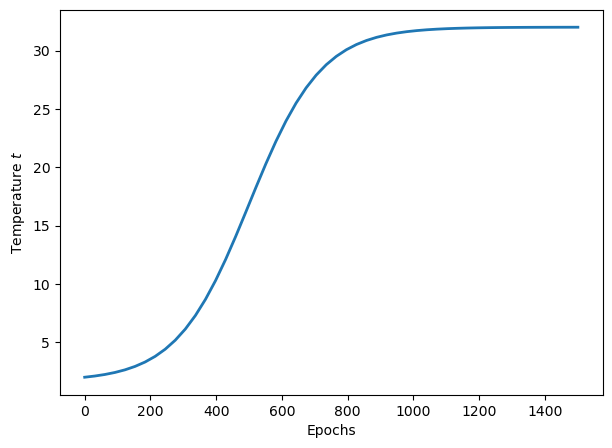

In [9]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(7, 5))


plt.plot(epoch_pts,rep_pts, '-', linewidth = 2)       
plt.xlabel('Epochs')
plt.ylabel('Temperature $t$')    
plt.show()

In [52]:
from torchinfo import summary

def train_run(parameters, device, run_neptune, seed_num=42, optim_name='Adam', plot_init=True, amps_net=None):
    """
    Function to call for launching the training run
    """
    # Fix for the generator : For reproducibility between cpu and MPS
    random_gen_cpu = Generator(device='cpu')
    random_gen_cpu.manual_seed(seed_num)
    torch.manual_seed(seed_num)   
    torch.cuda.manual_seed(seed_num)
    
    
    # Define and register the networks
    if amps_net is None:
        amps_net = ModuleAmplitudes(parameters['layer_list'], parameters['zeros'], disconnected=parameters['disconnected'], complex_pred=parameters['complex_pred'], zeros_learn = parameters['zeros_learn'], device=device)
    else:
        amps_net = amps_net
    
    # Fix for the generator : For reproducibility between cpu and MPS (Now only used for RNG of samples)
    #random_gen_cpu = Generator(device='cpu')
    #random_gen_cpu.manual_seed(42)
    #torch.manual_seed(42)   
    #torch.cuda.manual_seed(42)
    
    
    
    run_neptune["config/ampltiudemodel"] = type(amps_net).__name__
    with open(f"model_arch.txt", "w") as f:
        f.write(str(summary(amps_net, verbose=0, col_width=16, device=device)))
        f.write(str(amps_net))
    if plot_init:
        print(str(amps_net))
    
    # Define and register the optimizer and scheduler
    if optim_name == 'Adam':
        optimizer = torch.optim.Adam(amps_net.parameters(), lr=parameters['learning_rate'], betas=(parameters['beta1'], parameters['beta2']), weight_decay=0.000000)
    elif optim_name == 'LBFGS':
        optimizer = torch.optim.LBFGS(amps_net.parameters(), lr=parameters['learning_rate'], max_iter=10, history_size=20, line_search_fn = None, tolerance_grad=1e-20, tolerance_change=1e-20)
    elif optim_name =='Both':   
        optimizer1 = torch.optim.Adam(amps_net.parameters(), lr=parameters['learning_rate'], betas=(parameters['beta1'], parameters['beta2']))
        optimizer2 = torch.optim.LBFGS(amps_net.parameters(), lr=parameters['learning_rate'], max_iter=10, history_size=20, line_search_fn = None, tolerance_grad=1e-20, tolerance_change=1e-20)
        optimizer = [optimizer1, optimizer2]
    run_neptune["config/optimizer"] = optim_name
    
    
    if parameters['lr_scheduler']:
        #lr_scheduler = ExponentialLR(optimizer=optimizer, gamma=0.9995)
        lr_scheduler = MultiplicativeLR(optimizer=optimizer, lr_lambda=lambda step: scheduler_rate_exp(step, 0.999, parameters['epochs_num'], parameters['repulsive_epochs'][1]))
        #lr_scheduler = LambdaLR(optimizer=optimizer, lr_lambda=lambda step: scheduler_rate(step, 1/parameters['learning_rate'], 2048, 750))
    else:
        lr_scheduler = None
    
    # Create the simulation, train it and return the trained result
    netsolver = PhaseNetSolverA(parameters, amps_net, optimizer, random_gen_cpu, lr_scheduler, device=device)
    
    # Plot the initialization conditions at fixed z_1
    if plot_init:
        plot_init_values(netsolver.amps_net)
    
    # Launch the training run
    netsolver.train(run_neptune)

    return netsolver

In [53]:
def create_solver_with_net(parameters, device, amps_net, seed_num=42):
    """
    Function to call for creating the netsolver framework
    """
    # Fix for the generator : For reproducibility between cpu and MPS
    random_gen_cpu = Generator(device='cpu')
    random_gen_cpu.manual_seed(seed_num)
    torch.manual_seed(seed_num)   
    torch.cuda.manual_seed(seed_num)
    
    
    # Define the optimizer and scheduler
    optimizer = torch.optim.Adam(amps_net.parameters(), lr=parameters['learning_rate'], betas=(parameters['beta1'], parameters['beta2']), weight_decay=0.000000)
    lr_scheduler = MultiplicativeLR(optimizer=optimizer, lr_lambda=lambda step: scheduler_rate_exp(step, 0.999, parameters['epochs_num'], parameters['repulsive_epochs'][1]))
    
    # Create the simulation, train it and return the trained result
    netsolver = PhaseNetSolverA(parameters, amps_net, optimizer, random_gen_cpu, lr_scheduler, device=device)

    return netsolver

In [54]:
def eval_run_amp(trained_solver, params, device, neptune_run, steps_eval=100, num=None):
    """
    At evaluation we verify if the integral equation is satisfied. 
    For this we take a larger sample of z points
    """
    
    str_add = '_' + str(num) if num is not None else ''
    
    # Make sure we are in evaluation mode
    trained_solver.amps_net.eval()
    
    with torch.no_grad(): 
        
        # Create the evaluation points and compute the phase at those points
        zpointstest = torch.linspace(-1,1,steps=steps_eval, device=device)
        test_data = trained_solver.amps_net(zpointstest.view(-1,1))
        
        mod_res = test_data[0].squeeze().cpu().numpy()
        phase_1 = test_data[1].squeeze().cpu().numpy()
        phase_2 = test_data[2].squeeze().cpu().numpy()
        
        # Also log the final loss values. Including the loss at individual z values
        trained_solver.scaled_loss = True
        eval_loss_scaled = trained_solver.loss_function(zpointstest)
        neptune_run['metrics/eval_loss_scaled' + str_add].log(eval_loss_scaled)
        
        pt_losses = trained_solver.point_loss(zpointstest)
        eval_point_loss_scaled = [pt_losses[0] , pt_losses[1]]
        
        trained_solver.scaled_loss = False
        eval_loss_base = trained_solver.loss_function(zpointstest)
        neptune_run['metrics/eval_loss_base' + str_add].log(eval_loss_base)
        
        pt_losses_non_scaled = trained_solver.point_loss(zpointstest)
        eval_point_loss_non_scaled = [pt_losses_non_scaled[0], pt_losses_non_scaled[1]]
        
    
    return zpointstest, mod_res, [phase_1, phase_2], eval_point_loss_scaled, eval_point_loss_non_scaled

In [55]:
def plot_init_values(amplitude_net, sample_points=100):
    
    with torch.no_grad(): 
        zpointstest = torch.linspace(-1,1,steps=sample_points, device=amplitude_net.device)
        test_data = amplitude_net(zpointstest.view(-1,1))
        
        mod_res = test_data[0].squeeze().cpu().numpy()
        phase_1 = test_data[1].squeeze().cpu().numpy()
        phase_2 = test_data[2].squeeze().cpu().numpy()
    
        
        plot_bmod(zpointstest, mod_res)
        plot_phases(zpointstest, [phase_1, phase_2])

##### Define the plotting functions

In [14]:
import matplotlib.pyplot as plt
from neptune.new.types import File

def sin_mu_integral(trained_solver, zpoints, keep_grad=False):
    """
    Helper function to compute the sin(\mu) variable defined in the motivation.
    This compute the relevant integral involving the differential cross section
    """
    if keep_grad:
        num_integral = trained_solver.sin_mu_integral(zpoints)
        return num_integral/trained_solver.amps_net(zpoints.view(-1,1))[0].squeeze()
    else:
        with torch.no_grad(): 
            num_integral = trained_solver.sin_mu_integral(zpoints)
            return num_integral/trained_solver.amps_net(zpoints.view(-1,1))[0].squeeze()

    
def plot_bmod(zpoints, bpoints, neptune_run=None, add_str=''):

    fig = plt.figure(figsize=(14, 10))
    plt.plot(zpoints.cpu(),bpoints, '-', linewidth = 2)       
    plt.xlabel('$z$')
    plt.ylabel('$B(z)$')    
    plt.title('Differential cross section prediction ' + add_str, fontsize = 15)
    plt.legend(['$B(z)$ predicted'])
    plt.xlim([-1,1])
    plt.show()
    
    if neptune_run is not None:
        neptune_run[f'evaluation/diff_cross_section_prediction'].upload(File.as_image(fig))
    plt.close(fig)    

    
def plot_phases(zpoints, phipoints_list, neptune_run=None, add_str=''):

    fig = plt.figure(figsize=(14, 10))
    for phipoints in phipoints_list:
        plt.plot(zpoints.cpu(),phipoints, '-', linewidth = 2)       
    plt.xlabel('$z$')
    plt.ylabel('$\phi(z)$')    
    plt.title('$\phi(z)$ prediction '+ add_str, fontsize = 15)
    plt.legend(['Network {}'.format(i+1) for i in range(len(phipoints_list))])
    plt.xlim([-1,1])
    plt.show()
    
    if neptune_run is not None:
        neptune_run[f'evaluation/phase_prediction'].upload(File.as_image(fig))
    plt.close(fig)
        

def plot_point_losses(zpoints, point_loss_data_ses, point_loss_data_noses, neptune_run):

    fig = plt.figure(figsize=(14, 10))
    for point_loss_data_s in point_loss_data_ses:
        plt.plot(zpoints.cpu(), np.log10(point_loss_data_s.cpu()), '-', linewidth = 2)  
    
    plt.gca().set_prop_cycle(None)
    for point_loss_data_nos in point_loss_data_noses:
        plt.plot(zpoints.cpu(), np.log10(point_loss_data_nos.cpu()), '--', linewidth = 2)  
    plt.xlabel('$z$')
    plt.ylabel('$\log_{10} ||\mathcal{L}(z)||_2$')    
    plt.title('Point loss evaluation', fontsize = 15)
    plt.xlim([-1,1])
    legendstr = ['Network {} : Normalized point loss'.format(i+1) for i in range(len(point_loss_data_ses))] + ['Network {} : Base point loss'.format(i+1) for i in range(len(point_loss_data_noses))]
    plt.legend(legendstr)
    plt.show()

    neptune_run[f'evaluation/point_losses_evaluation'].upload(File.as_image(fig))
    plt.close(fig)

def plot_sin_mu(zpoints, integralpoints, neptune_run):

    sinmu = max(integralpoints.cpu())
    fig2 = plt.figure(figsize=(14, 10))

    plt.plot(zpoints.cpu(),integralpoints.cpu(), 'g-', linewidth = 2)   
    plt.plot(zpoints.cpu(),sinmu.repeat(integralpoints.size(dim=0)), 'r--' )
    plt.xlabel('$z$')
    plt.ylabel('$\sin \mu(z)$')    
    plt.title('Differential cross section categorization: Learned B(z)', fontsize = 15)
    plt.xlim([-1,1])
    plt.legend(['$\sin\mu(z)$','$\sin \mu$={}'.format(str(np.round(sinmu.numpy(),4)))])
    plt.show()
    
    neptune_run[f'evaluation/sin_mu_plot'].upload(File.as_image(fig2))
    plt.close(fig2)
    

def plot_summaries(zpoints, phipoints_list, integralpoints, neptune_run=None):
    
    sinmu = max(integralpoints.cpu())
    
    fig3 = plt.figure(figsize=(14, 10))
    cmap = plt.get_cmap("tab10")
    
    legend_list = []
    for i, phipoints in enumerate(phipoints_list):
        plt.plot(zpoints.cpu(),phipoints, color=cmap(i), linestyle = '-', linewidth = 2)       
        plt.plot(zpoints.cpu(), np.sin(phipoints), color=cmap(i), linestyle = '--', linewidth = 2)       
        legend_list.extend(['Network $\phi_{}(z)$'.format(i), 'Network $\sin \phi_{}(z)$'.format(i)])
        
    plt.plot(zpoints.cpu(),integralpoints.cpu(), 'g-', linewidth = 2)   
    plt.plot(zpoints.cpu(),sinmu.repeat(integralpoints.size(dim=0)), 'r--' )
    plt.xlabel('$z$')
    plt.ylabel('$\sin \mu(z)$')    
    plt.title('Differential cross section categorization: Learned B(z)', fontsize = 15)
    plt.xlim([-1,1])
    plt.legend(legend_list + ['$\sin\mu(z)$','$\sin \mu$={}'.format(str(np.round(sinmu.numpy(),4)))])
    plt.show()
    
    if neptune_run is not None:
        neptune_run[f'evaluation/overview'].upload(File.as_image(fig3))
    plt.close(fig3)
        

##### Try out a run where we start at a fixed $z_1$ value

We will consider a domain where we know that we can recover an ambiguity. For this we follow the infinite partial wave solutions given by Atkinson

##### Plot the initial differential cross section

https://app.neptune.ai/zulap/2to2scattering/e/TOS-2023
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
ModuleAmplitudes(
  (base_f): ModuleNetAmplitude(
    (activation): ReLU()
    (positive_activ): Softplus(beta=1, threshold=20)
    (model): Sequential(
      (layer_1): Linear(in_features=1, out_features=64, bias=True)
      (activation_1): ReLU()
      (layer_2): Linear(in_features=64, out_features=64, bias=True)
      (activation_2): ReLU()
      (layer_3): Linear(in_features=64, out_features=64, bias=True)
      (activation_3): ReLU()
      (layer_4): Linear(in_features=64, out_features=64, bias=True)
      (activation_4): ReLU()
      (layer_5): Linear(in_features=64, out_features=2, bias=True)
    )
  )
)


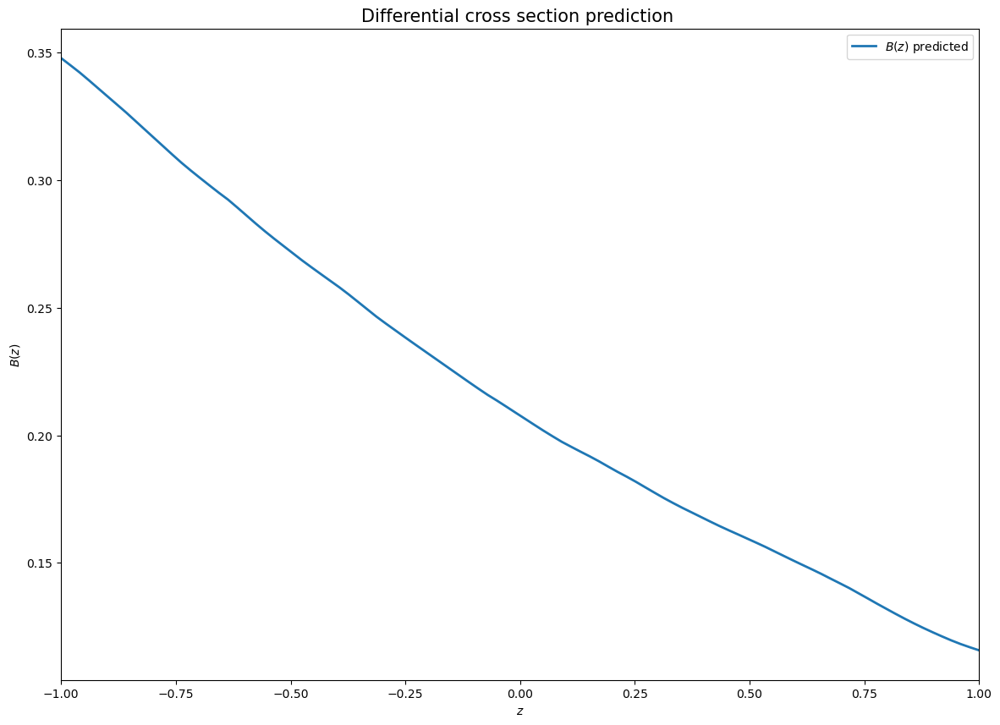

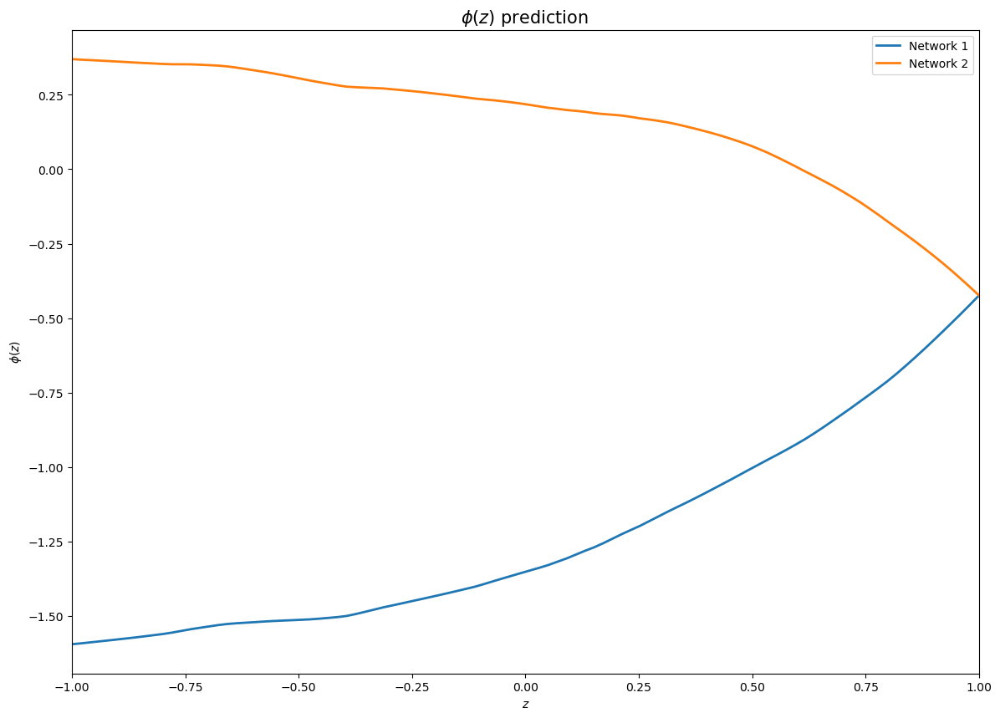

  0%|          | 0/5000 [00:00<?, ?epoch/s]

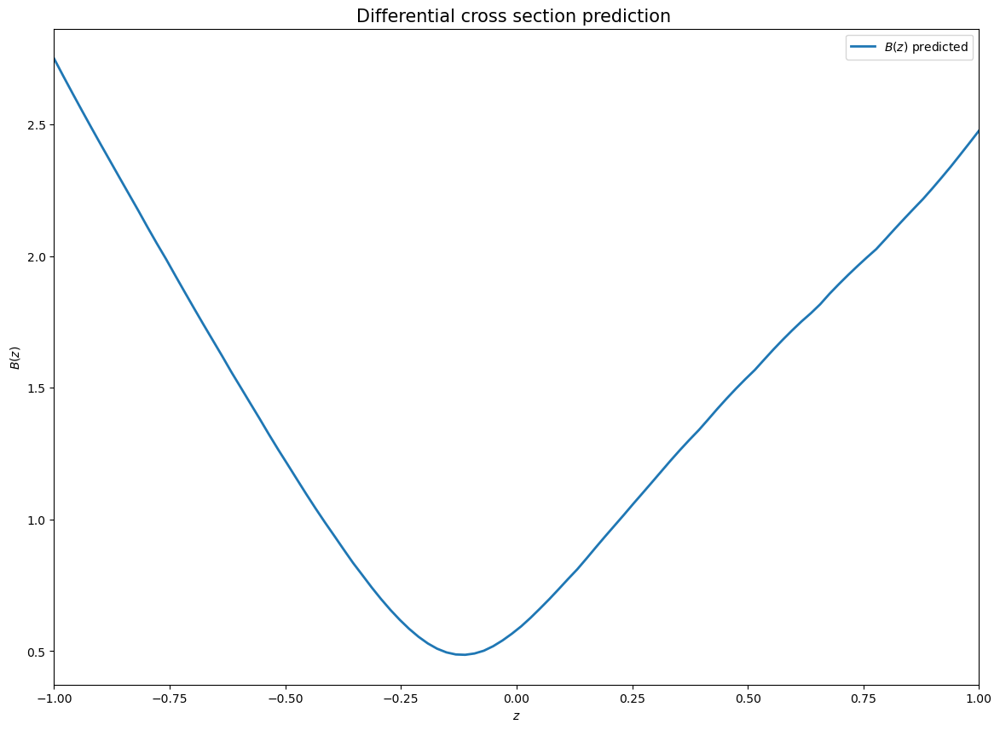

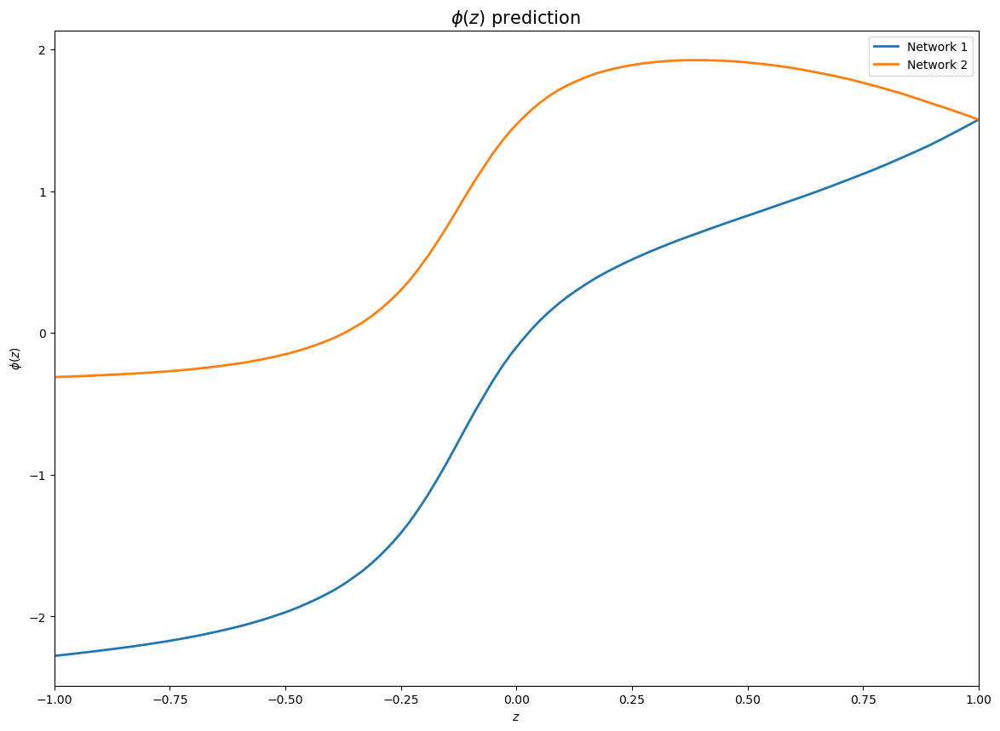

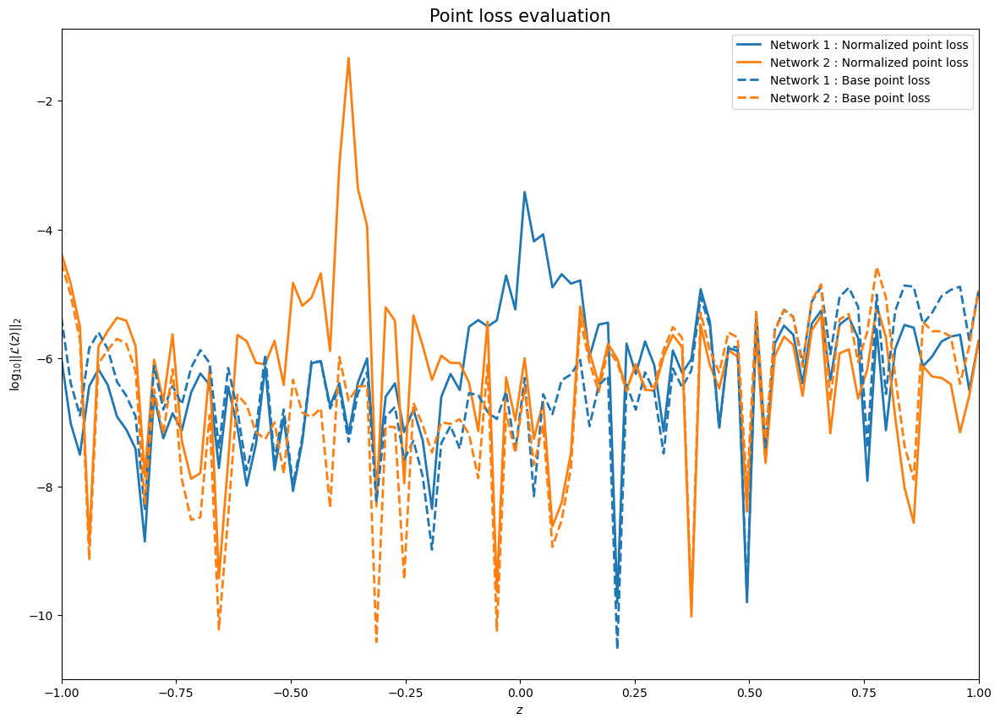

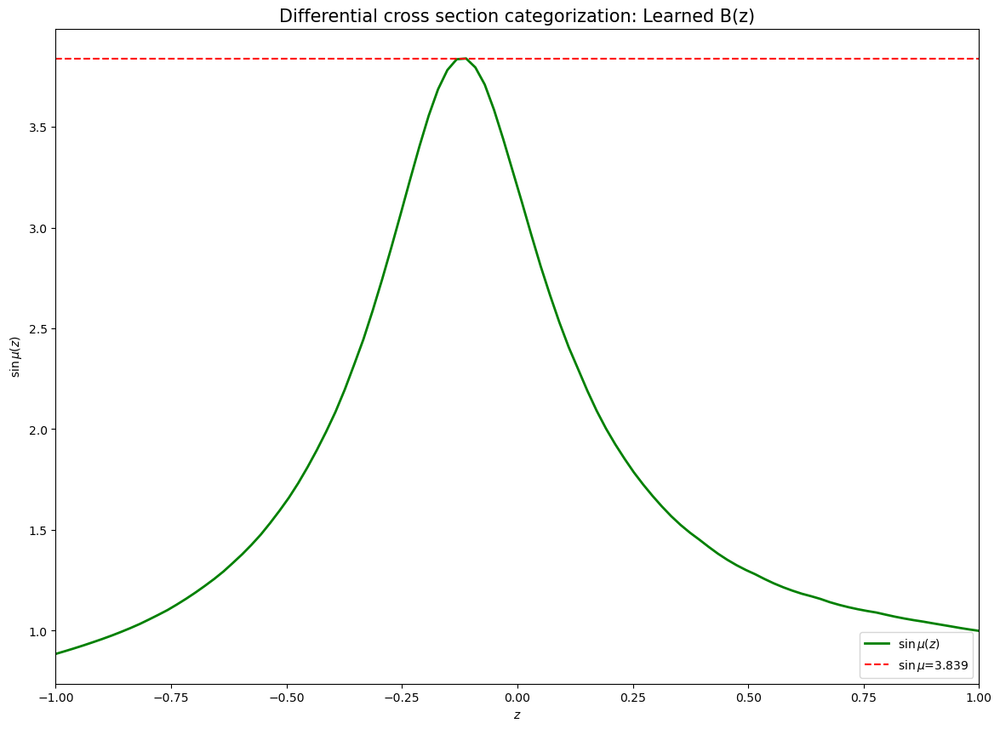

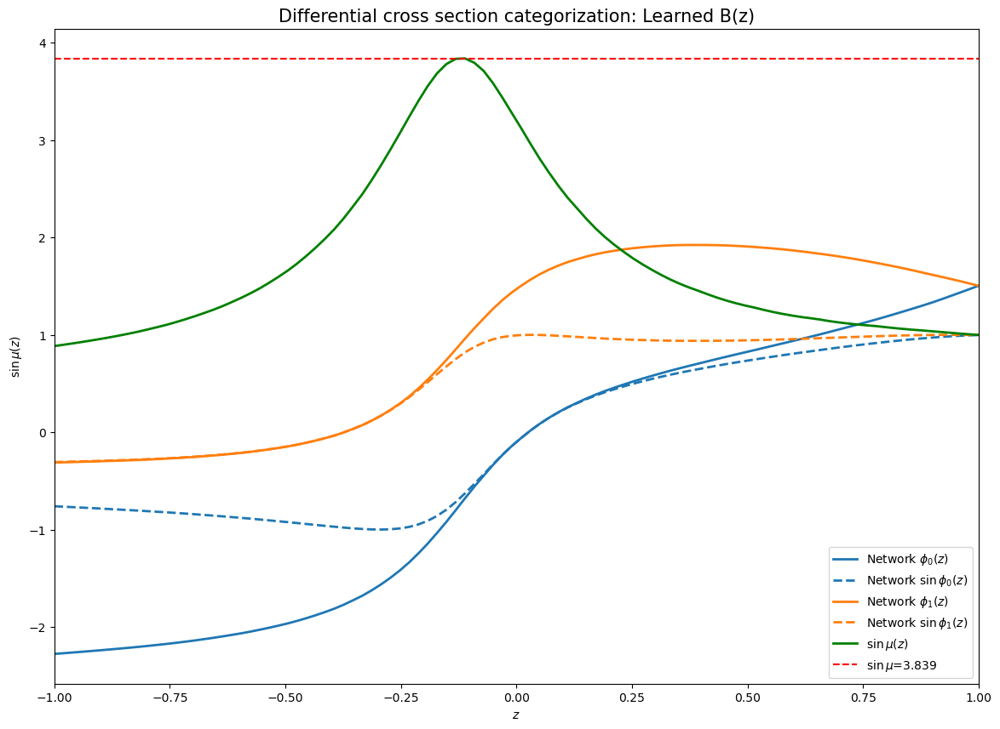

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 85 operations to synchronize with Neptune. Do not kill this process.
All 85 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-2023


In [56]:
#seeds = [42, 1, 2, 3, 4]
seeds = [42]

for seed in seeds:

    # Start the Neptune logger run
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_amb_test")

    params = {'batch_size': 64,
             'epochs_num': 5000,
             'repulsive_epochs': [0, 1000],
             #'learning_rate': 0.003,
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             'zeros': [[1.2, 0.6]],
             #'zeros': [[0.6, 0.9]],
             #'zeros': [[1.3, 0.5]],
             #'zeros': [[1.1, 0.2]],
             'zeros_learn': False, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive':2.0}

    tags = {'Ambiguity': 'Single z1', 'optimizer': 'Adam', 'Mode': 'Constant param' , 'Seed': str(seed)}
    run["sys/tags"].add(list(tags.values()))

    run['parameters'] = params


    netsolver_fixed = train_run(params, device, run, seed_num=seed, optim_name='Adam')
    
    zpointseval, modeval, phievals, eval_pt_loss_s, eval_pt_loss_no_s  = eval_run_amp(netsolver_fixed, params, device, run)

    plot_bmod(zpointseval, modeval, run)
    plot_phases(zpointseval, phievals, run)
    plot_point_losses(zpointseval, eval_pt_loss_s, eval_pt_loss_no_s, run)

    integralz = sin_mu_integral(netsolver_fixed, zpointseval)
    plot_sin_mu(zpointseval, integralz, run)

    plot_summaries(zpointseval, phievals, integralz, run)


    # Make sure to kill the Neptune logger run
    run.stop()

In [127]:
#coeffal1, coeffal2 = legendre_fit_amplitudes(netsolver.amps_net, sample_points=100, get_deltas=False, deg=20)

#print(np.abs(coeffal1)**2- np.imag(coeffal1))
#print(np.abs(coeffal2)**2- np.imag(coeffal2))

In [128]:
# [[1.3, 0.5]]
#amp1 = finite_p_wave(zpointseval.cpu().numpy(), [0.26049, 1.16736, -0.15233, -0.03918, -0.00917, -0.00210, -0.00049, -0.00011, -0.264*10**(-4), -0.624*10**(-5), -0.148*10**(-5)])
#amp2 = finite_p_wave(zpointseval.cpu().numpy(), [-0.92370, 0.94385, -0.15233, -0.03918, -0.00917, -0.00210, -0.00049, -0.00011, -0.264*10**(-4), -0.624*10**(-5), -0.148*10**(-5)], opp=True)

# [[1.2, 0.6]]
amp1 = finite_p_wave(zpointseval.cpu().numpy(), [0.15667, 1.05784, -0.18036, -0.03881, -0.00656, -0.00104, -0.00017, -0.266*10**(-4), -0.428*10**(-5), -0.697*10**(-6), -0.114*10**(-6)])
amp2 = finite_p_wave(zpointseval.cpu().numpy(), [-0.94207, 0.83471, -0.18036, -0.03881, -0.00656, -0.00104, -0.00017, -0.266*10**(-4), -0.428*10**(-5), -0.697*10**(-6), -0.114*10**(-6)], opp=True)

# [[0.6, 0.9]]
#amp1 = finite_p_wave(zpointseval.cpu().numpy(), [-0.17339, 0.67126, -0.24835, 0.03905, -0.01504, 0.00548, -0.00209, 0.00080, -0.00031, 0.00012, -0.00005])
#amp2 = finite_p_wave(zpointseval.cpu().numpy(), [-0.83284, 0.48131, -0.24835, 0.03905, -0.01504, 0.00548, -0.00209, 0.00080, -0.00031, 0.00012, -0.00005], opp=True)

In [130]:
netsolver.amps_net.eval()
with torch.no_grad():
    
    repulsive_loss = netsolver_fixed.dual_loss_ambiguity(zpointseval)

Nice plot

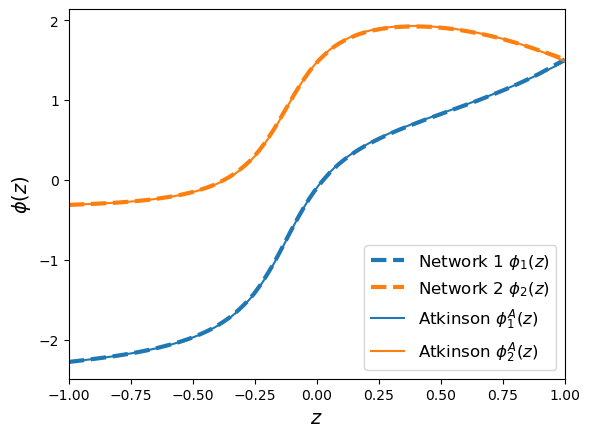

In [172]:
#fig = plt.figure(figsize=(14, 10))
fig = plt.figure()

    
plt.plot(zpointseval.cpu(),phievals[0], '--', linewidth = 3)       
plt.plot(zpointseval.cpu(),phievals[1], '--', linewidth = 3)      
plt.plot(zpointseval.cpu(),np.angle(amp1), '-', linewidth = 1.5, color='tab:blue')      
plt.plot(zpointseval.cpu(),np.angle(amp2), '-', linewidth = 1.5, color='tab:orange')      
plt.xlabel('$z$', fontsize=14)
plt.ylabel('$\phi(z)$', fontsize=14)    

plt.legend(['Network {} $\phi_{}(z)$'.format(i+1, i+1) for i in range(2)] + ['Atkinson $\phi_1^A(z)$','Atkinson $\phi_2^A(z)$'], fontsize=12)
plt.xlim([-1,1])

#adding text inside the plot
#plt.text(0.5, phievals[0].mean(), 'Loss $L_B$ = {:.2e} (solution 1)'.format(eval_pt_loss_no_s[0].mean()), fontsize = 12)
#plt.text(0.5,  phievals[1].mean(), 'Loss $L_B$ = {:.2e} (solution 2)'.format(eval_pt_loss_no_s[1].mean()), fontsize = 12)
#plt.text(0.5, (phievals[0].mean()+phievals[1].mean())/2, 'Repulsive loss $L_R$ = {:.2e}'.format(repulsive_loss), fontsize = 12)

plt.show()
#run[f'evaluation/learned_solutions_1'].upload(File.as_image(fig))

fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Atkinson_infinite/phases_1.2_0.6.pdf',bbox_inches='tight')

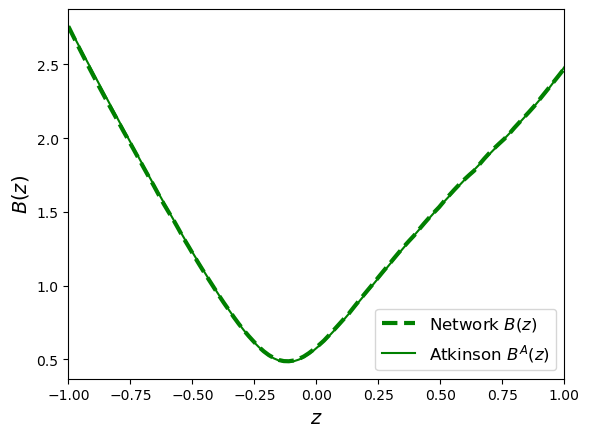

In [180]:
#fig = plt.figure(figsize=(14, 10))
fig = plt.figure()
    
plt.plot(zpointseval.cpu(),modeval, '--', linewidth = 3, c='g')       
plt.plot(zpointseval.cpu(),np.abs(amp1), '-', linewidth = 1.5, c='g')  
plt.xlabel('$z$', fontsize=14)
plt.ylabel('$B(z)$', fontsize=14)    

plt.legend(['Network $B(z)$'] + ['Atkinson $B^A(z)$'], fontsize=12)
plt.xlim([-1,1])
plt.show()
#run[f'evaluation/learned_cross_section'].upload(File.as_image(fig))
fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Atkinson_infinite/bmod_1.2_0.6.pdf',bbox_inches='tight')

In [26]:
# Make sure to kill the Neptune logger run
run.stop()

In [27]:
netsolver.amps_net.eval()
with torch.no_grad():
    
    repulsive_loss = netsolver.dual_loss_ambiguity(zpointseval)
    print(repulsive_loss)

tensor(1.1921e-07, device='mps:0')


/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/torch/_tensor_str.py:103: UserWarning: The operator 'aten::bitwise_and.Tensor_out' is not currently supported on the MPS backend and will fall back to run on the CPU. This may have performance implications. (Triggered internally at  /Users/runner/miniforge3/conda-bld/pytorch-recipe_1660136169395/work/aten/src/ATen/mps/MPSFallback.mm:11.)
  nonzero_finite_vals = torch.masked_select(tensor_view, torch.isfinite(tensor_view) & tensor_view.ne(0))


Use the pre-trained network to survey another part of the $z_1$ plane

https://app.neptune.ai/zulap/2to2scattering/e/TOS-2031
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
ModuleAmplitudes(
  (base_f): ModuleNetAmplitude(
    (activation): ReLU()
    (positive_activ): Softplus(beta=1, threshold=20)
    (model): Sequential(
      (layer_1): Linear(in_features=1, out_features=64, bias=True)
      (activation_1): ReLU()
      (layer_2): Linear(in_features=64, out_features=64, bias=True)
      (activation_2): ReLU()
      (layer_3): Linear(in_features=64, out_features=64, bias=True)
      (activation_3): ReLU()
      (layer_4): Linear(in_features=64, out_features=64, bias=True)
      (activation_4): ReLU()
      (layer_5): Linear(in_features=64, out_features=2, bias=True)
    )
  )
)


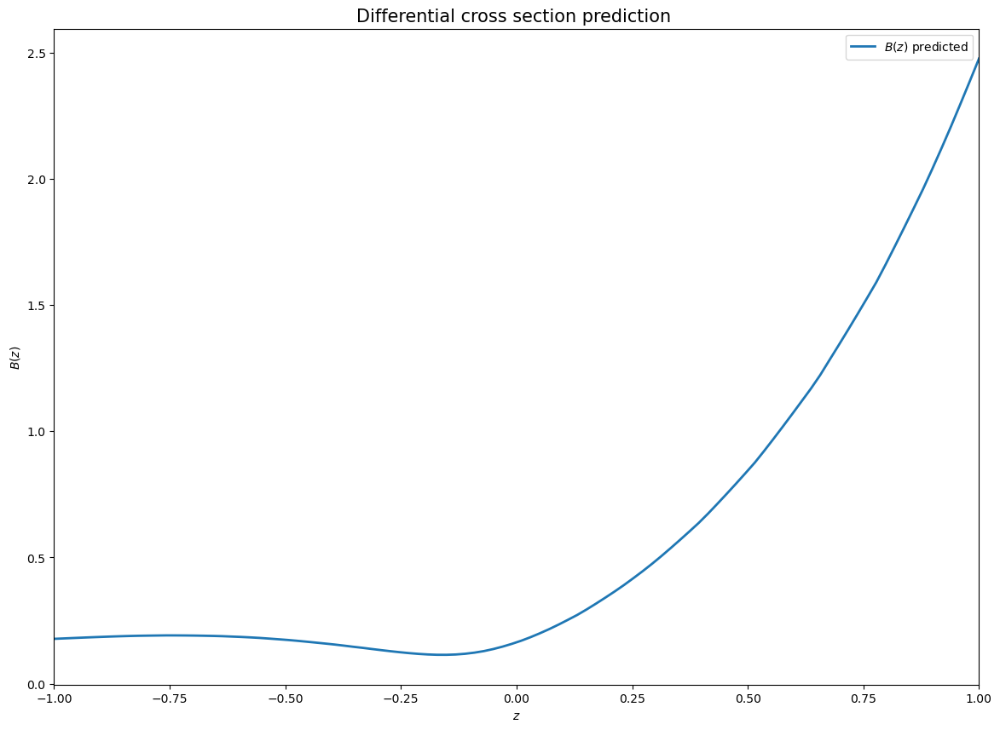

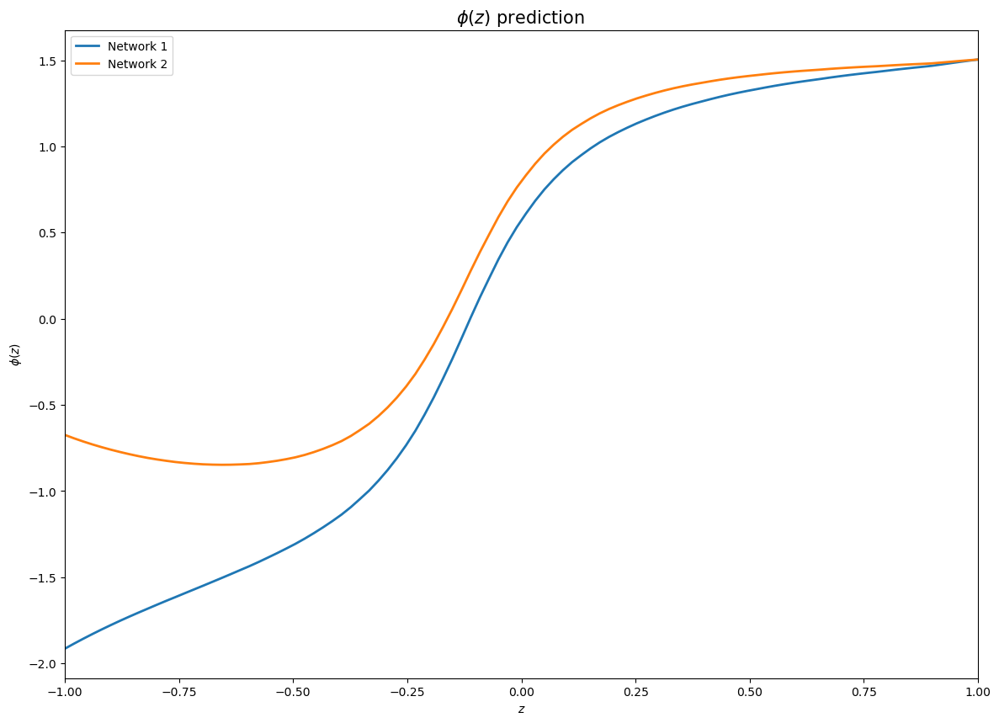

  0%|          | 0/15000 [00:00<?, ?epoch/s]

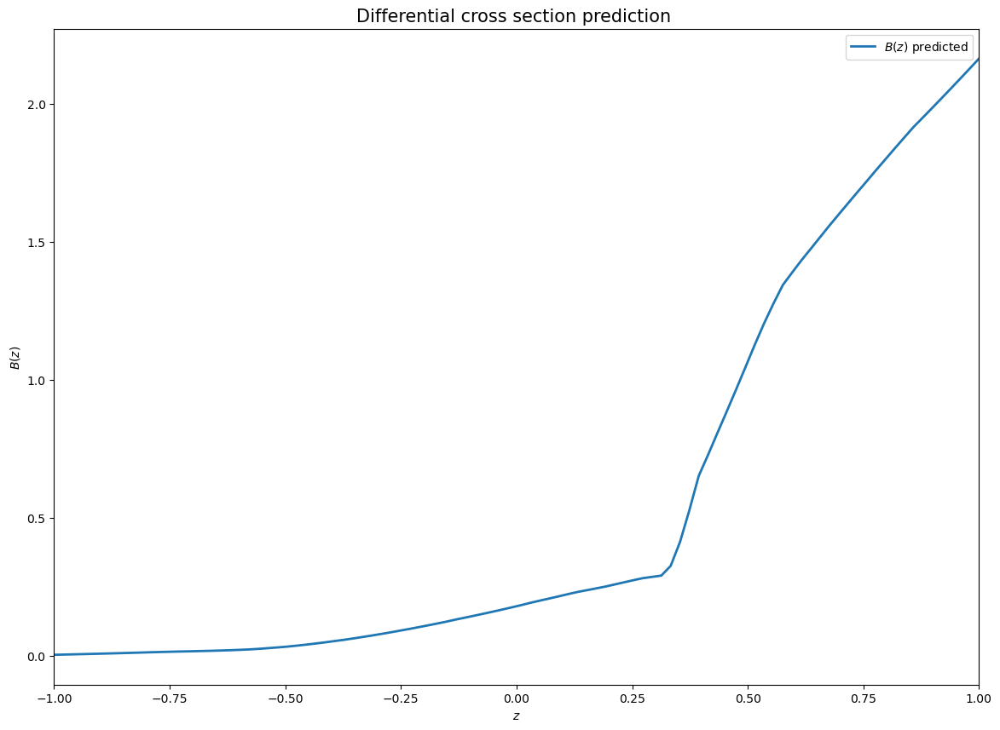

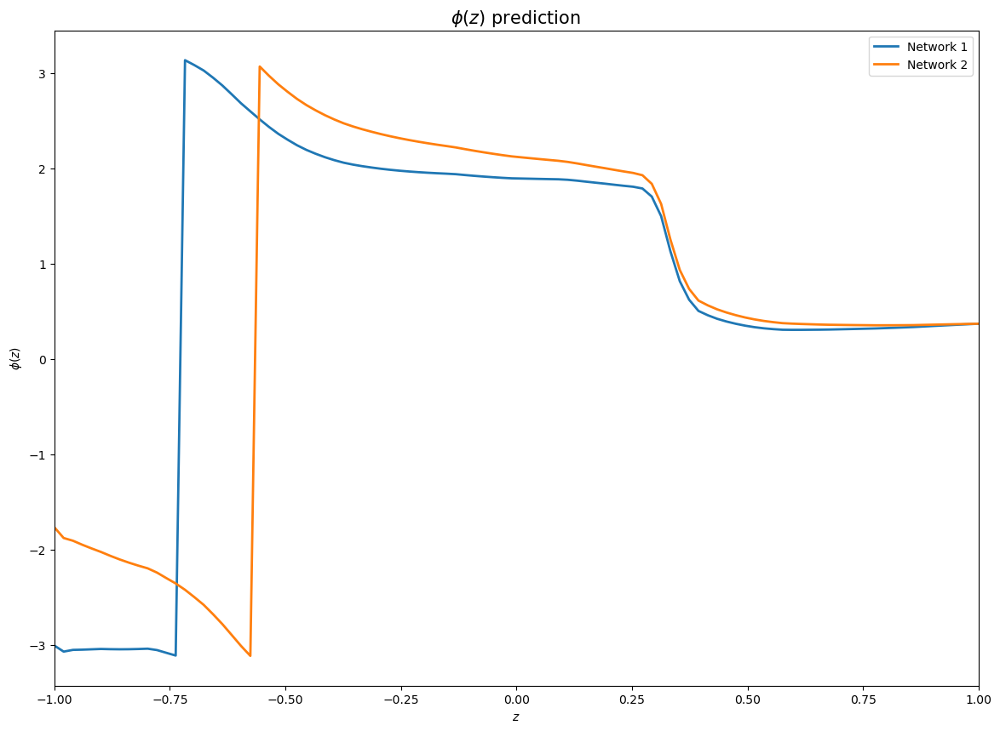

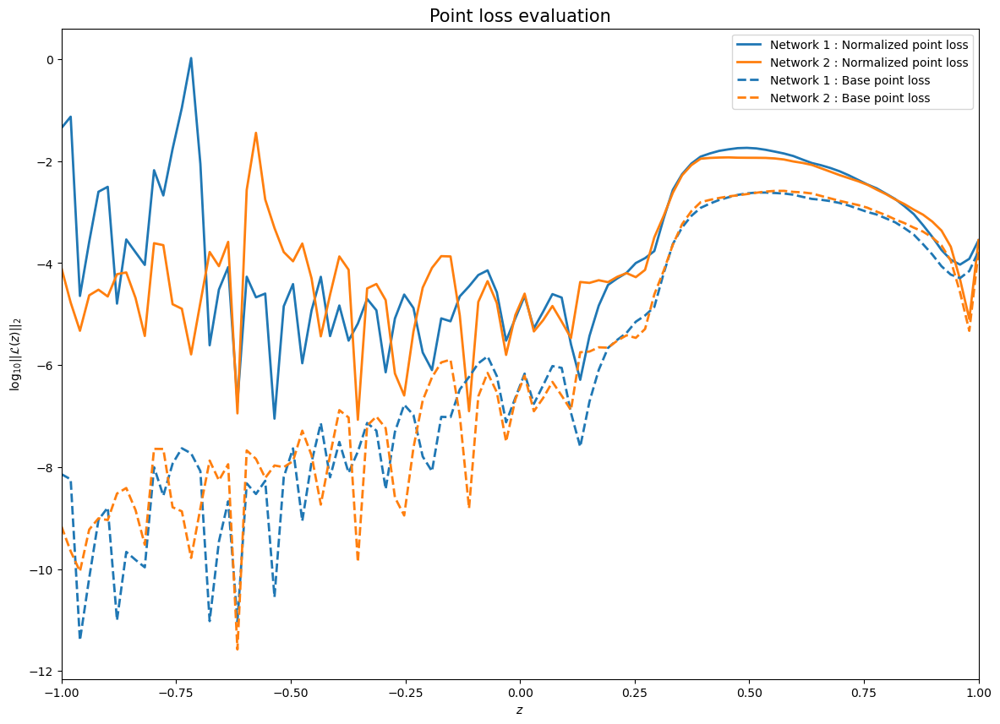

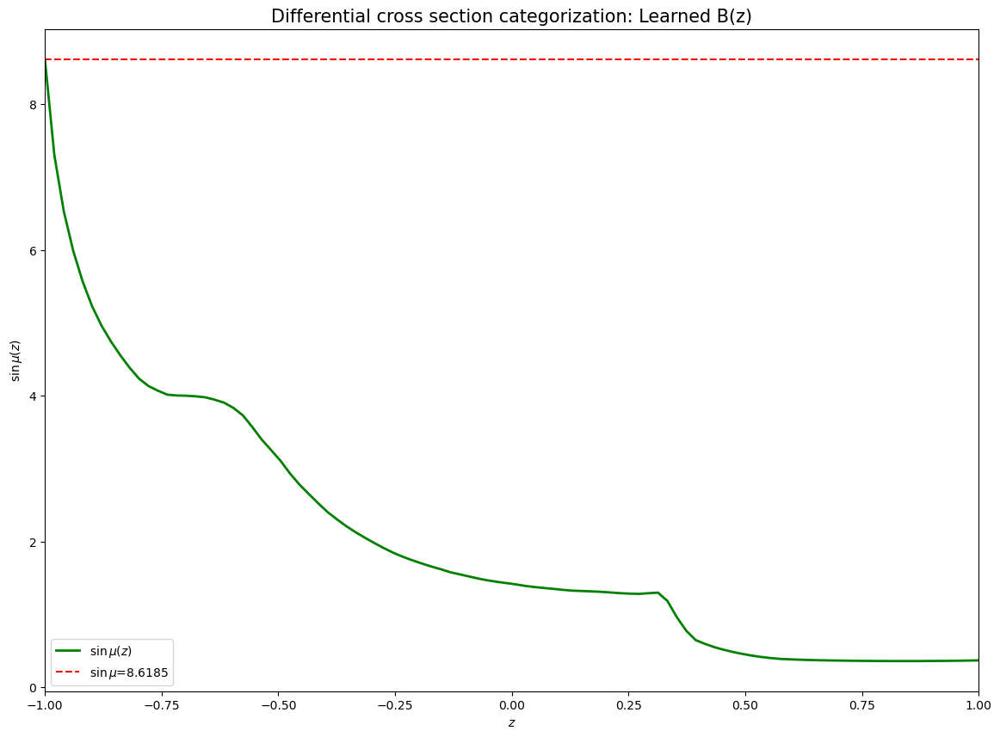

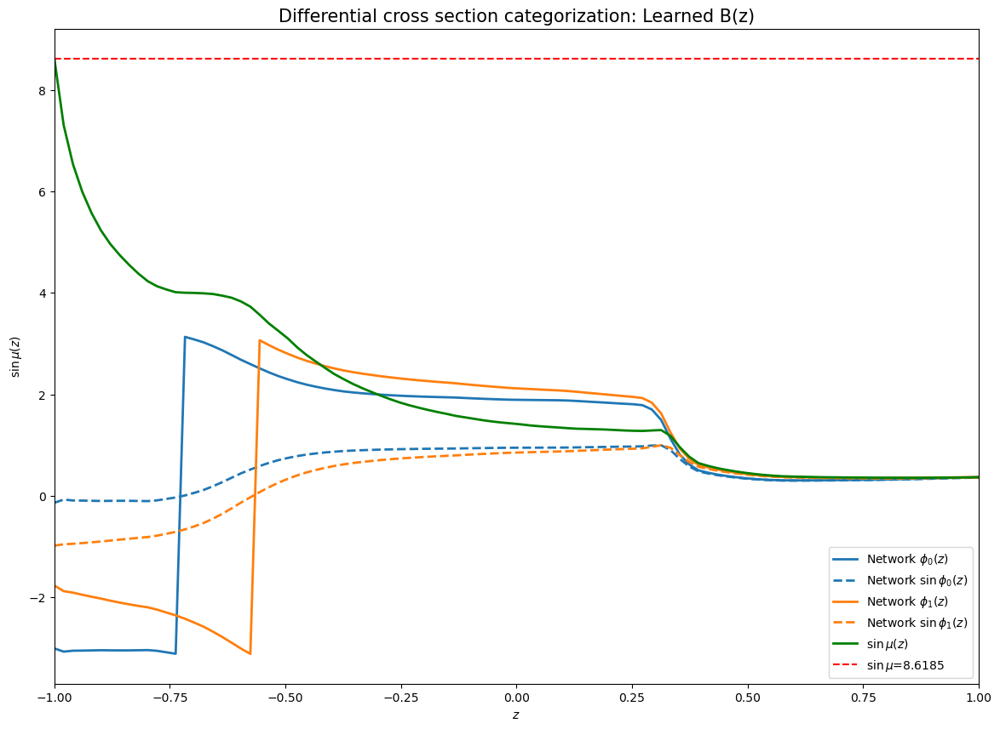

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 24 operations to synchronize with Neptune. Do not kill this process.
All 24 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-2031


In [80]:
#seeds = [42, 1, 2, 3, 4]
seeds = [42]
from copy import deepcopy

for seed in seeds:

    # Start the Neptune logger run
    run2 = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_amb_test")

    params2 = {'batch_size': 64,
             'epochs_num': 15000,
             'repulsive_epochs': [0, 1000],
             #'learning_rate': 0.003,
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             'zeros': [[-1.4, 0.4]],
             #'zeros': [[1.99, 0.5]],
             'zeros_learn': False, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive':10.0}
    
    
    # Start from the same pretrained network
    pre_trained_amps_z1=deepcopy(netsolver_fixed.amps_net)
    pre_trained_amps_z1.zeros = params2['zeros']
    
    tags = {'Ambiguity': 'Single z1', 'optimizer': 'Adam', 'Mode': 'Constant param' , 'Seed': str(seed)}
    run2["sys/tags"].add(list(tags.values()))

    run2['parameters'] = params2
    
    netsolver_fixed2 = train_run(params2, device, run2, seed_num=seed, optim_name='Adam', plot_init=True, amps_net=pre_trained_amps_z1)
    
    zpointseval, modeval2, phievals2, eval_pt_loss_s2, eval_pt_loss_no_s2  = eval_run_amp(netsolver_fixed2, params2, device, run2)

    plot_bmod(zpointseval, modeval2, run2)
    plot_phases(zpointseval, phievals2, run2)
    plot_point_losses(zpointseval, eval_pt_loss_s2, eval_pt_loss_no_s2, run2)

    integralz2 = sin_mu_integral(netsolver_fixed2, zpointseval)
    plot_sin_mu(zpointseval, integralz2, run2)

    plot_summaries(zpointseval, phievals2, integralz2, run2)

    # Make sure to kill the Neptune logger run
    run2.stop()

##### Do a scan over $z_1$ values

Now look to do an automatic scan over the $z_1$ plane. At each point we will log the loss along with the computed value of $\sin \mu$ at each point. The idea is to iterate over each point multiple time and retain the lowest possible loss. The loss is only retained if the associated repulsive loss does not go above a given threshold.

In [16]:
 def test_ambiguity(zsamples, solver_net):
        
        sample_data = solver_net.amps_net(zsamples.view(-1,1))
             
        target = torch.stack((torch.cos(sample_data[1].squeeze()), torch.sin(sample_data[1].squeeze())))
        model_input1 = torch.stack((torch.cos(sample_data[2].squeeze()), torch.sin(sample_data[2].squeeze())))
        model_input2 = torch.stack((-torch.cos(sample_data[2].squeeze()), torch.sin(sample_data[2].squeeze())))

         # Maybe MSE makes more sense here since we are just comparing functions in the first place
        loss_out1 = F.mse_loss(model_input1, target)
        loss_out2 = F.mse_loss(model_input2, target)
        

        return loss_out1, loss_out2

In [25]:
zsamplestest = torch.linspace(-1,1,steps=100, device=device)

In [17]:
def eval_run_scan(trained_solver, params, device, neptune_run=None, steps_eval=100):
    """
    At evaluation we verify if the integral equation is satisfied. 
    For this we take a larger sample of z points
    """
    
    # Make sure we are in evaluation mode
    trained_solver.amps_net.eval()
    
    with torch.no_grad(): 
        
        # Create the evaluation points and compute the phase at those points
        zpointstest = torch.linspace(-1,1,steps=steps_eval, device=device)
                
        # Also log the final loss values. Including the loss at individual z values
        trained_solver.scaled_loss = True
        eval_loss_scaled = trained_solver.loss_function(zpointstest)
        
        if neptune_run is not None:
            neptune_run['metrics/eval_loss_scaled'].log(eval_loss_scaled)
        
        trained_solver.scaled_loss = False
        eval_loss_base = trained_solver.loss_function(zpointstest)
        if neptune_run is not None:
            neptune_run['metrics/eval_loss_base'].log(eval_loss_base)
        
        # Get the repulsive loss using the initial p_value
        trained_solver.p_value = params['p_value']
        repulsive_loss = trained_solver.dual_loss_ambiguity(zpointstest)
        if neptune_run is not None:
            neptune_run['metrics/eval_loss_repulsive'].log(repulsive_loss)

    
    return zpointstest, eval_loss_base, eval_loss_scaled, repulsive_loss

Plotting routines. We must first start by looking at the most promising seed at each point. It is the one with the lowest base loss, provided the repulsive loss stays under a given treshold. Otherwise we discard the point.

In [18]:
from copy import deepcopy 

def update_log_results(log_results, repulsive_threshold=0.5, base_threshold=0.001):
    log_res = deepcopy(log_results)
    mask_repulsive = log_res['repulsive_loss'] < repulsive_threshold
    mask_base_loss = log_res['base_loss'] < base_threshold
    index_seed = np.array([[np.nan if len(seed[mask_repulsive[i, j]]) == 0 else np.argmin(seed[mask_repulsive[i, j]]) for j, seed in enumerate(line)] for i, line in enumerate(log_res['base_loss'])])
    
    min_base_loss = np.array([[np.nan if np.isnan(index_seed[i,j]) else seed[int(index_seed[i,j])] for j, seed in enumerate(line)] for i, line in enumerate(log_res['base_loss'])])
    min_scale_loss = np.array([[np.nan if np.isnan(index_seed[i,j]) else seed[int(index_seed[i,j])] for j, seed in enumerate(line)] for i, line in enumerate(log_res['scale_loss'])])
    min_sin_mu = np.array([[np.nan if np.isnan(index_seed[i,j]) else seed[int(index_seed[i,j])] for j, seed in enumerate(line)] for i, line in enumerate(log_res['sinmu'])])
    min_sin_mu_cut = np.array([[np.nan if np.isnan(index_seed[i,j]) or not mask_base_loss[i, j, index_seed[i,j]] else seed[int(index_seed[i,j])] for j, seed in enumerate(line)] for i, line in enumerate(log_res['sinmu'])])
    min_repulsive_loss = np.array([[np.nan if np.isnan(index_seed[i,j]) else seed[int(index_seed[i,j])] for j, seed in enumerate(line)] for i, line in enumerate(log_res['repulsive_loss'])])
    
    log_res['base_loss'] = min_base_loss
    log_res['scale_loss'] = min_scale_loss
    log_res['sinmu'] = min_sin_mu
    log_res['sinmucut'] = min_sin_mu_cut
    log_res['repulsive_loss'] = min_repulsive_loss
    
    return log_res

In [19]:
def simple_update_log(log_results, base_threshold=0.001):
    log_res = deepcopy(log_results)
    mask_base_loss = log_res['base_loss'] < base_threshold
    
    min_sin_mu_cut = np.array([[np.nan if not mask_base_loss[i, j] else val for j, val in enumerate(line)] for i, line in enumerate(log_res['sinmu'])])
    log_res['sinmucut'] = min_sin_mu_cut

    return log_res

Routines for plotting the Atkinson bounds

In [20]:
# Define Atkinson eq.3.24 and 3.12
def eqn1(x, y):
    return (x**2 + y**2 - 2*x)

def eqn1b(x, y):
    return (y - 1)

# Define Atkinson eq.3.21 and 3.13
def eqn2(x, y):
    return (x**2 + y**2 - 2*x+1)**(1/2)*(3/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
    #return (x**2+y**2-1)

def eqn2b(x, y):
    return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)

def eqncirc(x, y):
    return (x**2+y**2-1)
    

def plot_atkinson_bound():
    # Generate a grid of x and y values
    x = np.linspace(0, 2.1, 100)
    y = np.linspace(0, 1.1, 100)
    x1 = np.linspace(0, 1, 100)
    x2 = np.linspace(1, 2.1, 100)
    x3 = np.linspace(0, 1+(2/3)**(1/2), 100)
    X, Y = np.meshgrid(x, y)
    X1, Y = np.meshgrid(x1, y)
    X2, Y = np.meshgrid(x2, y)
    X3, Y = np.meshgrid(x1, y)

    # Evaluate the equation at each point on the grid
    Z1 = eqn1(X2, Y)
    Z1b = eqn1b(X1, Y)
    Z2 = eqn2(X2, Y)
    Z2b = eqn2b(X3, Y)
    Zcirc = eqncirc(X, Y)

    # Plot the solution curve
    plt.contour(X2, Y, Z1, levels=[0], colors='k')
    plt.contour(X1, Y, Z1b, levels=[0], colors='k')
    plt.contour(X2, Y, Z2, levels=[0], colors='tab:grey', linestyles='dashed')
    plt.contour(X3, Y, Z2b, levels=[0], colors='tab:grey', linestyles='dashed')
    plt.contour(X, Y, Zcirc, levels=[0], colors='k')

    # Add axis labels
    plt.xlabel('x')
    plt.ylabel('y')

In [21]:
def plot_contour_loss_curves_linear(log_results, neptune_run, log_type='base10', logging=True, atkinson_bounds=False, max_l=-2):
    # Plot the log of the loss
    if log_type == 'base10':
        base_loss = np.transpose(np.log10(log_results['base_loss']))
        scale_loss = np.transpose(np.log10(log_results['scale_loss']))
    elif log_type == 'natural':
        base_loss = np.transpose(np.log(log_results['base_loss']))
        scale_loss = np.transpose(np.log(log_results['scale_loss']))
    else:
        raise NotImplemented
        
    sin_mu = np.transpose(log_results['sinmu'])
    sin_mu_cut = np.transpose(log_results['sinmucut'])
    
    min_x = min(log_results['params'][:,0])
    max_x = max(log_results['params'][:,0])
    min_y = min(log_results['params'][:,1])
    max_y = max(log_results['params'][:,1])
    
    fig = plt.figure(figsize=(14, 10))
    
    plt.imshow(base_loss, extent=[min_x,max_x,min_y,max_y], cmap='jet', vmax=max_l, origin='lower')       
    plt.xlabel('Re$[z]$')
    plt.ylabel('Im$[z]$')    
    plt.title('Base loss landscape in $z_1$ plane', fontsize = 15)
    plt.colorbar()
    if atkinson_bounds:
        plot_atkinson_bound()
    plt.show()
    if logging:
        neptune_run[f'evaluation/contour_base_loss'].upload(File.as_image(fig))
    plt.close(fig)
    
    fig2 = plt.figure(figsize=(14, 10))

    plt.imshow(scale_loss, extent=[min_x,max_x,min_y,max_y], cmap='jet', vmax=max_l, origin='lower') 

    plt.xlabel('Re$[z]$')
    plt.ylabel('Im$[z]$')    
    plt.title('Scaled loss landscape in $z_1$ plane', fontsize = 15)
    plt.colorbar()
    if atkinson_bounds:
        plot_atkinson_bound()
    plt.show()
    if logging:
        neptune_run[f'evaluation/contour_scale_loss'].upload(File.as_image(fig2))
    plt.close(fig2)
    
        
    fig3 = plt.figure(figsize=(14, 10))

    plt.imshow(sin_mu, extent=[min_x,max_x,min_y,max_y], cmap='jet', vmax=5.0, origin='lower') 

    plt.xlabel('Re$[z]$')
    plt.ylabel('Im$[z]$')    
    plt.title('$\sin \mu$ landscape in $z_1$ plane', fontsize = 15)
    plt.colorbar()
    if atkinson_bounds:
        plot_atkinson_bound()
    plt.show()
    if logging:
        neptune_run[f'evaluation/contour_sinmu'].upload(File.as_image(fig3))
    plt.close(fig3)
    
    fig4 = plt.figure(figsize=(14, 10))

    plt.imshow(sin_mu_cut, extent=[min_x,max_x,min_y,max_y], cmap='jet', vmax=5.0, origin='lower')   

    plt.xlabel('Re$[z]$')
    plt.ylabel('Im$[z]$')    
    plt.title('$\sin \mu$ landscape in $z_1$ plane for small base loss values', fontsize = 15)
    plt.colorbar()
    if atkinson_bounds:
        plot_atkinson_bound()
    plt.show()
    if logging:
        neptune_run[f'evaluation/contour_sinmu_cut'].upload(File.as_image(fig4))
    plt.close(fig4)

In [141]:
# Number of sampling points in both directions
num_x = 80
num_y = 40

# Prepare the grid of points
scan_range_x = np.linspace(0.01, 1.99, num=num_x)
scan_range_y = np.linspace(0.01, 0.99, num=num_y)
param_grid = np.dstack(np.meshgrid(scan_range_x, scan_range_y)).reshape(-1, 2)

# Prepare the seeds
seeds = [42]


run_scan = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_Scan_z1")

log_res = {'params':param_grid, 'sinmu':np.empty([num_x, num_y, len(seeds)]), 'base_loss':np.empty([num_x, num_y, len(seeds)]), 'scale_loss':np.empty([num_x, num_y, len(seeds)]), 'repulsive_loss':np.empty([num_x, num_y, len(seeds)])}

for i, params_lin in enumerate(tqdm(param_grid, unit='grid_point')):
    
    x_index = i % num_x
    y_index = int((i - i % num_x)/num_x)

    params_scan = {'batch_size': 64,
             'epochs_num': 500,
             'repulsive_epochs': [0, 1000],
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             'zeros': [[scan_range_x[x_index], scan_range_y[y_index]]],
             'zeros_learn': False, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive': 0.0}
    
    
    # Start from the same pretrained network
    pre_trained_amps_z1=deepcopy(netsolver_fixed.amps_net)
    pre_trained_amps_z1.zeros = params_scan['zeros']
    
    
    tags = {'Ambiguity': 'Scanning z1', 'optimizer': 'Adam', 'Mode': 'Constant param'}
    run_scan["sys/tags"].add(list(tags.values()))

    run_scan['parameters'] = params_scan
    
    sinmu_pt = []
    base_loss_pt = []
    scale_loss_pt = []
    repulsive_loss_pt = []
    
    for seed in tqdm(seeds, unit='seed',leave = False):

        netsolver = train_run(params_scan, device, run_scan, seed_num=seed, optim_name='Adam', plot_init=False, amps_net=pre_trained_amps_z1)

        zpointseval, eval_loss_base, eval_loss_scaled, repulsive_loss = eval_run_scan(netsolver, params_scan, device, run_scan)
        sinmu = max(sin_mu_integral(netsolver, zpointseval).cpu())
        
        sinmu_pt.append(sinmu.cpu().numpy())
        base_loss_pt.append(eval_loss_base.cpu().numpy())
        scale_loss_pt.append(eval_loss_scaled.cpu().numpy())
        repulsive_loss_pt.append(repulsive_loss.cpu().numpy())
        
        path_save = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans_z1/'

        end_path = 'networks_{}_{}.pth'.format(x_index, y_index)
        path = path_save + end_path
        torch.save(netsolver.amps_net.cpu(), path)

        
    log_res['sinmu'][x_index, y_index, :] = np.array(sinmu_pt)
    log_res['base_loss'][x_index, y_index, :] = np.array(base_loss_pt)
    log_res['scale_loss'][x_index, y_index, :] = np.array(scale_loss_pt)
    log_res['repulsive_loss'][x_index, y_index, :] = np.array(repulsive_loss_pt)


https://app.neptune.ai/zulap/2to2scattering/e/TOS-1976
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


  0%|          | 0/3200 [00:00<?, ?grid_point/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout
Communication with Neptune restored!


  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:01<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/learning_rate. Invalid point: 2023-05-26T18:52:00.452Z
Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/train_loss. Invalid point: 2023-05-26T18:52:00.460Z
Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/train_loss_amp2. Invalid point: 2023-05-26T18:52:00.493Z
Error occurred during asynchronous operation processing: Timestamp must be non-decreasing for series attribute: metrics/train_loss_amp1. Invalid point: 2023-05-26T18:52:00.493Z


  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

In [142]:
path_save = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans_z1/'

for key in log_res.keys():
    end_path = '_scanz1.npy'
    path = path_save + str(key) + end_path
    np.save(path, log_res[key])

In [143]:
new_log = update_log_results(log_res, repulsive_threshold=2.2, base_threshold=0.0001)

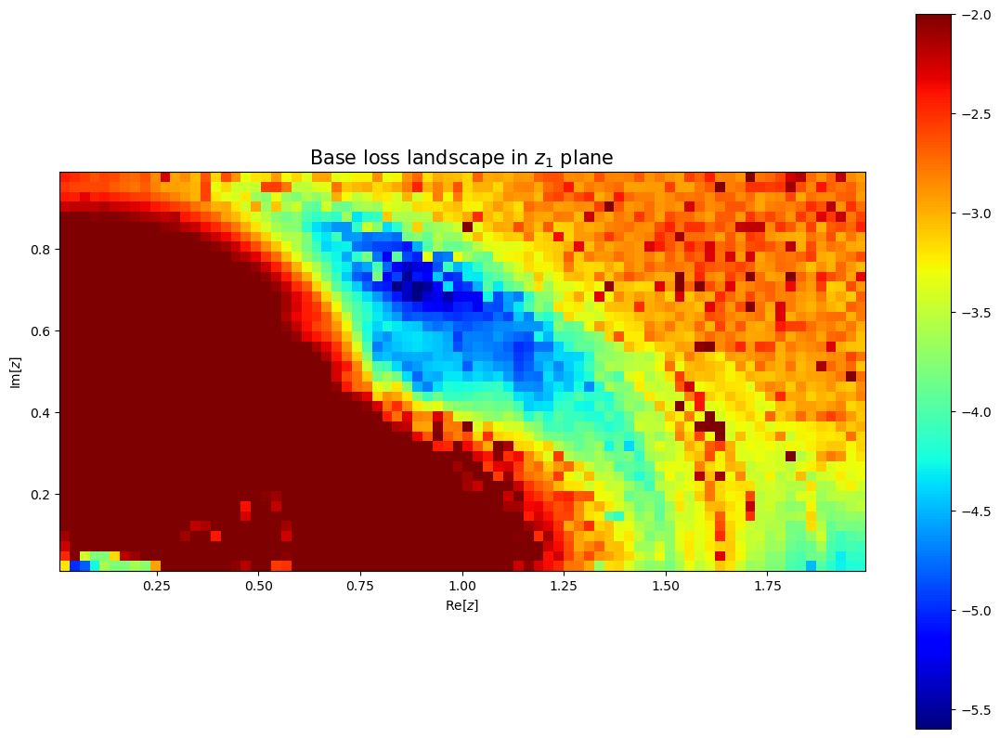

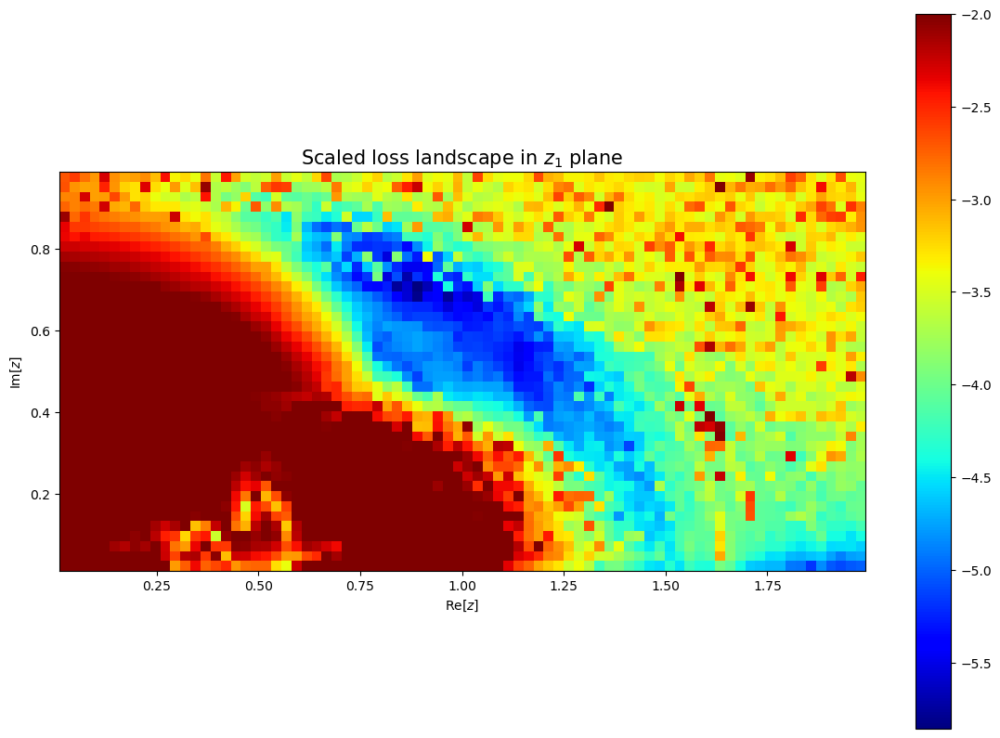

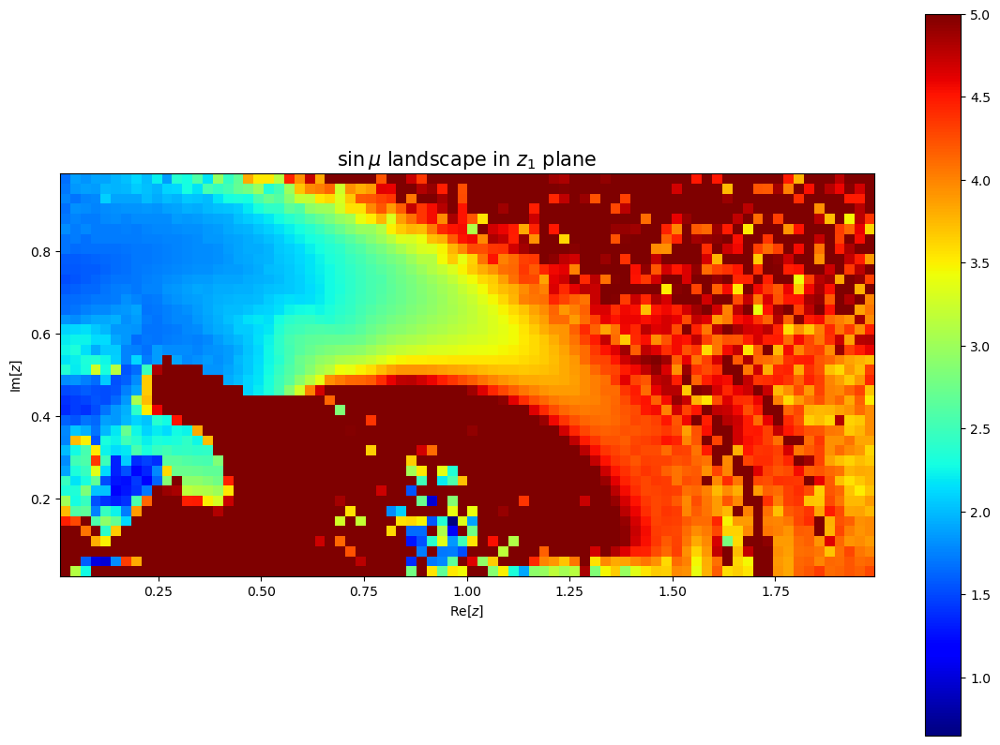

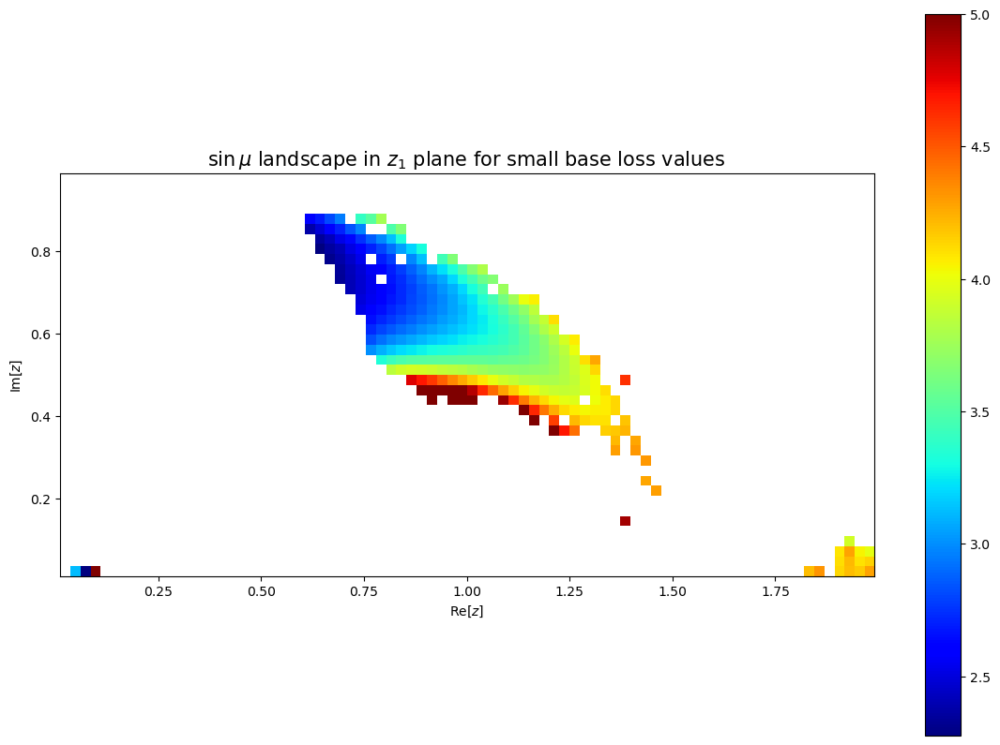

In [144]:
plot_contour_loss_curves_linear(new_log, run_scan, log_type='base10', logging=True)

In [145]:
# Make sure to kill the Neptune logger run
run_scan.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 4 operations to synchronize with Neptune. Do not kill this process.
All 4 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1976


### Learning the $z_1$ plane in one go

Up till now we have been learning the ambiguity at a fiex value of $z_1$, by parametrizing $F(z)$ as a neural network. Instead we can try to learn $F(z,z_1)$ directly along the whole space. This requires a few changes in the architecture. Add 2 inputs per zero that we take out

### Learning multiple $z_1$ values at once

##### Start by pre-training the network at some fixed $z_1$ value where we can check that the solution is valid

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1781
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
ModuleAmplitudes(
  (base_f): ModuleNetAmplitude(
    (activation): ReLU()
    (positive_activ): Softplus(beta=1, threshold=20)
    (model): Sequential(
      (layer_1): Linear(in_features=3, out_features=64, bias=True)
      (activation_1): ReLU()
      (layer_2): Linear(in_features=64, out_features=64, bias=True)
      (activation_2): ReLU()
      (layer_3): Linear(in_features=64, out_features=64, bias=True)
      (activation_3): ReLU()
      (layer_4): Linear(in_features=64, out_features=64, bias=True)
      (activation_4): ReLU()
      (layer_5): Linear(in_features=64, out_features=2, bias=True)
    )
  )
)


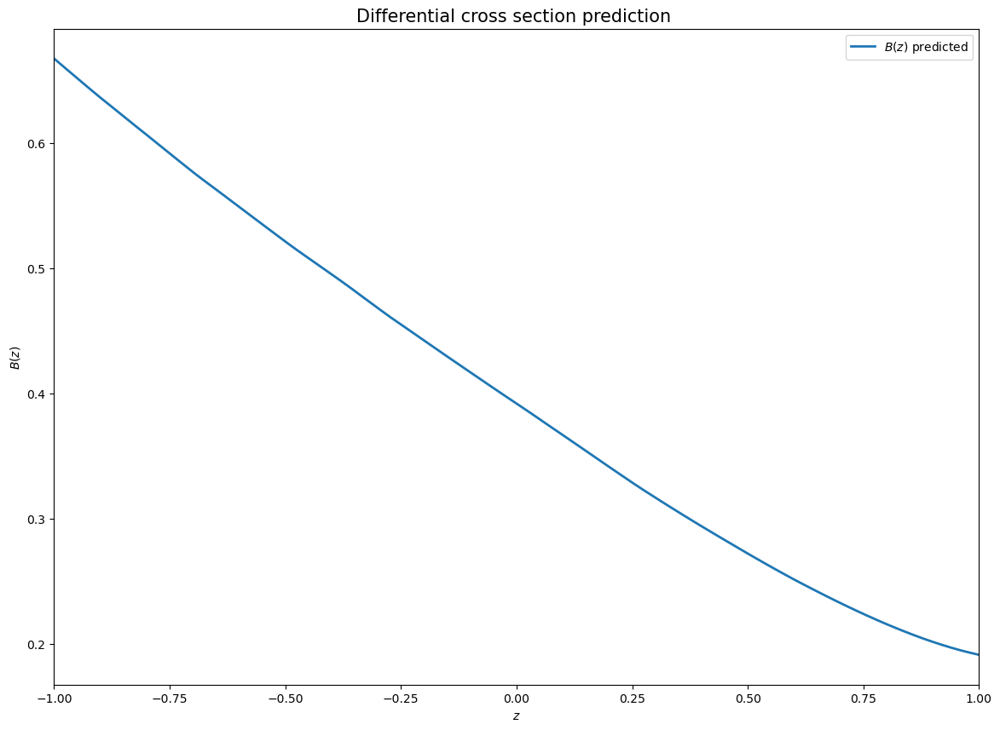

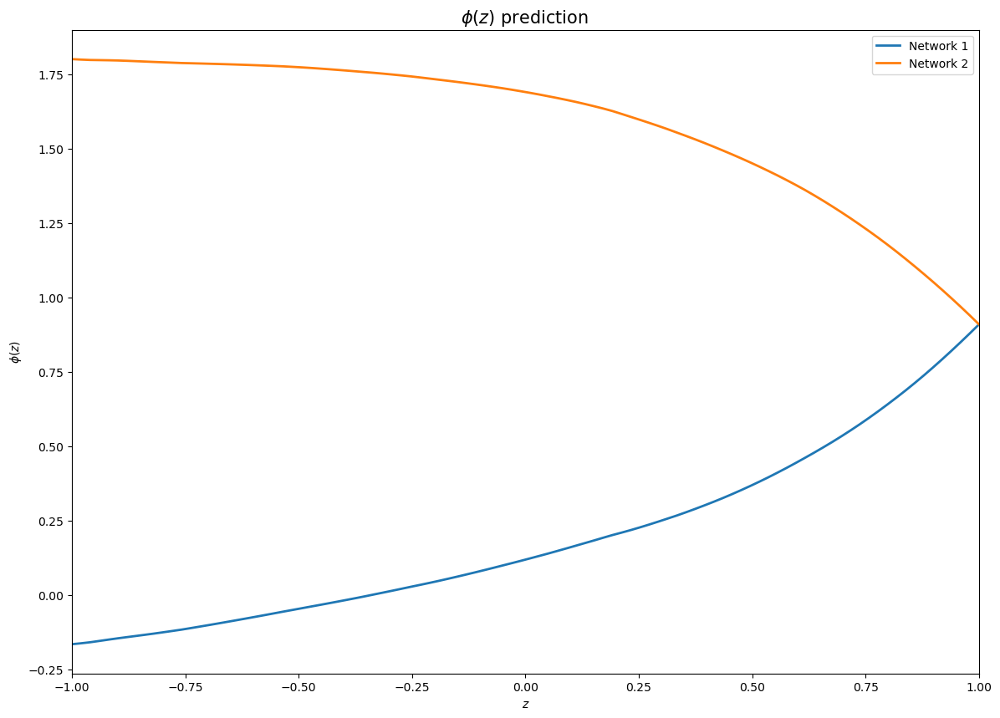

  0%|          | 0/2500 [00:00<?, ?epoch/s]

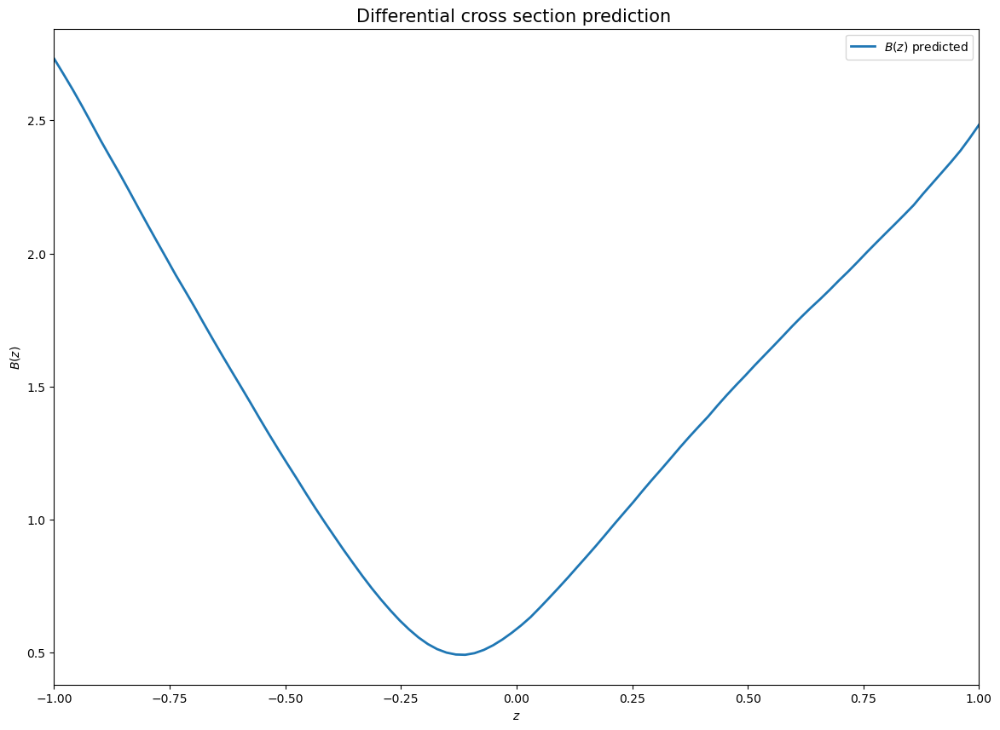

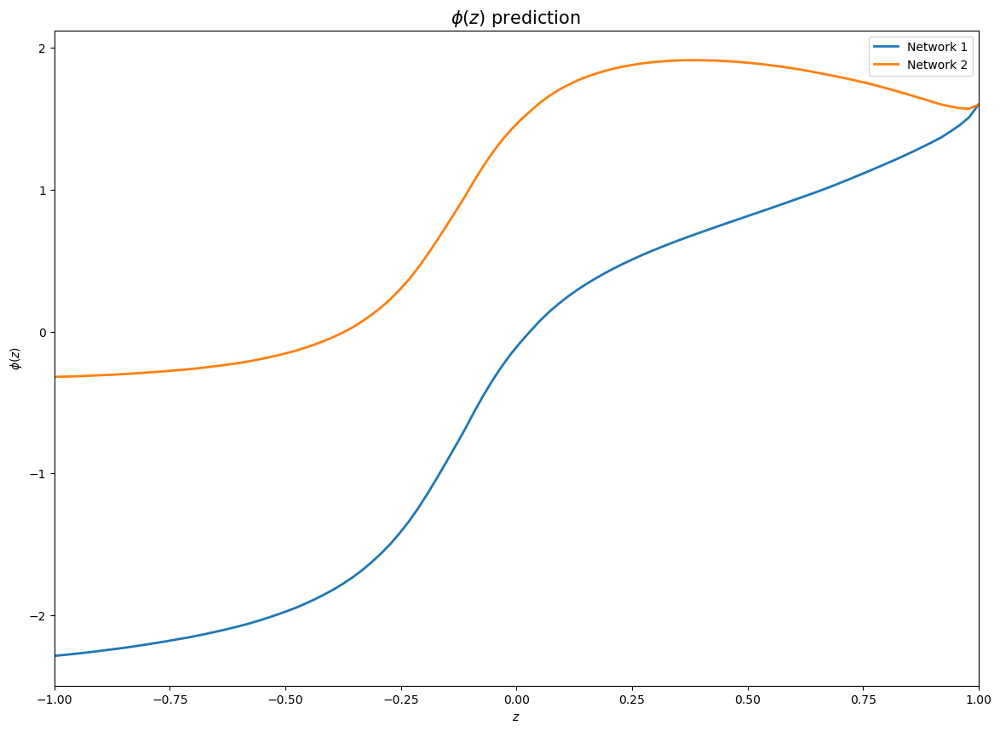

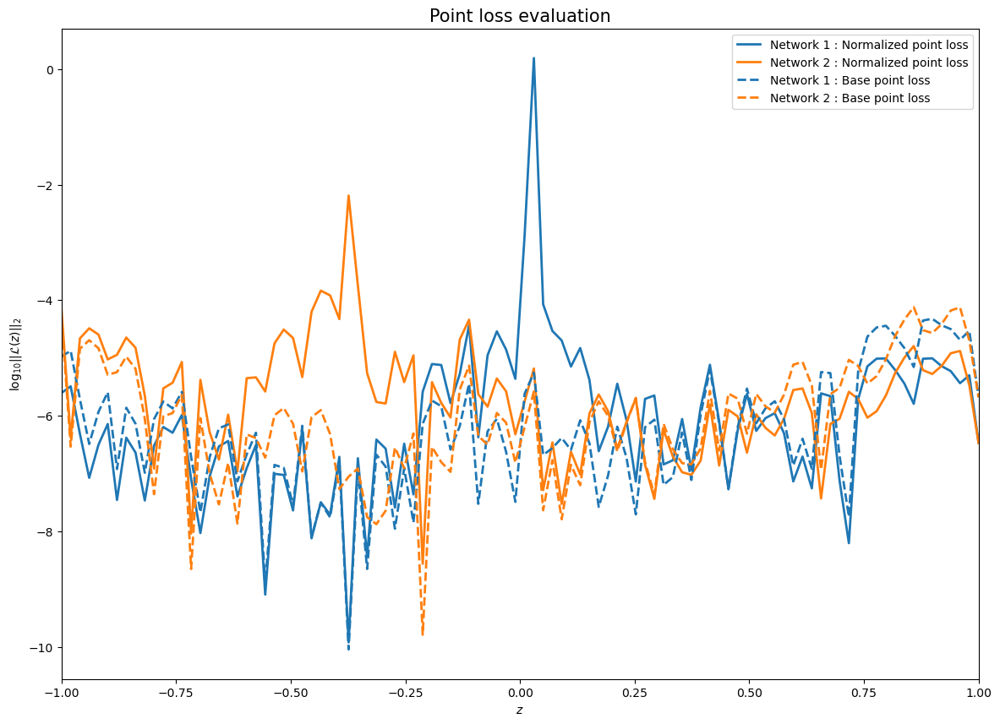

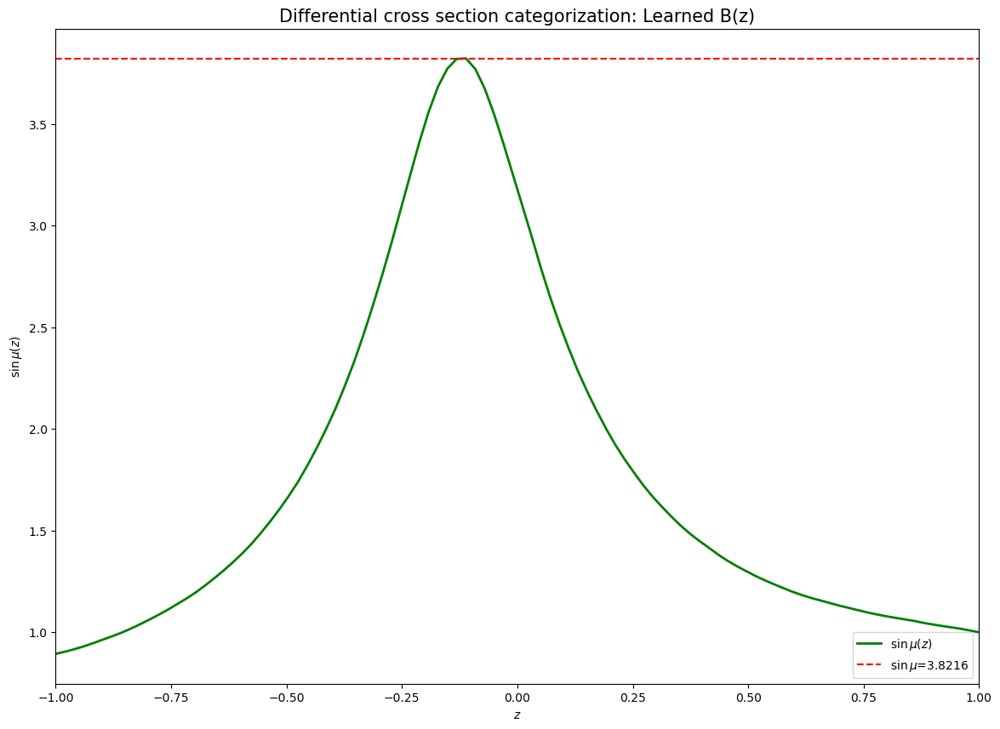

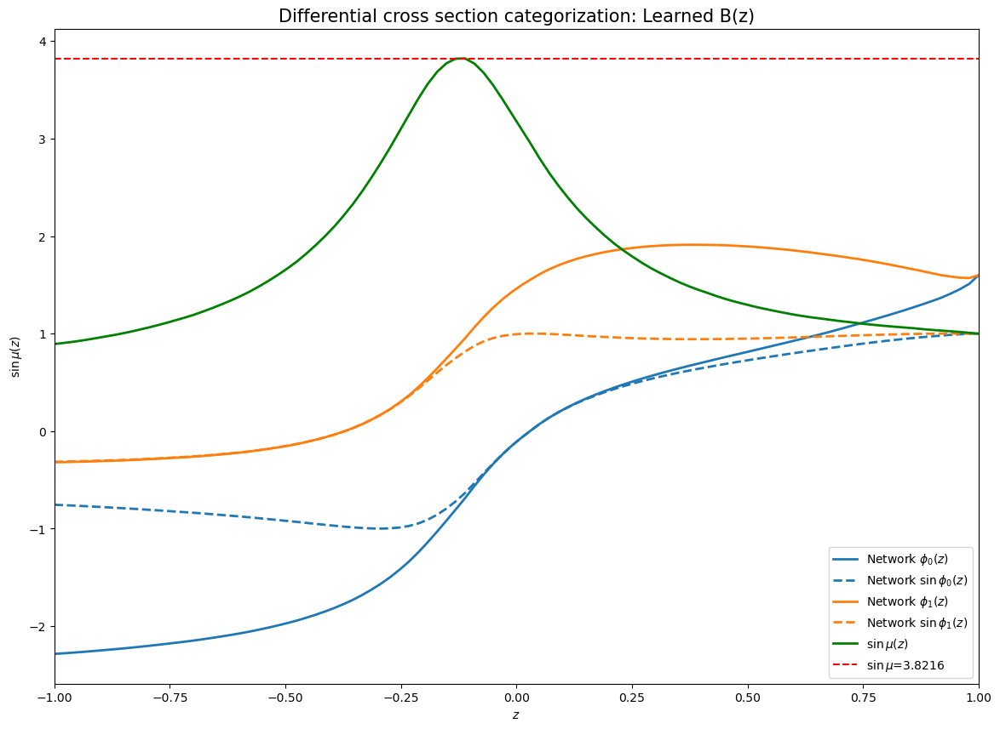

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 242 operations to synchronize with Neptune. Do not kill this process.
All 242 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1781


In [123]:
#seeds = [42, 1, 2, 3, 4]
seeds = [4]

for seed in seeds:

    # Start the Neptune logger run
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_amb_test")

    params = {'batch_size': 64,
             'epochs_num': 2500,
             'repulsive_epochs': [0, 1000],
             #'learning_rate': 0.003,
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             'zeros': [[1.2, 0.6]],
             'zeros_learn': True, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive': 1.0}

    tags = {'Ambiguity': 'Single z1', 'optimizer': 'Adam', 'Mode': 'Constant param' , 'Seed': str(seed)}
    run["sys/tags"].add(list(tags.values()))

    run['parameters'] = params


    netsolver = train_run(params, device, run, seed_num=seed, optim_name='Adam')
    
    zpointseval, modeval, phievals, eval_pt_loss_s, eval_pt_loss_no_s = eval_run_amp(netsolver, params, device, run)

    plot_bmod(zpointseval, modeval, run)
    plot_phases(zpointseval, phievals, run)
    plot_point_losses(zpointseval, eval_pt_loss_s, eval_pt_loss_no_s, run)

    integralz = sin_mu_integral(netsolver, zpointseval)
    plot_sin_mu(zpointseval, integralz, run)

    plot_summaries(zpointseval, phievals, integralz, run)


    # Make sure to kill the Neptune logger run
    run.stop()

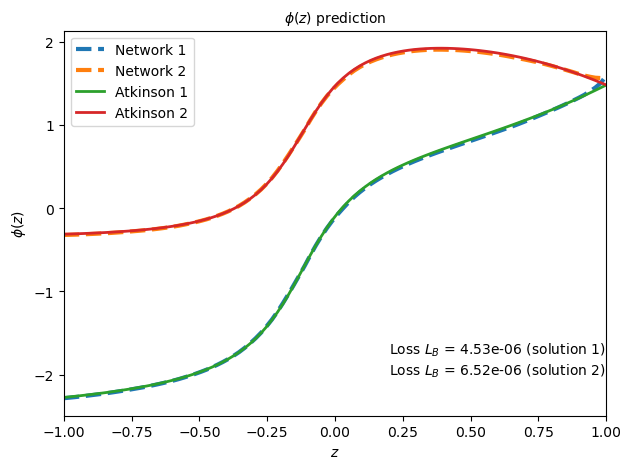

In [127]:
fig = plt.figure(figsize=(7, 5))

    
plt.plot(zpointseval.cpu(),phievals[0], '--', linewidth = 3)       
plt.plot(zpointseval.cpu(),phievals[1], '--', linewidth = 3)    
plt.plot(zpointseval.cpu(),np.angle(amp1), '-', linewidth = 2)      
plt.plot(zpointseval.cpu(),np.angle(amp2), '-', linewidth = 2)    
    
plt.xlabel('$z$')
plt.ylabel('$\phi(z)$')    
plt.title('$\phi(z)$ prediction', fontsize = 10)
plt.legend(['Network {}'.format(i+1) for i in range(2)]+ ['Atkinson 1', 'Atkinson 2'])
plt.xlim([-1,1])

#adding text inside the plot
plt.text(0.2, -1.75, 'Loss $L_B$ = {:.2e} (solution 1)'.format(eval_pt_loss_no_s[0].mean()), fontsize = 10)
plt.text(0.2, -2, 'Loss $L_B$ = {:.2e} (solution 2)'.format(eval_pt_loss_no_s[1].mean()), fontsize = 10)
#plt.text(0.2, -2.25, 'Repulsive loss $L_R$ = {:.2e}'.format(repulsive_loss), fontsize = 10)

plt.show()
plt.close(fig)

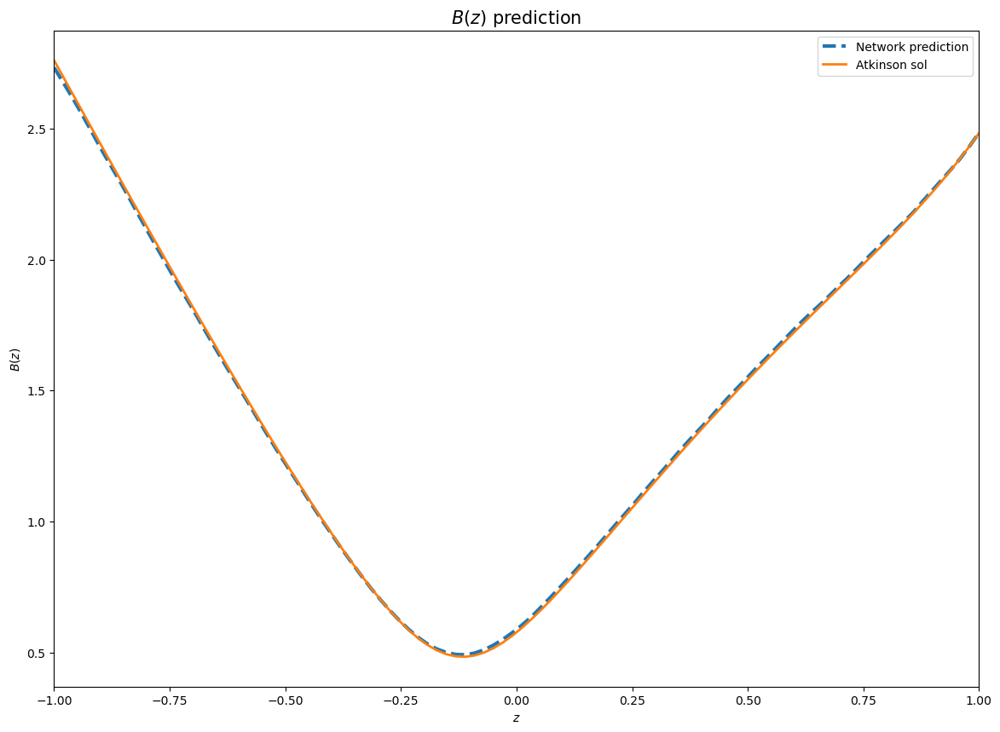

In [128]:
fig = plt.figure(figsize=(14, 10))
    
plt.plot(zpointseval.cpu(),modeval, '--', linewidth = 3)       
plt.plot(zpointseval.cpu(),np.abs(amp1), '-', linewidth = 2)  
plt.xlabel('$z$')
plt.ylabel('$B(z)$')    
plt.title('$B(z)$ prediction', fontsize = 15)
plt.legend(['Network prediction'] + ['Atkinson sol'])
plt.xlim([-1,1])
plt.show()
#run[f'evaluation/learned_cross_section'].upload(File.as_image(fig))
plt.close(fig)

##### Now train on different $z_1$ values by starting from the pre-trained network above

First define some nice plotting and evaluation function

In [22]:
def eval_on_zeros(trained_solver, zlist, device, run, logging=True):

# Make sure we are in evaluation mode

    for zero in zlist:
        trained_solver.amps_net.eval()
        trained_solver.amps_net.set_zeros([zero])

        with torch.no_grad(): 

            # Create the evaluation points and compute the phase at those points
            zpointstest = torch.linspace(-1,1,steps=100, device=device)
            test_data = trained_solver.amps_net(zpointstest.view(-1,1))

            mod_res = test_data[0].squeeze().cpu().numpy()
            phase_1 = test_data[1].squeeze().cpu().numpy()
            phase_2 = test_data[2].squeeze().cpu().numpy()



            # Also log the final loss values. Including the loss at individual z values
            trained_solver.scaled_loss = True
            eval_loss_scaled = trained_solver.loss_function(zpointstest)

            trained_solver.scaled_loss = False
            eval_loss_base = trained_solver.loss_function(zpointstest)    

            repulsive_loss = trained_solver.dual_loss_ambiguity(zpointstest)

            #plot_phases(zpointstest, [phase_1, phase_2], neptune_run=None, add_str='z1: {}'.format(solved_net.zeros[0]))
            fig = plt.figure(figsize=(7, 5))

            name_pt = trained_solver.amps_net.zeros[0].cpu().numpy()
            str_pt = str(name_pt[0]) + '+i*' + str(name_pt[1])

            plt.plot(zpointstest.cpu(),phase_1, '-', linewidth = 2)       
            plt.plot(zpointstest.cpu(),phase_2, '-', linewidth = 2)      

            plt.xlabel('$z$')
            plt.ylabel('$\phi(z)$')    
            plt.title('$\phi(z)$ prediction ' + 'z1: {}'.format(str_pt), fontsize = 10)
            plt.legend(['Network {}'.format(i+1) for i in range(2)])
            plt.xlim([-1,1])

            #adding text inside the plot
            plt.text(0.2, -0.75, 'Loss $L_B$ = {:.2e} (solution 1)'.format(eval_loss_base.mean()), fontsize = 10)
            plt.text(0.2, -1, 'Loss $L_B$ = {:.2e} (solution 2)'.format(eval_loss_scaled.mean()), fontsize = 10)
            plt.text(0.2, -1.25, 'Repulsive loss $L_R$ = {:.2e}'.format(repulsive_loss), fontsize = 10)
            plt.show()
            if logging:
                run[f'evaluation/functions_'+str_pt].upload(File.as_image(fig))
            plt.close(fig)
            
def contour_eval(trained_solver, num_x, num_y, params_scan, max_l=-2):
    

    # Prepare the grid of points
    scan_range_x = np.linspace(0.01, 1.99, num=num_x)
    scan_range_y = np.linspace(0.01, 0.99, num=num_y)
    param_grid = np.dstack(np.meshgrid(scan_range_x, scan_range_y)).reshape(-1, 2)

    # Prepare the return vect
    log_res_z = {'params':param_grid, 'sinmu':np.empty([num_x, num_y]), 'base_loss':np.empty([num_x, num_y]), 'scale_loss':np.empty([num_x, num_y]), 'repulsive_loss':np.empty([num_x, num_y])}

    for i, params_lin in enumerate(tqdm(param_grid, unit='grid_point')):

        x_index = i % num_x
        y_index = int((i - i % num_x)/num_x)
        
        # Start from the trained network
        trained_solver.amps_net.eval()
        trained_solver.amps_net.set_zeros([[scan_range_x[x_index], scan_range_y[y_index]]])


        sinmu_pt = []
        base_loss_pt = []
        scale_loss_pt = []
        repulsive_loss_pt = []

        zpointseval, eval_loss_base, eval_loss_scaled, repulsive_loss = eval_run_scan(trained_solver, params_scan, device)
        sinmu = max(sin_mu_integral(netsolver, zpointseval).cpu())

        log_res_test['sinmu'][x_index, y_index] = sinmu.cpu().numpy()
        log_res_test['base_loss'][x_index, y_index] = eval_loss_base.cpu().numpy()
        log_res_test['scale_loss'][x_index, y_index] = eval_loss_scaled.cpu().numpy()
        log_res_test['repulsive_loss'][x_index, y_index] = repulsive_loss.cpu().numpy()
        pbar.update(1)
    
    new_log_test = simple_update_log(log_res_test, base_threshold=0.00075)
    plot_contour_loss_curves_linear(new_log_test, None, log_type='base10', logging=False, atkinson_bounds=True, max_l=max_l)

Visualize the initial loss on a set of $z_1$ points

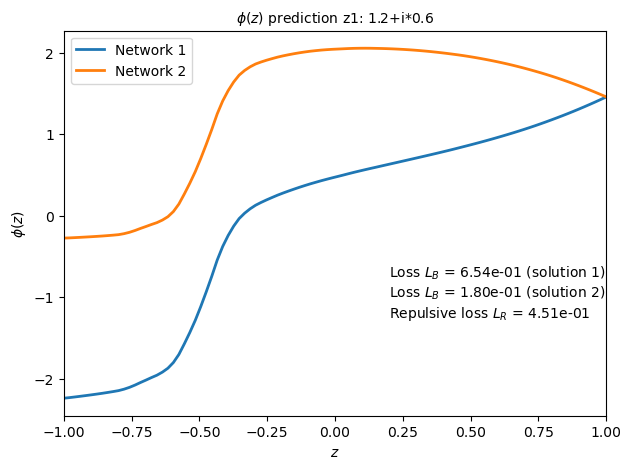

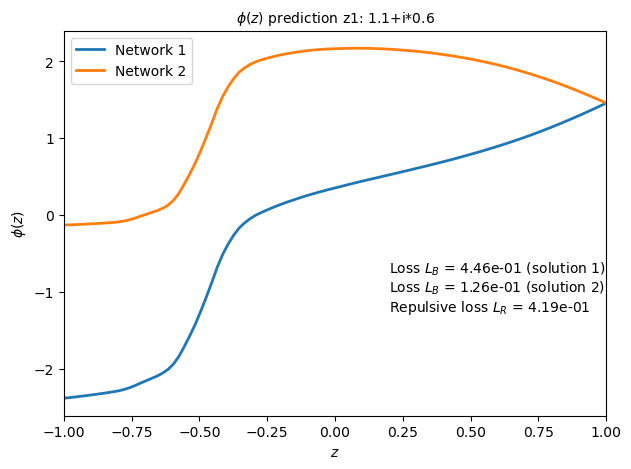

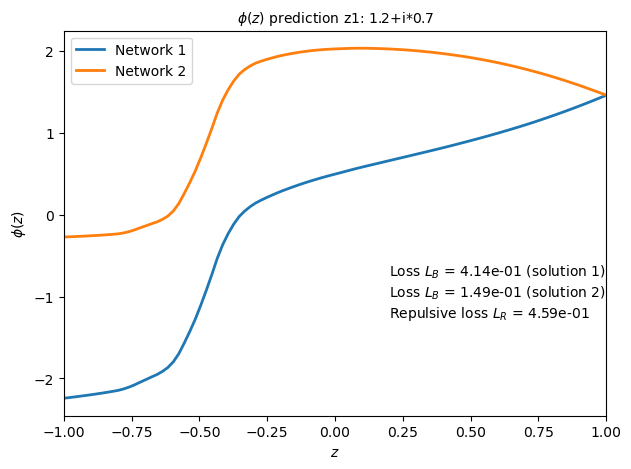

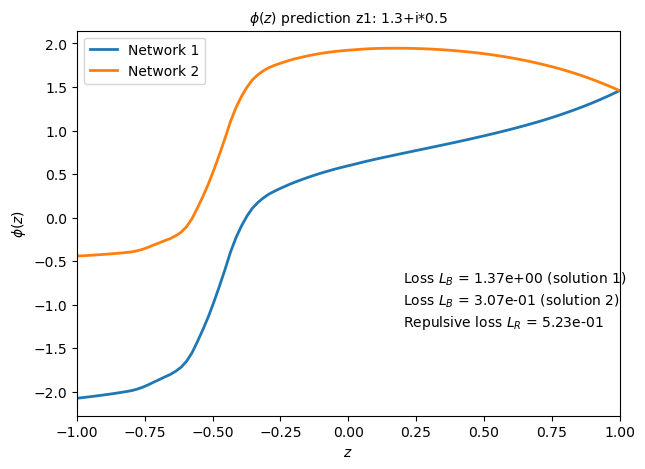

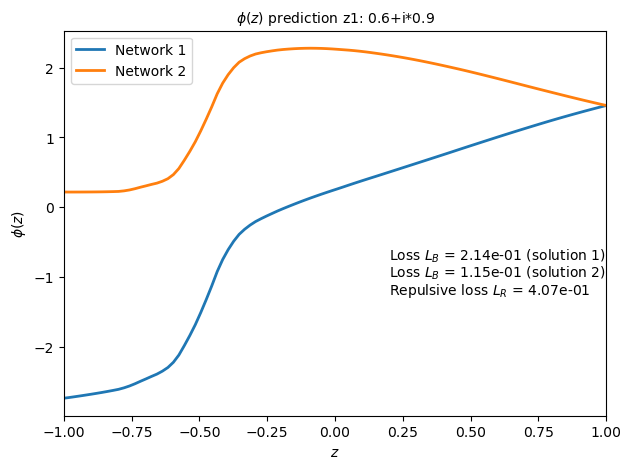

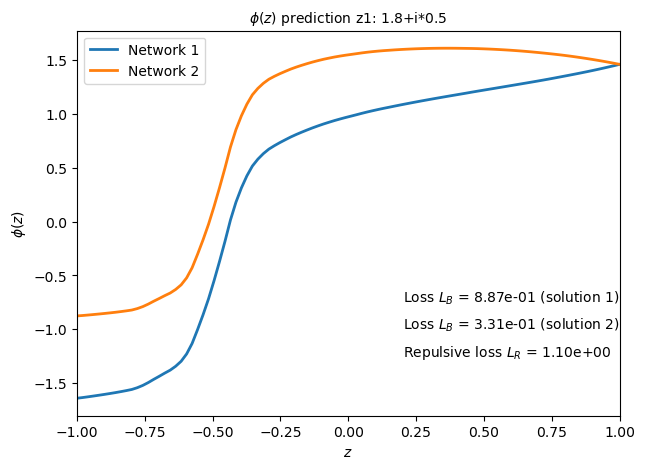

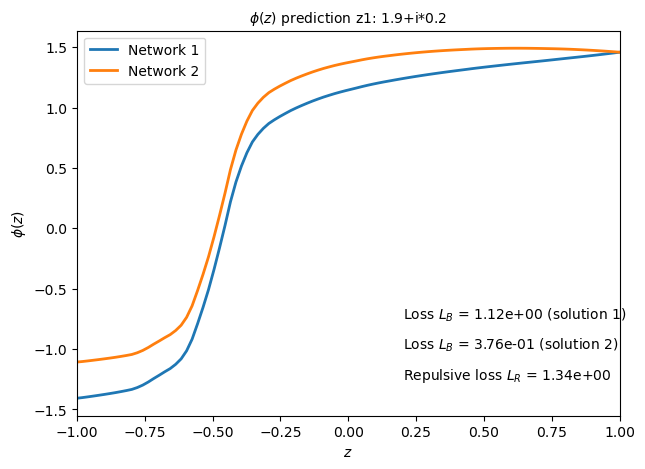

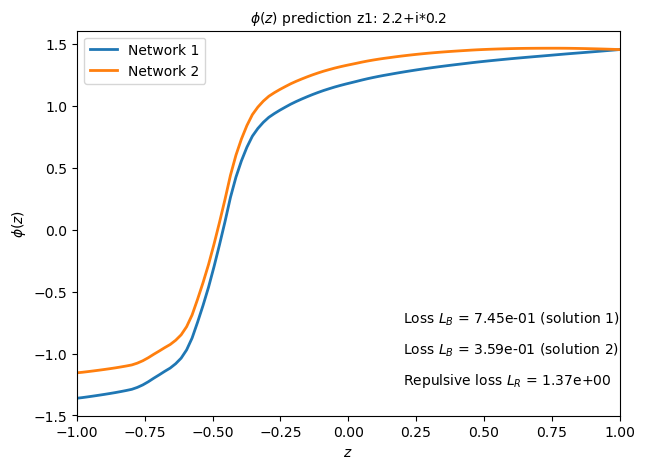

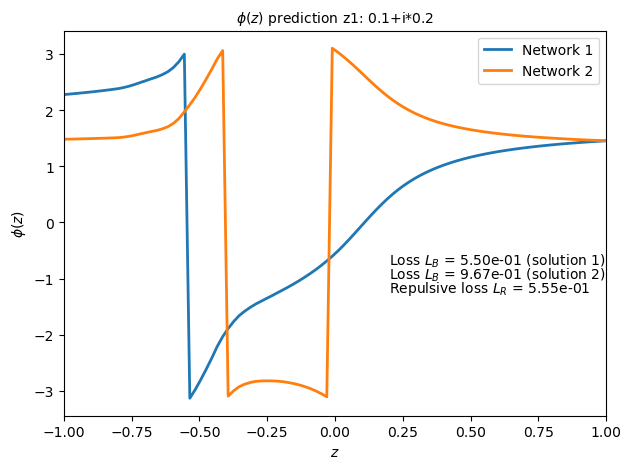

In [274]:
# Zeros list
zlist = [[1.2, 0.6], [1.1, 0.6], [1.2, 0.7],[1.3, 0.5],[0.6,0.9] ,[1.8, 0.5], [1.9, 0.2], [2.2, 0.2], [0.1, 0.2]]


eval_on_zeros(netsolver, zlist, device, run, logging=False)

  0%|          | 0/800 [00:00<?, ?grid_point/s]

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_30168/1529236210.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_30168/1529236210.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


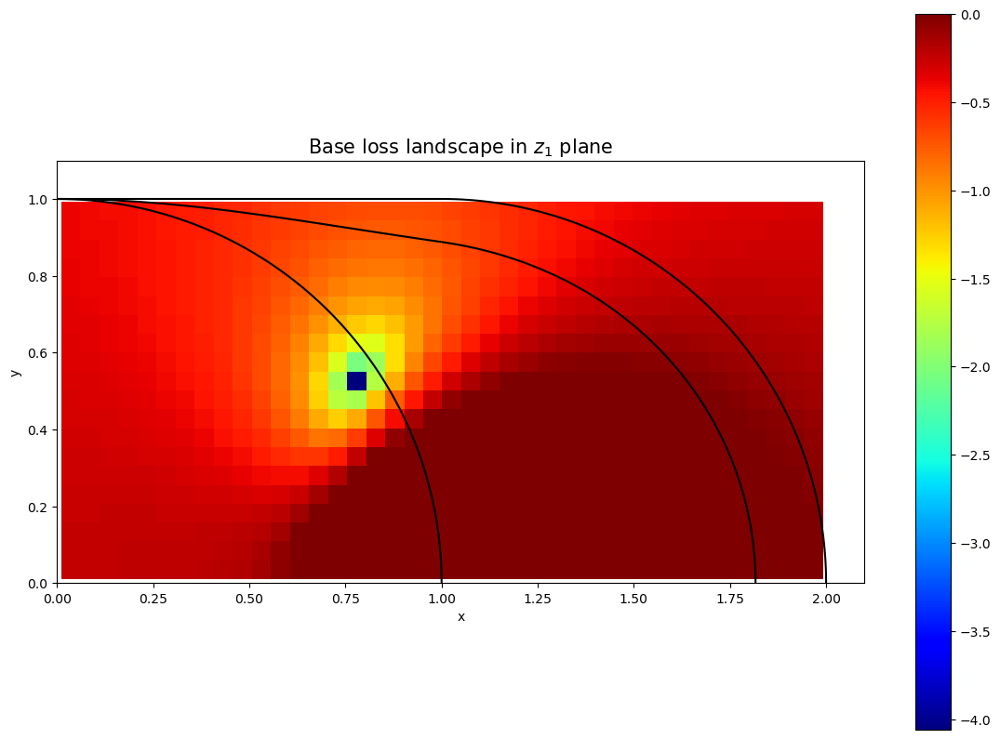

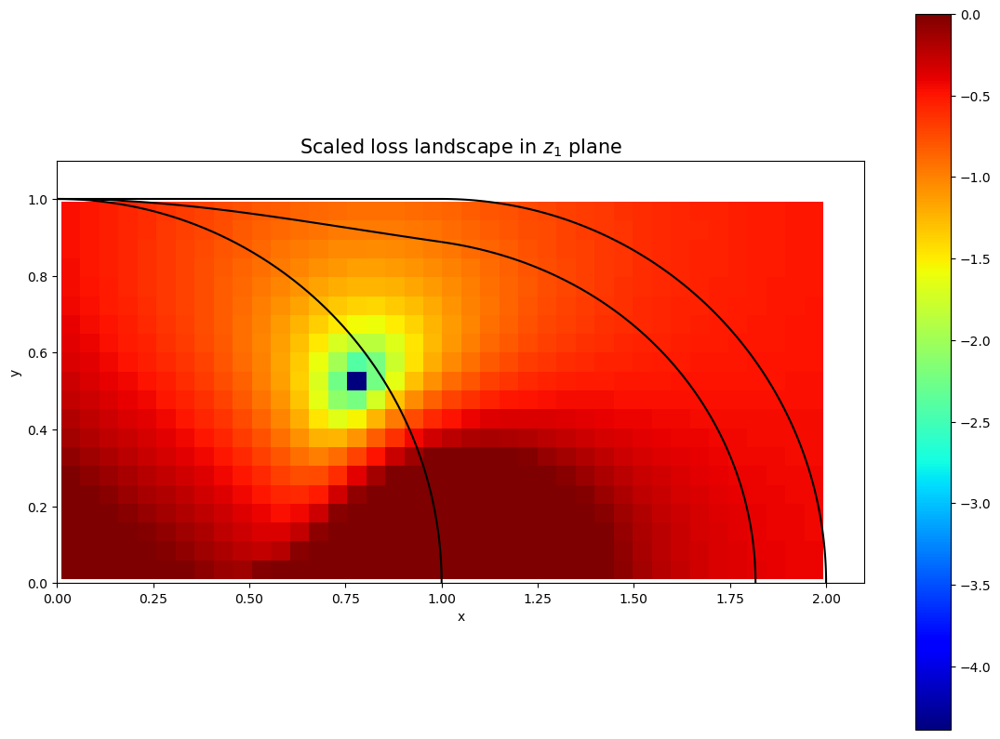

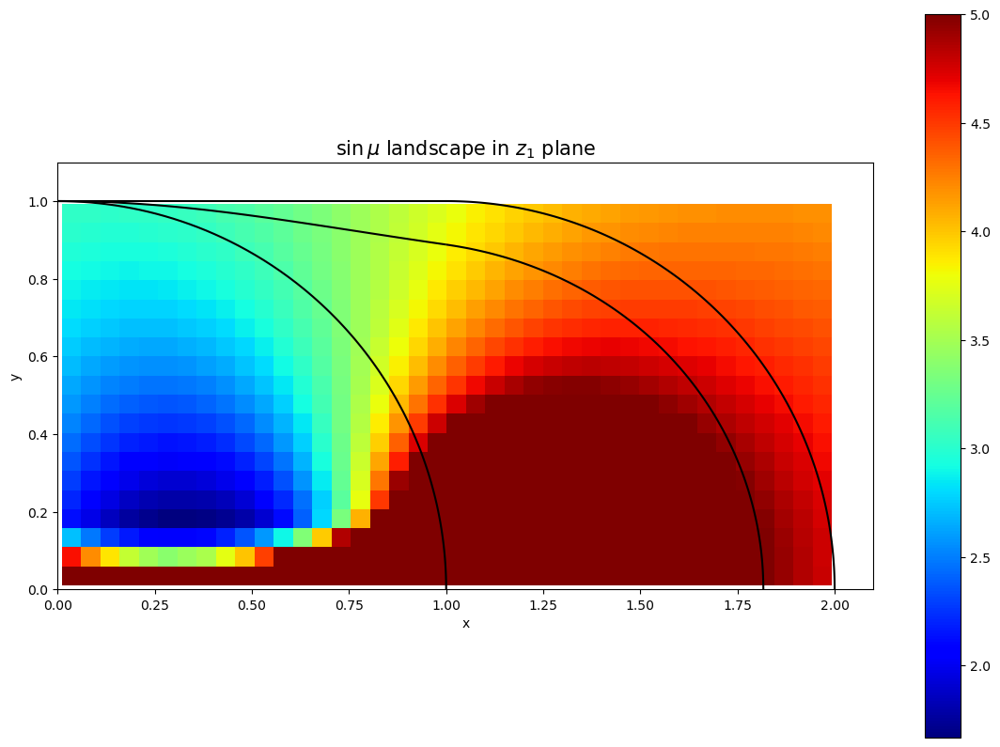

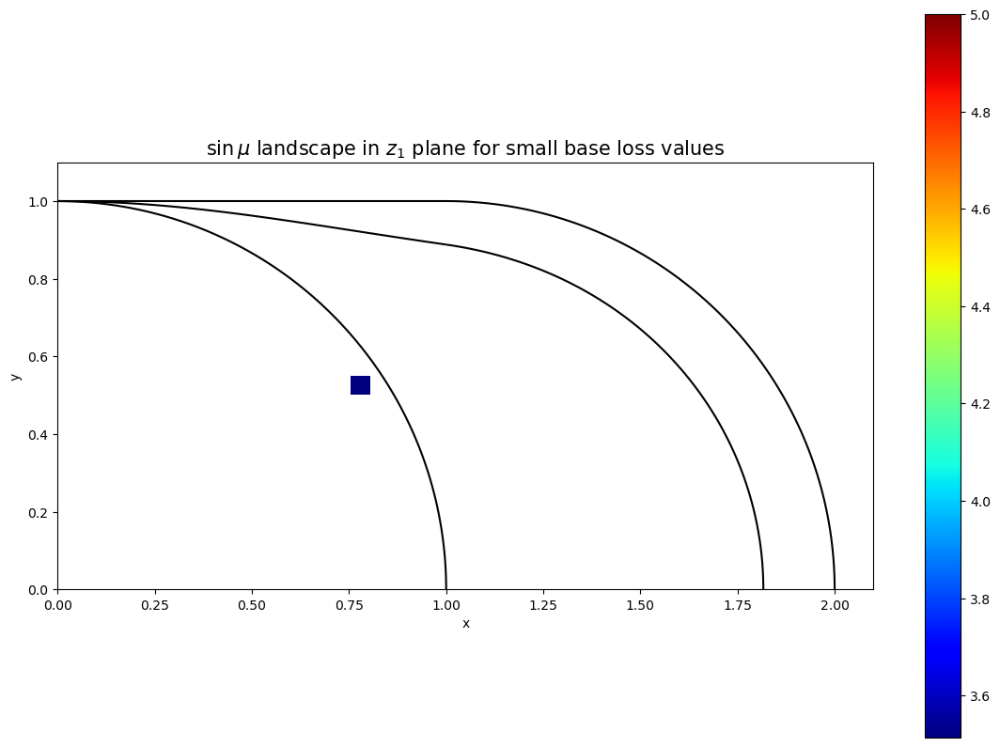

In [280]:
contour_eval(netsolver, 40, 20, params, max_l=0)

Let's first try without having a repulsive loss

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1637
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
ModuleAmplitudes(
  (base_f): ModuleNetAmplitude(
    (activation): ReLU()
    (positive_activ): Softplus(beta=1, threshold=20)
    (model): Sequential(
      (layer_1): Linear(in_features=1, out_features=64, bias=True)
      (activation_1): ReLU()
      (layer_2): Linear(in_features=64, out_features=64, bias=True)
      (activation_2): ReLU()
      (layer_3): Linear(in_features=64, out_features=64, bias=True)
      (activation_3): ReLU()
      (layer_4): Linear(in_features=64, out_features=64, bias=True)
      (activation_4): ReLU()
      (layer_5): Linear(in_features=64, out_features=2, bias=True)
    )
  )
)


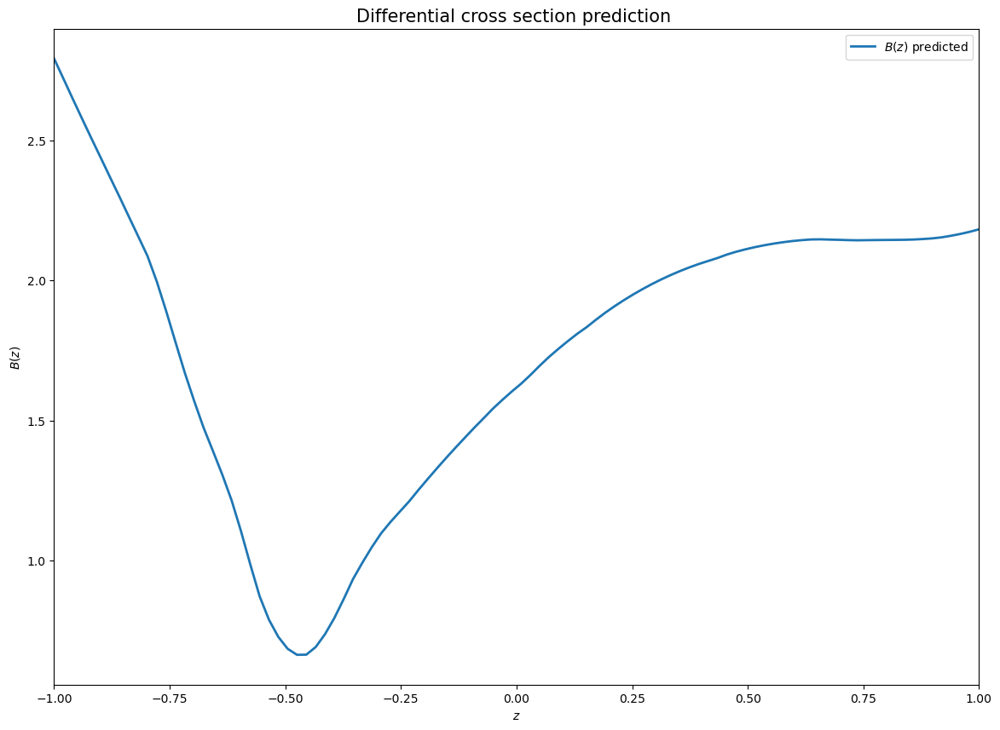

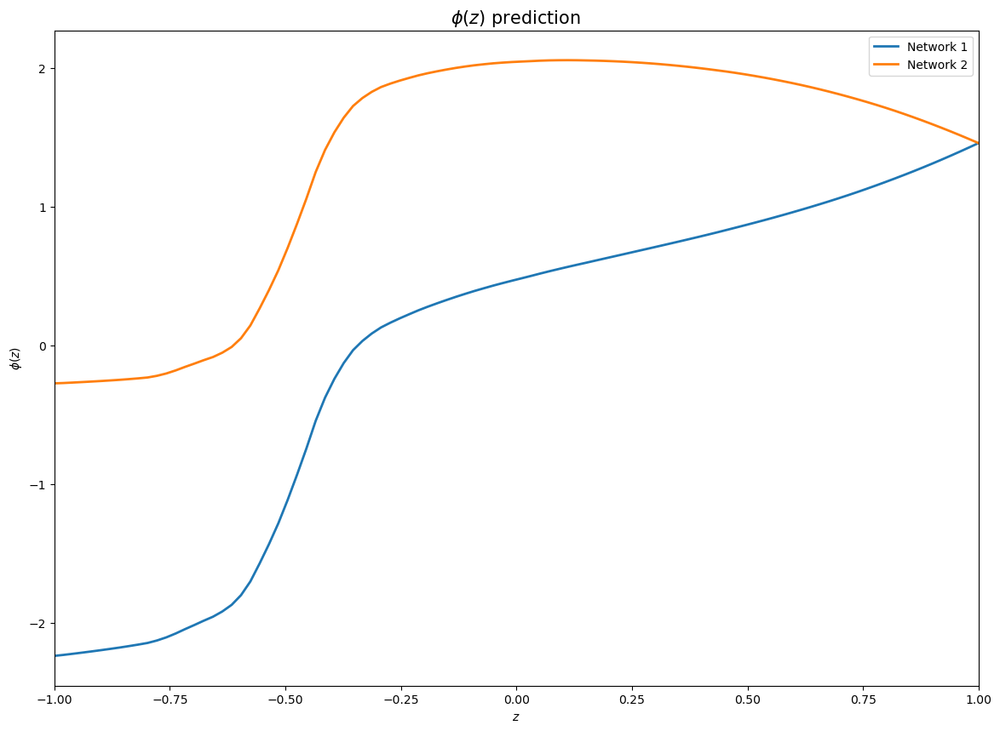

  0%|          | 0/10000 [00:00<?, ?epoch/s]

Exception in thread NeptuneWebhooks:
Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 108, in recv
    bytes_ = _recv()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 87, in _recv
    return sock.recv(bufsize)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/ssl.py", line 1227, in recv
    return self.read(buflen)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/ssl.py", line 1102, in read
    return self._sslobj.read(len)
TimeoutError: [Errno 60] Operation timed out

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/neptune/ne

In [338]:
#seeds = [42, 1, 2, 3, 4]
seeds = [4]

from copy import deepcopy

for seed in seeds:

    # Start the Neptune logger run
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_amb_test")

    params = {'batch_size': 64,
             'epochs_num': 10000,
             'repulsive_epochs': [0, 1000],
             #'learning_rate': 0.003,
             'learning_rate': 0.003,
             'lr_scheduler': False, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             'zeros': [[1.2, 0.6]],
             'zeros_learn': True, 
             'zeros_freeze': False, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive': 0.0}

    tags = {'Ambiguity': 'All z1', 'optimizer': 'Adam', 'Mode': 'Constant param' , 'Seed': str(seed)}
    run["sys/tags"].add(list(tags.values()))

    run['parameters'] = params


    netsolver_z1 = train_run(params, device, run, seed_num=seed, optim_name='Adam', amps_net=deepcopy(netsolver.amps_net))
    
    zpointseval, modeval, phievals, eval_pt_loss_s, eval_pt_loss_no_s = eval_run_amp(netsolver_z1, params, device, run)

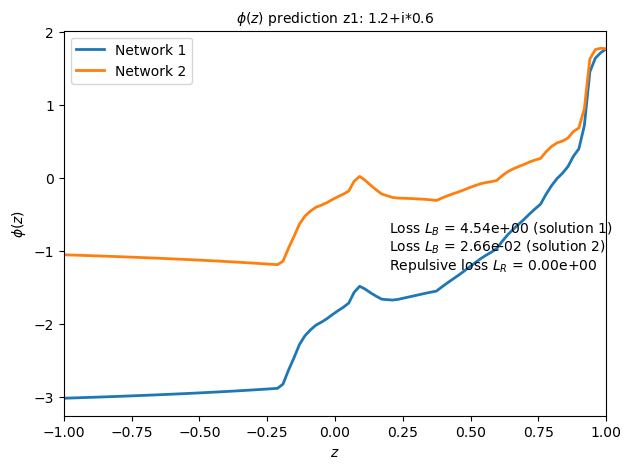

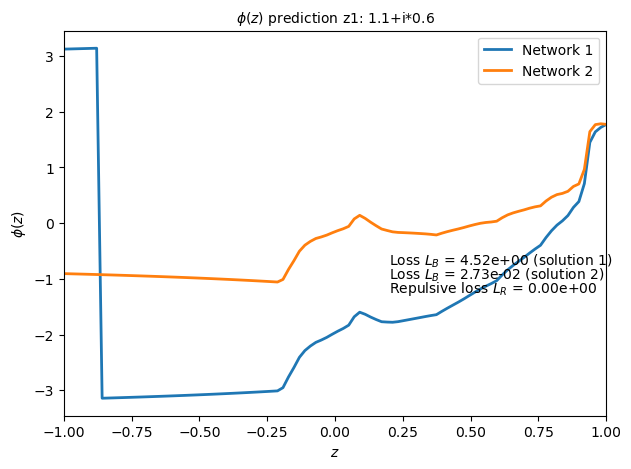

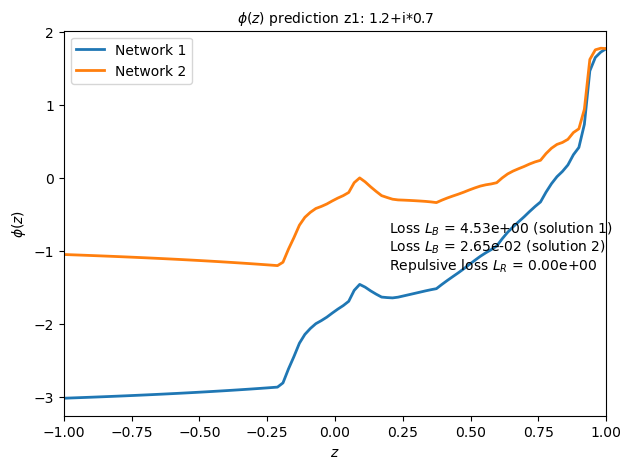

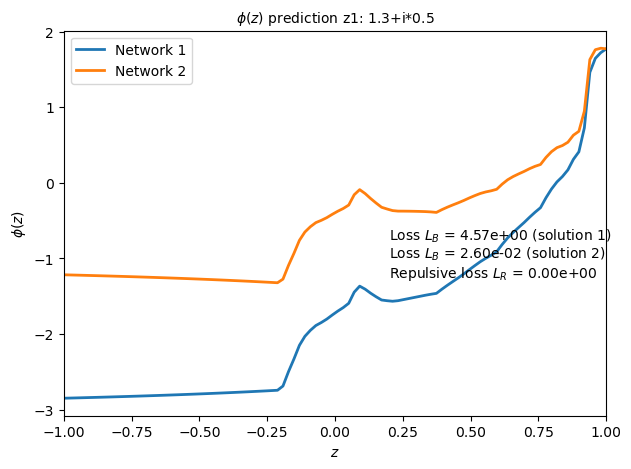

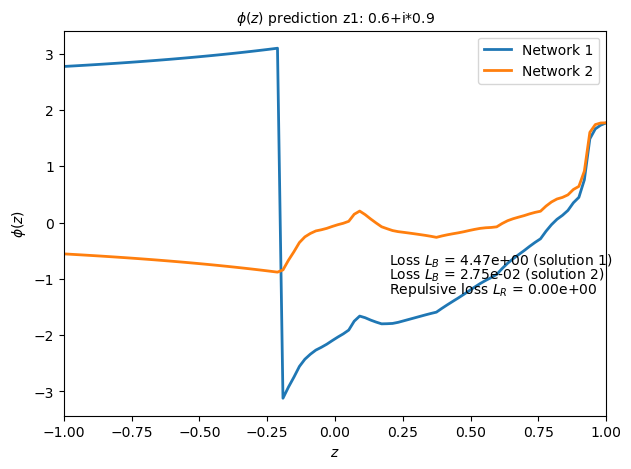

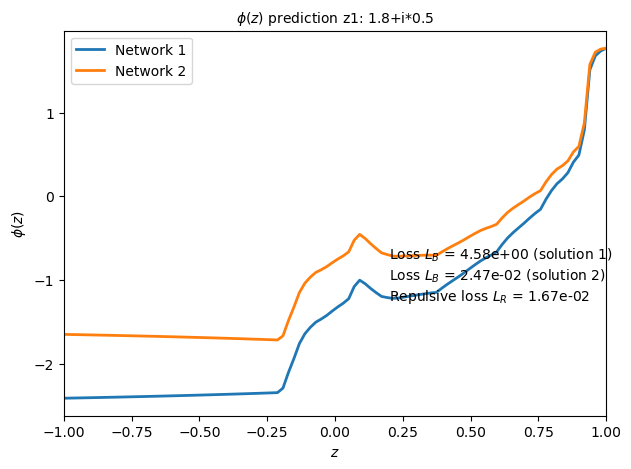

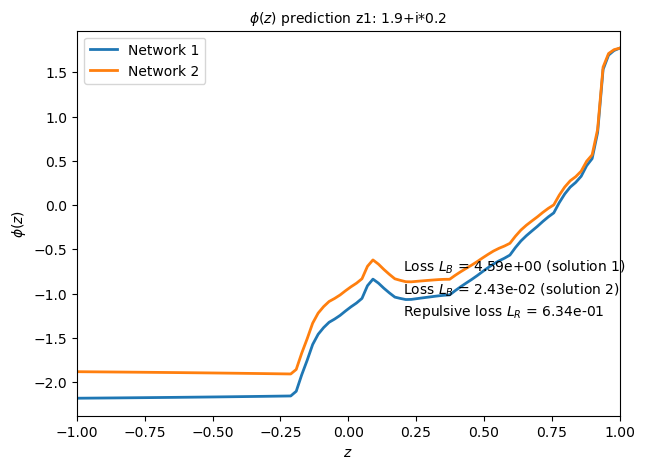

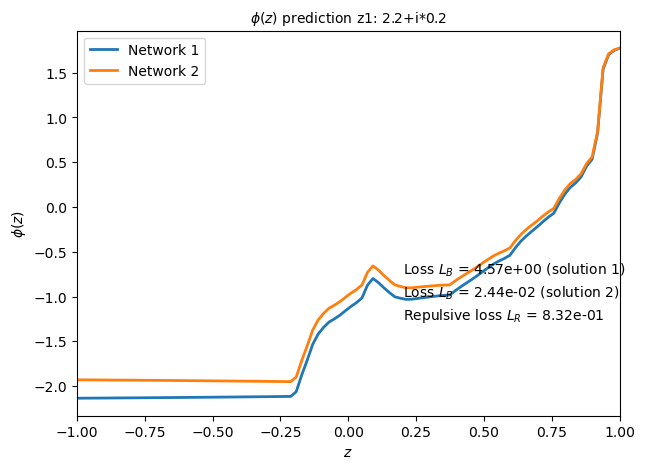

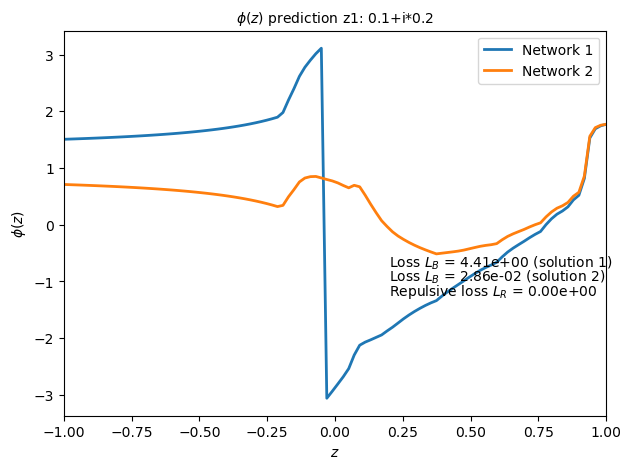

In [339]:
zlist = [[1.2, 0.6], [1.1, 0.6], [1.2, 0.7],[1.3, 0.5],[0.6,0.9] ,[1.8, 0.5], [1.9, 0.2], [2.2, 0.2], [0.1, 0.2]]


eval_on_zeros(netsolver_z1, zlist, device, run, logging=True)

  0%|          | 0/800 [00:00<?, ?grid_point/s]

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_30168/1529236210.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_30168/1529236210.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


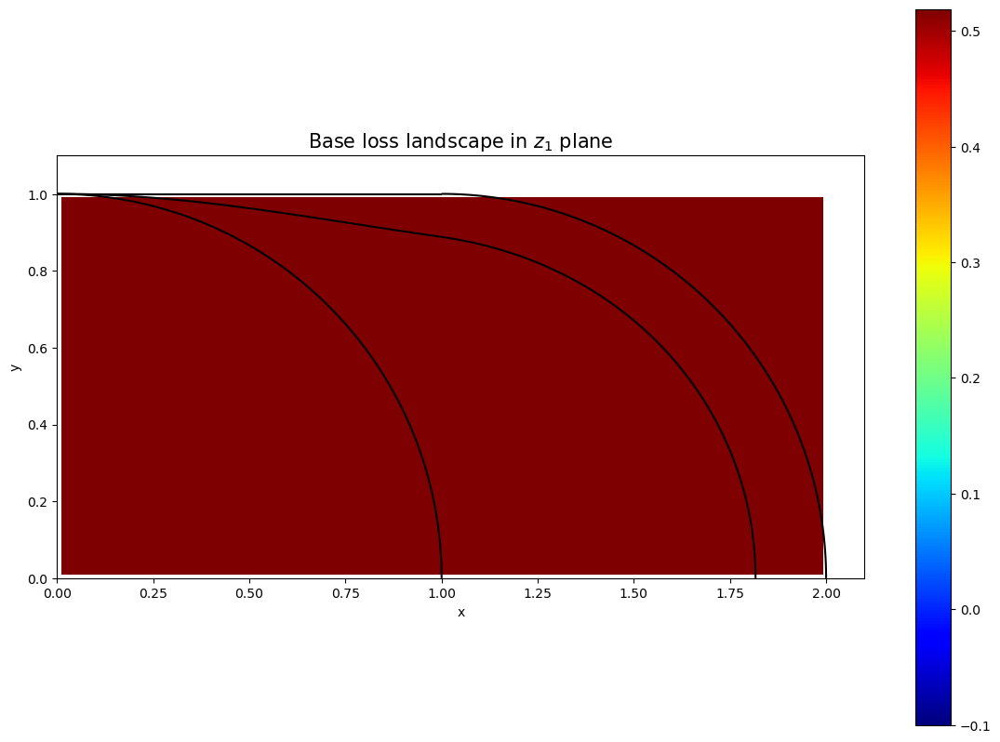

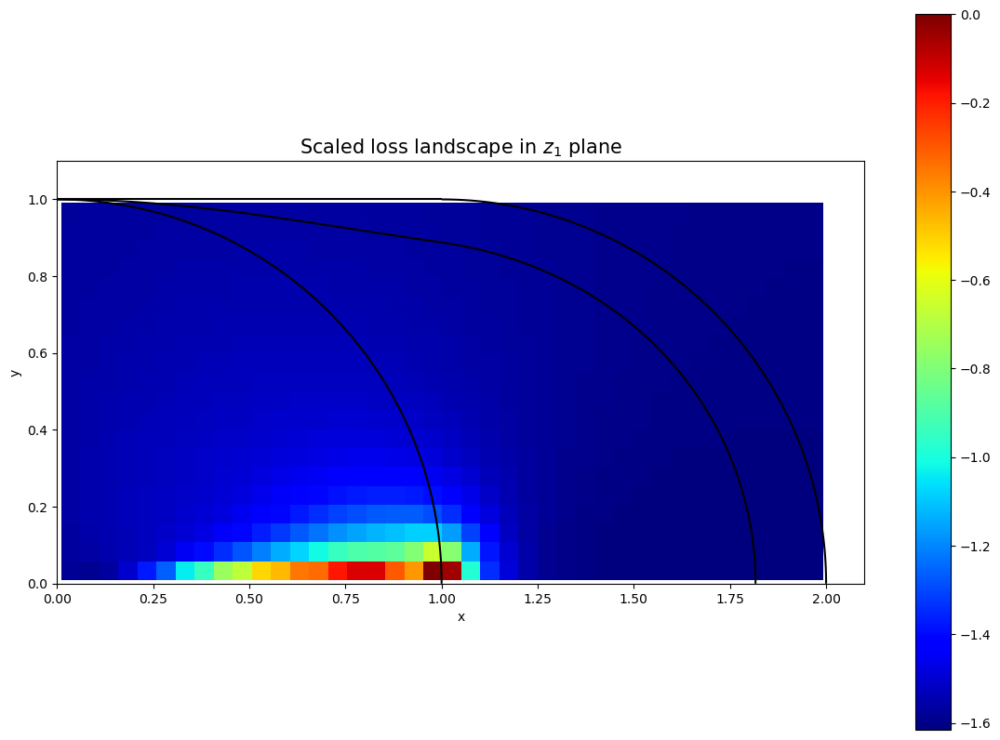

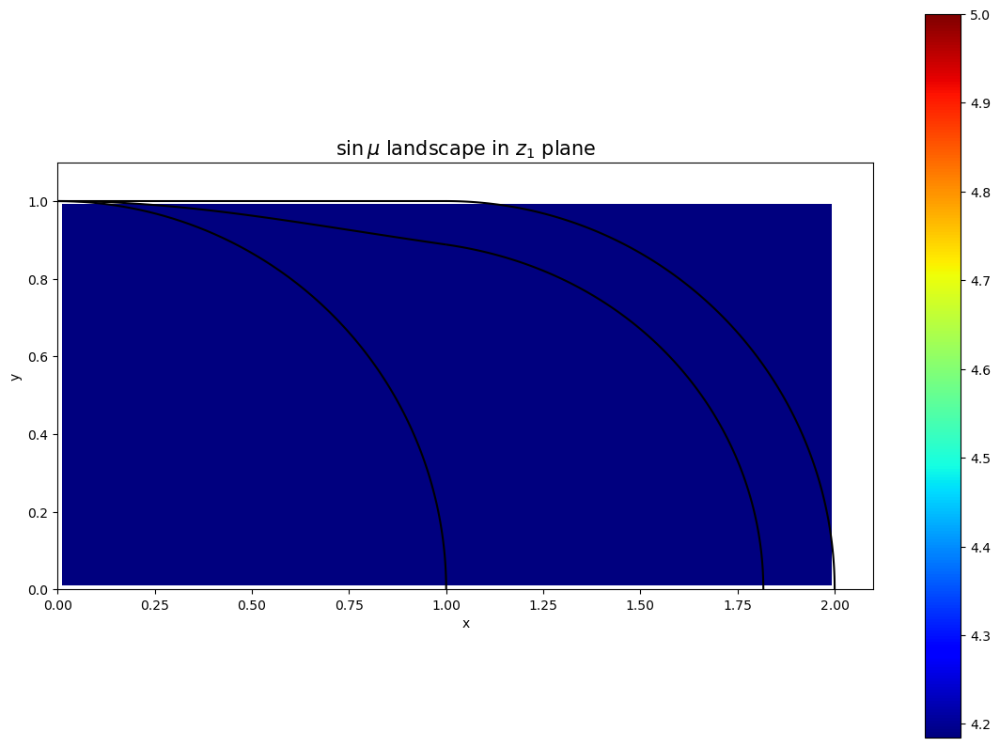

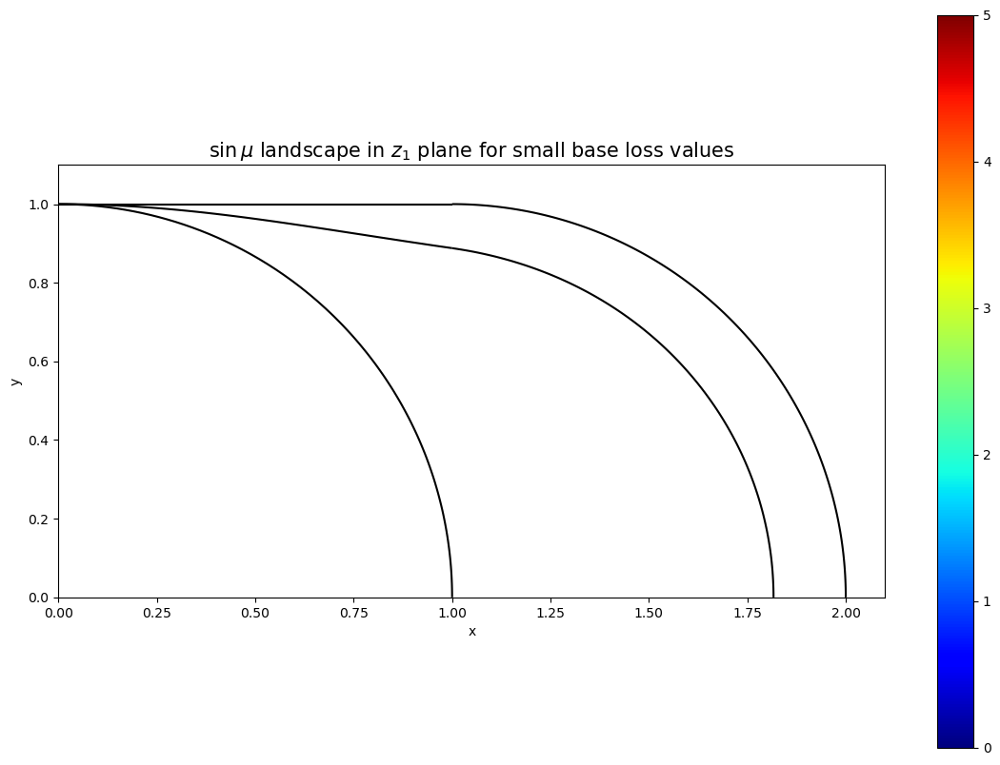

In [340]:
contour_eval(netsolver_z1, 40, 20, params, max_l=0)

In [341]:
# Make sure to kill the Neptune logger run
run.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 3 operations to synchronize with Neptune. Do not kill this process.
All 3 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1637


##### Now instead of learning all $z_1$ we just do the scans but initialize the network with some well characterized solution

Start by defining the original network at a given position

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1794


Info (NVML): NVML Shared Library Not Found. GPU usage metrics may not be reported. For more information, see https://docs.neptune.ai/help/nvml_error/


Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
ModuleAmplitudes(
  (base_f): ModuleNetAmplitude(
    (activation): ReLU()
    (positive_activ): Softplus(beta=1, threshold=20)
    (model): Sequential(
      (layer_1): Linear(in_features=1, out_features=64, bias=True)
      (activation_1): ReLU()
      (layer_2): Linear(in_features=64, out_features=64, bias=True)
      (activation_2): ReLU()
      (layer_3): Linear(in_features=64, out_features=64, bias=True)
      (activation_3): ReLU()
      (layer_4): Linear(in_features=64, out_features=64, bias=True)
      (activation_4): ReLU()
      (layer_5): Linear(in_features=64, out_features=2, bias=True)
    )
  )
)


/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/neptune/new/attributes/attribute.py:64: NeptuneDeprecationWarning: The object you're logging will be implicitly cast to a string. We'll end support of this behavior in `neptune-client==1.0.0`. To log the object as a string, use `str(object)` instead.
  return self.assign(value, wait)


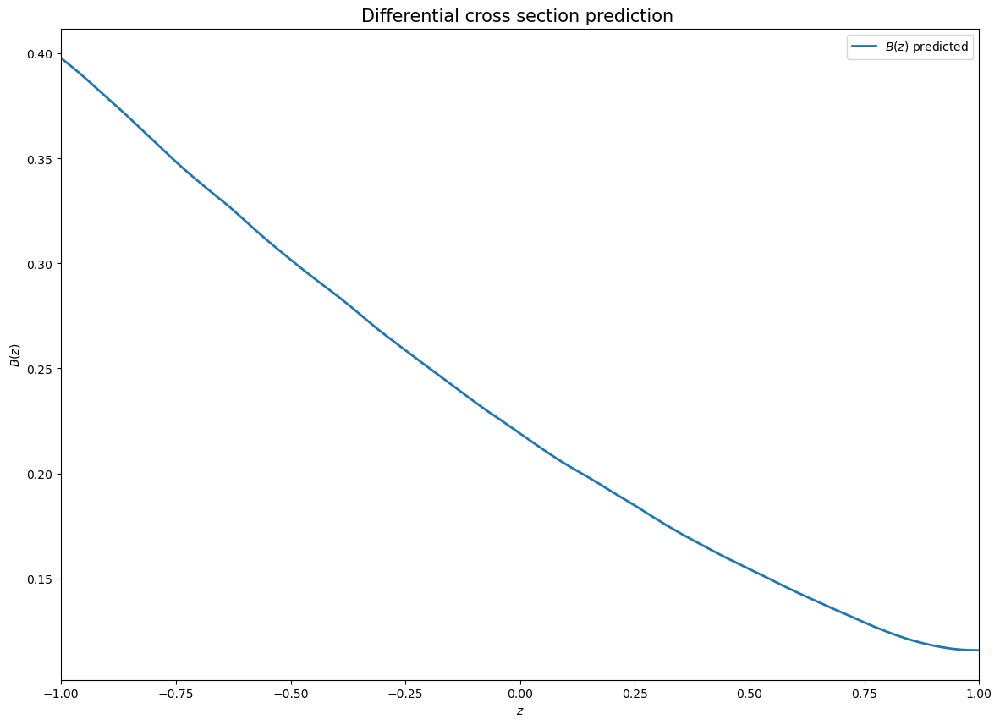

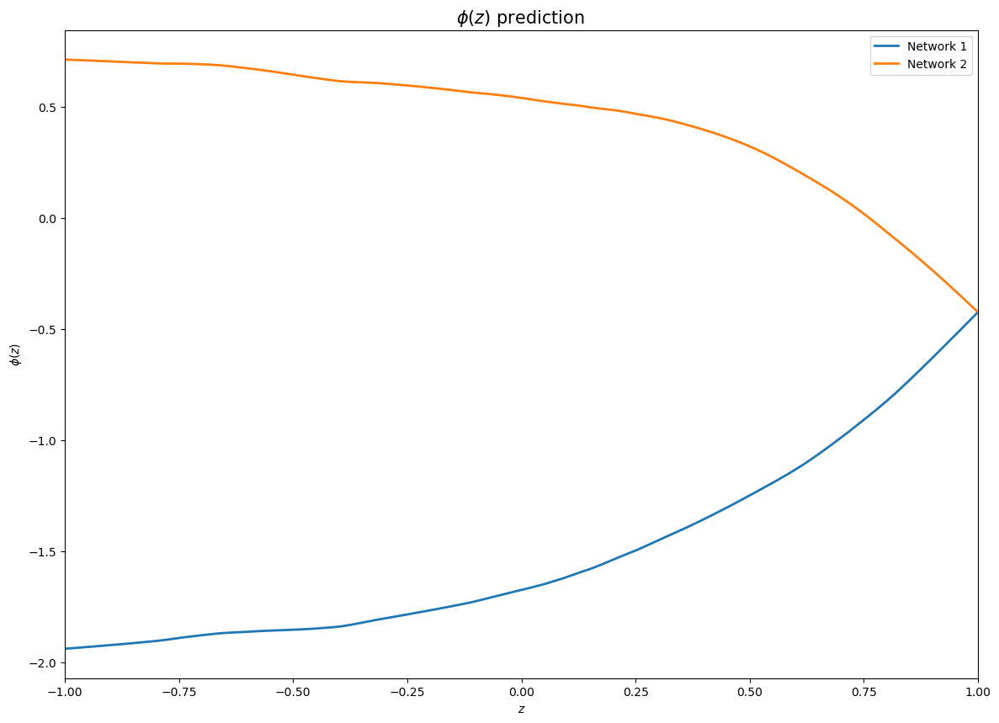

  0%|          | 0/1500 [00:00<?, ?epoch/s]

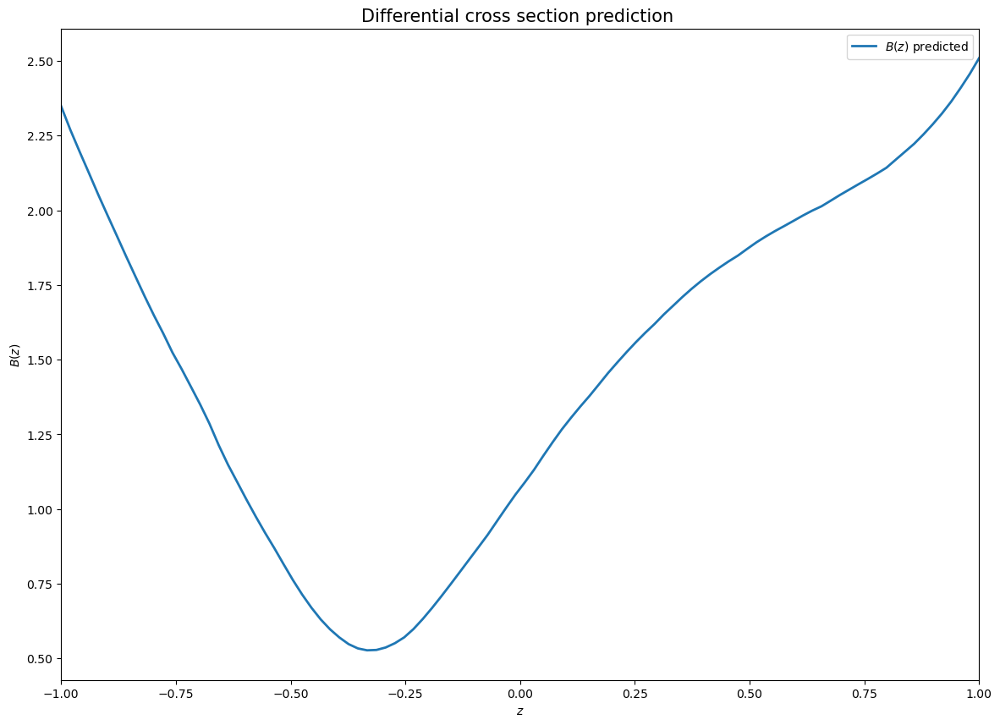

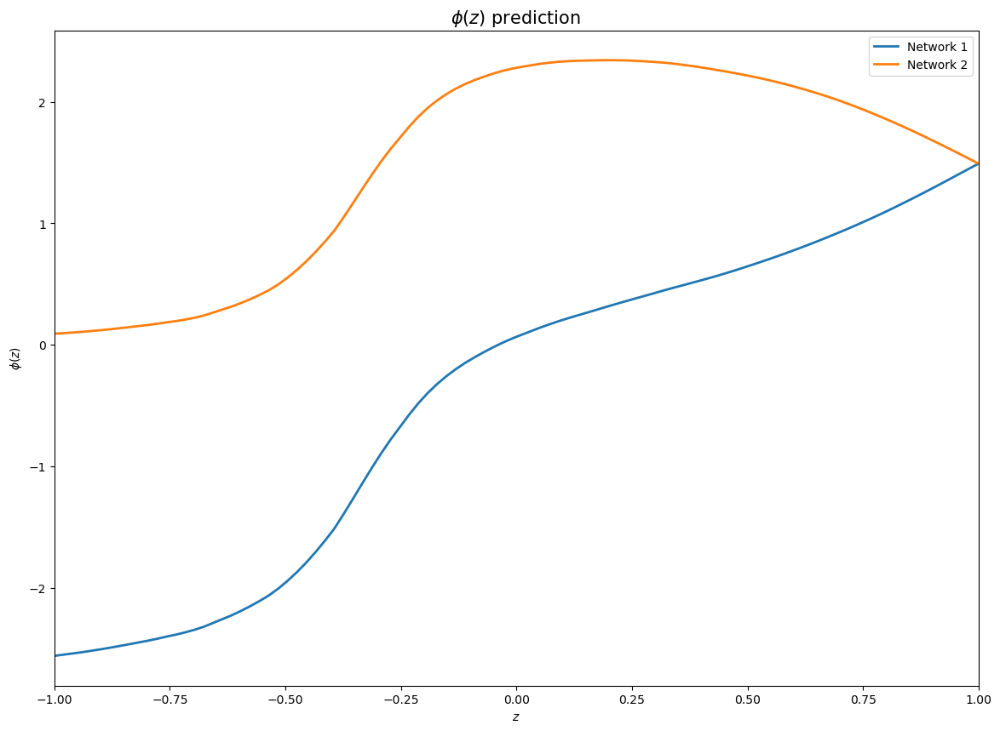

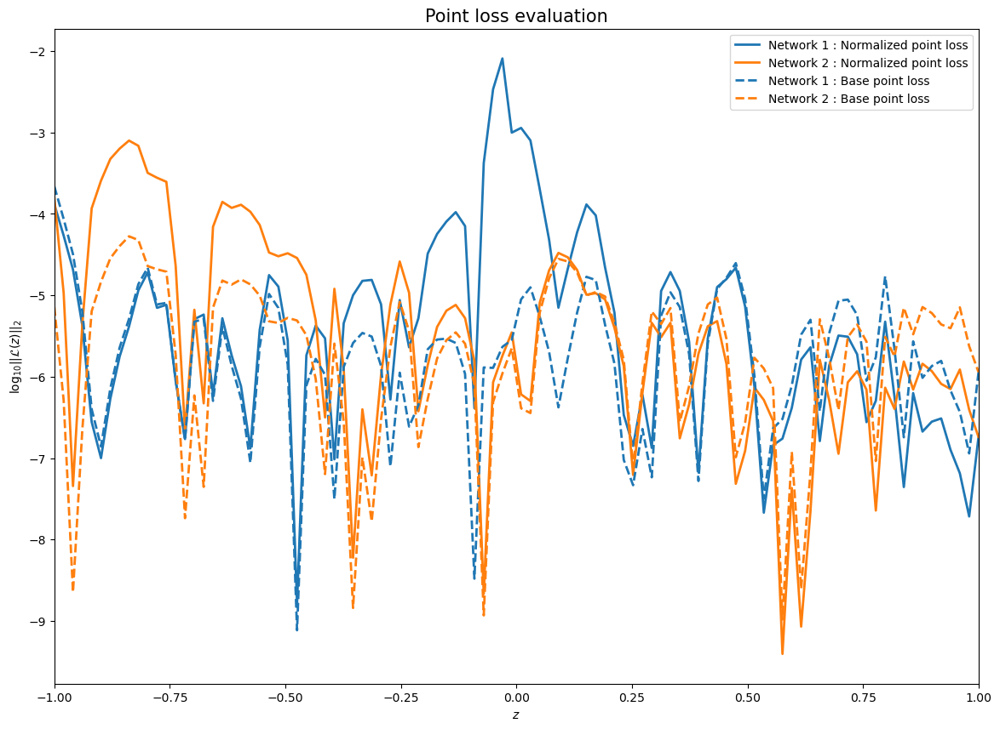

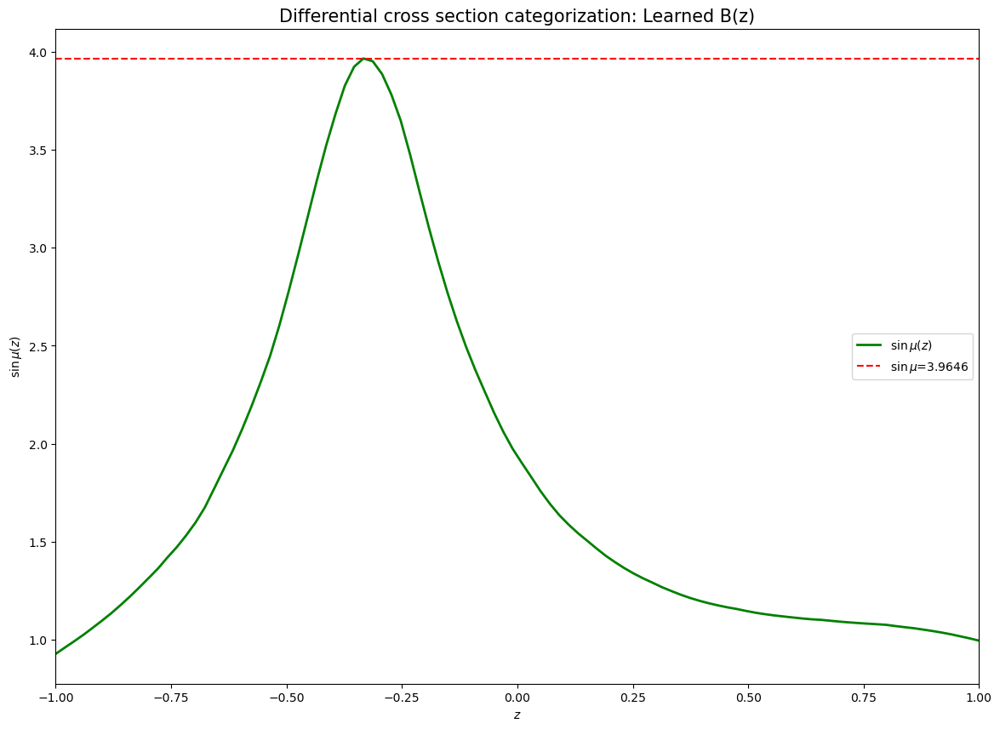

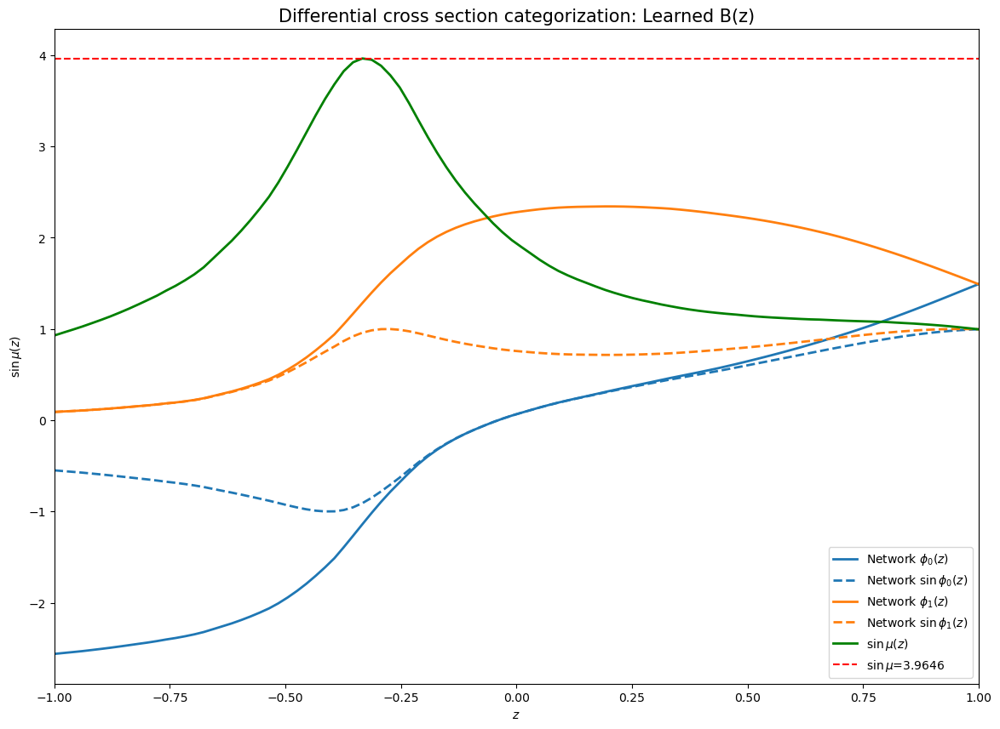

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 195 operations to synchronize with Neptune. Do not kill this process.
All 195 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1794


In [33]:
#seeds = [42, 1, 2, 3, 4]
seeds = [42]

for seed in seeds:

    # Start the Neptune logger run
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_amb_test")

    params = {'batch_size': 64,
             'epochs_num': 1500,
             'repulsive_epochs': [0, 1000],
             #'learning_rate': 0.003,
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             #'zeros': [[1.2, 0.6]],
             #'zeros': [[0.6, 0.9]],
             #'zeros': [[1.3, 0.5]],
             'zeros': [[1.0, 0.5]],
             'zeros_learn': False, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive': 1.0}

    tags = {'Ambiguity': 'Single z1', 'optimizer': 'Adam', 'Mode': 'Constant param' , 'Seed': str(seed)}
    run["sys/tags"].add(list(tags.values()))

    run['parameters'] = params


    netsolver_init = train_run(params, device, run, seed_num=seed, optim_name='Adam')
    
    zpointseval, modeval, phievals, eval_pt_loss_s, eval_pt_loss_no_s  = eval_run_amp(netsolver_init, params, device, run)

    plot_bmod(zpointseval, modeval, run)
    plot_phases(zpointseval, phievals, run)
    plot_point_losses(zpointseval, eval_pt_loss_s, eval_pt_loss_no_s, run)

    integralz = sin_mu_integral(netsolver_init, zpointseval)
    plot_sin_mu(zpointseval, integralz, run)

    plot_summaries(zpointseval, phievals, integralz, run)


    # Make sure to kill the Neptune logger run
    run.stop()

Now do the scans without any repulsive loss but initializing them at the original network value

In [46]:
# Number of sampling points in both directions
num_x = 20
num_y = 10

# Prepare the grid of points
scan_range_x = np.linspace(0.01, 1.99, num=num_x)
scan_range_y = np.linspace(0.01, 0.99, num=num_y)
param_grid = np.dstack(np.meshgrid(scan_range_x, scan_range_y)).reshape(-1, 2)

# Prepare the seeds
seeds = [42]


run_scan_z = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_Scan_z1")

log_res_z = {'params':param_grid, 'sinmu':np.empty([num_x, num_y, len(seeds)]), 'base_loss':np.empty([num_x, num_y, len(seeds)]), 'scale_loss':np.empty([num_x, num_y, len(seeds)]), 'repulsive_loss':np.empty([num_x, num_y, len(seeds)])}

for i, params_lin in enumerate(tqdm(param_grid, unit='grid_point')):
        
    x_index = i % num_x
    y_index = int((i - i % num_x)/num_x)
    

    params_scan = {'batch_size': 64,
             'epochs_num': 500,
             'repulsive_epochs': [0, 1000],
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             'zeros': [[scan_range_x[x_index], scan_range_y[y_index]]],
             'zeros_learn': False, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive': 0.0}
    
    # Start from the same pretrained network
    pre_trained_amps_z1=deepcopy(netsolver_init.amps_net)
    pre_trained_amps_z1.zeros = [[scan_range_x[x_index], scan_range_y[y_index]]]
    
    tags = {'Ambiguity': 'Scanning z1', 'optimizer': 'Adam', 'Mode': 'Constant param'}
    run_scan_z["sys/tags"].add(list(tags.values()))

    run_scan_z['parameters'] = params_scan
    
    sinmu_pt = []
    base_loss_pt = []
    scale_loss_pt = []
    repulsive_loss_pt = []
    
    for seed in tqdm(seeds, unit='seed',leave = False):
            
        netsolver = train_run(params_scan, device, run_scan_z, seed_num=seed, optim_name='Adam', plot_init=False, amps_net=pre_trained_amps_z1)

        zpointseval, eval_loss_base, eval_loss_scaled, repulsive_loss = eval_run_scan(netsolver, params_scan, device, run_scan_z)
        sinmu = max(sin_mu_integral(netsolver, zpointseval).cpu())
        
        sinmu_pt.append(sinmu.cpu().numpy())
        base_loss_pt.append(eval_loss_base.cpu().numpy())
        scale_loss_pt.append(eval_loss_scaled.cpu().numpy())
        repulsive_loss_pt.append(repulsive_loss.cpu().numpy())
        
    log_res_z['sinmu'][x_index, y_index, :] = np.array(sinmu_pt)
    log_res_z['base_loss'][x_index, y_index, :] = np.array(base_loss_pt)
    log_res_z['scale_loss'][x_index, y_index, :] = np.array(scale_loss_pt)
    log_res_z['repulsive_loss'][x_index, y_index, :] = np.array(repulsive_loss_pt)

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1597
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


  0%|          | 0/200 [00:00<?, ?grid_point/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

In [79]:
new_log_z = update_log_results(log_res_z, repulsive_threshold=2.0)

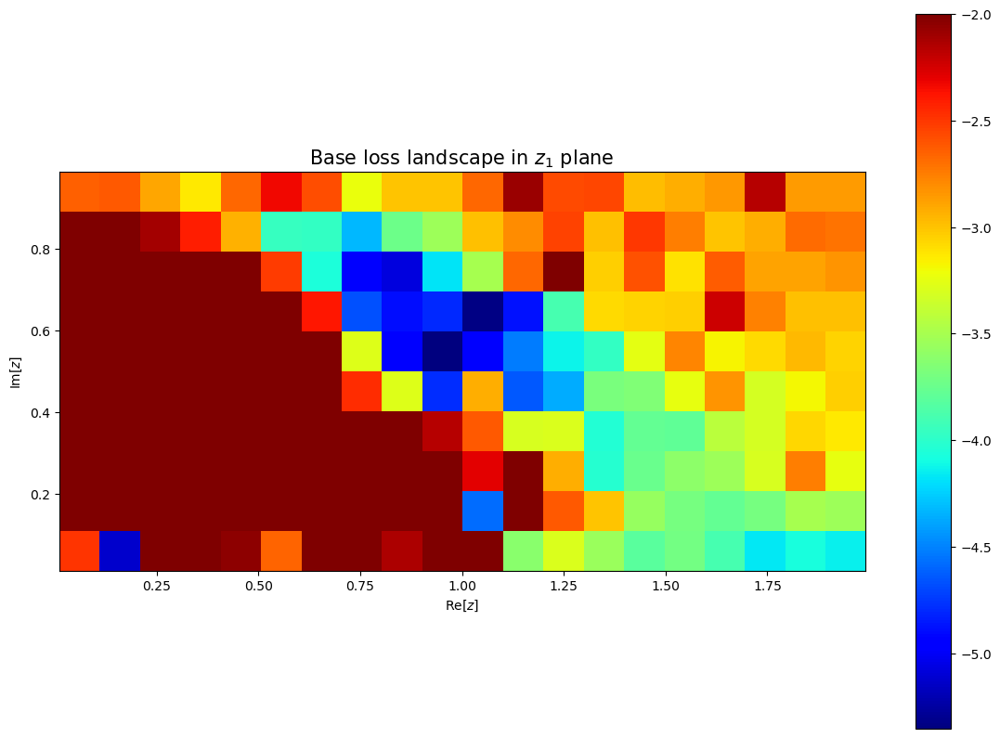

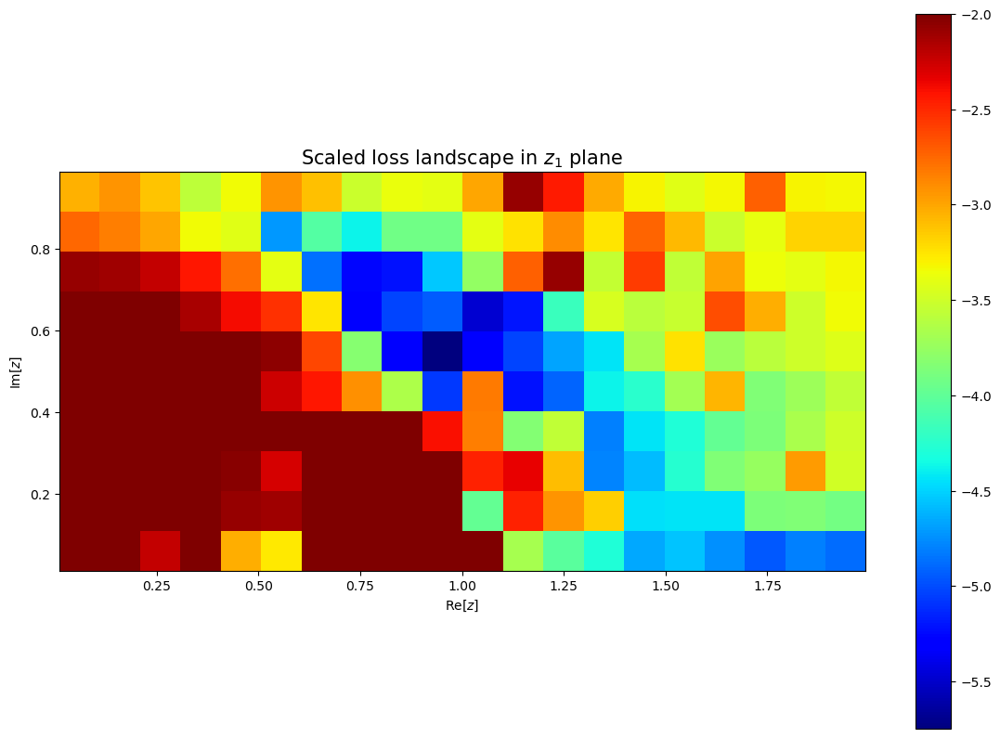

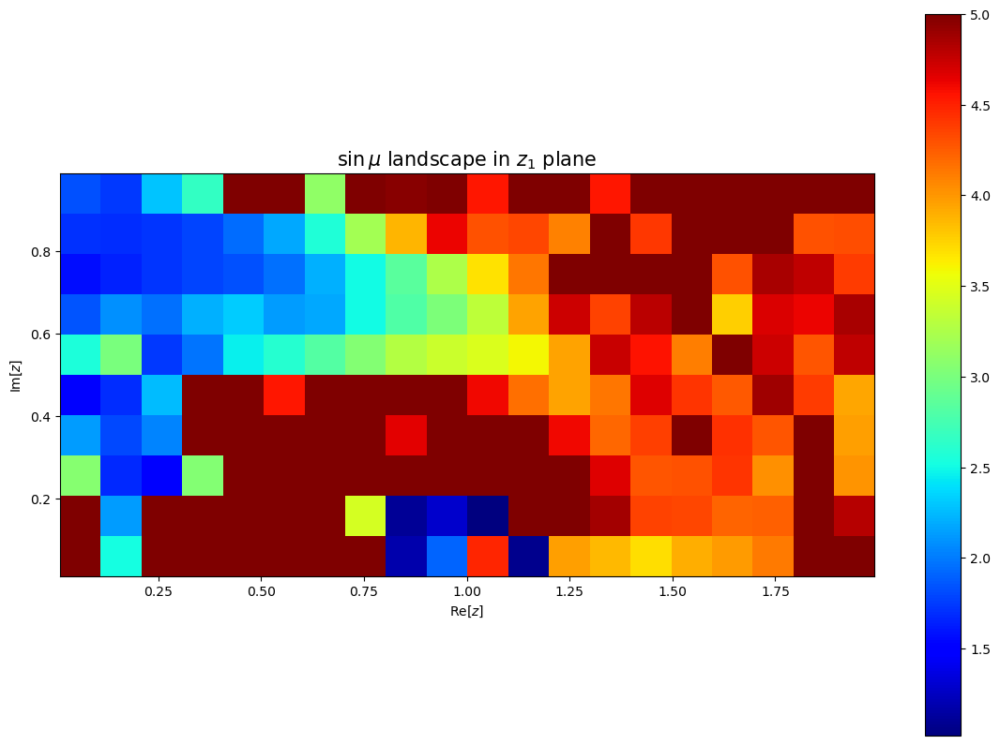

In [78]:
plot_contour_loss_curves_linear(new_log_z, run_scan_z, log_type='base10', logging=True)

In [83]:
# Make sure to kill the Neptune logger run
run_scan_z.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 1 operations to synchronize with Neptune. Do not kill this process.
All 1 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1597


Can also do scans by only taking for initialization the network corresponding to a pre-solved neighbour

In [23]:
import random 
from copy import deepcopy

def get_neighbour_networks(scan_nets, index_x, index_y):
    networks = scan_nets['Networks']
    losses = scan_nets['Min_loss']
    len_x = len(networks)
    len_y = len(networks[0])
    
    nn_indices = [[index_x+1,index_y], [index_x-1,index_y], [index_x,index_y-1], [index_x,index_y+1], [index_x,index_y]]
    nn_nets = []
    nn_loss = []
    for index_pair in nn_indices:
        if 0 <= index_pair[0] < len_x and 0 <= index_pair[1] < len_y:
            net_neighbour = networks[index_pair[0], index_pair[1]] 
            if net_neighbour is not None:
                nn_nets.append(net_neighbour)
                nn_loss.append(losses[index_pair[0], index_pair[1]] )
    
    return None if len(nn_nets) ==0 else nn_nets[np.argmin(np.array(nn_loss))]
#  random.choice(nn_nets)

In [157]:
# Number of sampling points in both directions
num_x = 80
num_y = 40

# Prepare the grid of points
#scan_range_x = np.linspace(0.01, 1.99, num=num_x)
scan_range_x = np.linspace(-1.99, -0.01,num=num_x)
scan_range_y = np.linspace(0.01, 0.99, num=num_y)
param_grid = np.dstack(np.meshgrid(scan_range_x, scan_range_y)).reshape(-1, 2)

# Prepare the seeds
seeds = [42]


run_scan_z = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_Scan_z1")

log_res_z = {'params':param_grid, 'sinmu':np.empty([num_x, num_y, len(seeds)]), 'base_loss':np.empty([num_x, num_y, len(seeds)]), 'scale_loss':np.empty([num_x, num_y, len(seeds)]), 'repulsive_loss':np.empty([num_x, num_y, len(seeds)])}
scan_nets = {'Evaluated':  np.zeros([num_x, num_y],dtype=bool), 'Networks': np.empty([num_x, num_y],dtype=object), 'Min_loss': np.empty([num_x, num_y])}

# Set the initial network point
# Point is at [1.2,0.6]
scan_nets['Networks'][int(num_x*1.2/2), int(num_y*0.6)] = deepcopy(netsolver_fixed.amps_net)

all_evaluated = False

pbar = tqdm(total = scan_nets['Evaluated'].size, unit='grid_point')

while not all_evaluated:

    for i, params_lin in enumerate(param_grid):

        x_index = i % num_x
        y_index = int((i - i % num_x)/num_x)
        
        net_nn = get_neighbour_networks(scan_nets, x_index, y_index)

        if not scan_nets['Evaluated'][x_index, y_index] and net_nn is not None:
        
            params_scan = {'batch_size': 64,
                     'epochs_num': 500,
                     'repulsive_epochs': [0, 1000],
                     'learning_rate': 0.003,
                     'lr_scheduler': True, 
                     'beta1' : 0.9,
                     'beta2' : 0.999,
                     'integral_points': 25,
                     'method_int': 'trapz',
                     'layer_list': [64, 64, 64, 64],
                     'loss': 'MSE',
                     'scaled_loss': True,
                     'zeros': [[scan_range_x[x_index], scan_range_y[y_index]]],
                     'zeros_learn': False, 
                     'zeros_freeze': True, 
                     'disconnected': False,
                     'complex_pred': True,
                     'p_value': 2,
                     'lambda_repulsive': 0.0}
            
            # Start from the same pretrained network
            pre_trained_amps_z1=deepcopy(net_nn)
            pre_trained_amps_z1.zeros = [[scan_range_x[x_index], scan_range_y[y_index]]]

            tags = {'Ambiguity': 'Scanning z1', 'optimizer': 'Adam', 'Mode': 'Constant param'}
            run_scan_z["sys/tags"].add(list(tags.values()))

            run_scan_z['parameters'] = params_scan

            sinmu_pt = []
            base_loss_pt = []
            scale_loss_pt = []
            repulsive_loss_pt = []

            for seed in tqdm(seeds, unit='seed',leave = False):

                netsolver = train_run(params_scan, device, run_scan_z, seed_num=seed, optim_name='Adam', plot_init=False, amps_net=pre_trained_amps_z1)

                zpointseval, eval_loss_base, eval_loss_scaled, repulsive_loss = eval_run_scan(netsolver, params_scan, device, run_scan_z)
                sinmu = max(sin_mu_integral(netsolver, zpointseval).cpu())

                sinmu_pt.append(sinmu.cpu().numpy())
                base_loss_pt.append(eval_loss_base.cpu().numpy())
                scale_loss_pt.append(eval_loss_scaled.cpu().numpy())
                repulsive_loss_pt.append(repulsive_loss.cpu().numpy())
                
                path_save = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans_z1_nn/'

                end_path = 'networksb_{}_{}.pth'.format(x_index, y_index)
                path = path_save + end_path
                torch.save(netsolver.amps_net.cpu(), path)
                
                

            log_res_z['sinmu'][x_index, y_index, :] = np.array(sinmu_pt)
            log_res_z['base_loss'][x_index, y_index, :] = np.array(base_loss_pt)
            log_res_z['scale_loss'][x_index, y_index, :] = np.array(scale_loss_pt)
            log_res_z['repulsive_loss'][x_index, y_index, :] = np.array(repulsive_loss_pt)
            
            scan_nets['Evaluated'][x_index, y_index] = True
            scan_nets['Networks'][x_index, y_index] = deepcopy(netsolver.amps_net)
            scan_nets['Min_loss'][x_index, y_index] = min(np.array(base_loss_pt))
            pbar.update(1)
            all_evaluated = scan_nets['Evaluated'].all()

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1979
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


  0%|          | 0/3200 [00:00<?, ?grid_point/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

In [158]:
path_save = '/Users/aurelien/PycharmProjects/JupyterNb/results_scans_z1_nn/'

for key in log_res_z.keys():
    end_path = '_scanz1b.npy'
    path = path_save + str(key) + end_path
    np.save(path, log_res_z[key])

In [159]:
new_log_z = update_log_results(log_res_z, repulsive_threshold=2.2, base_threshold=0.0001)

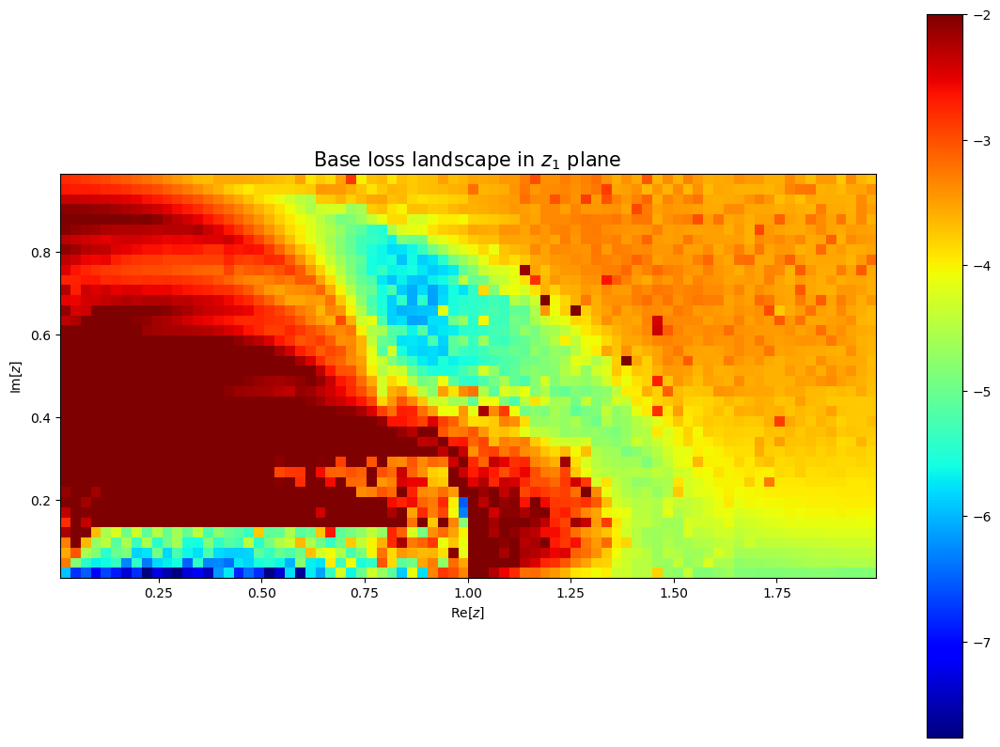

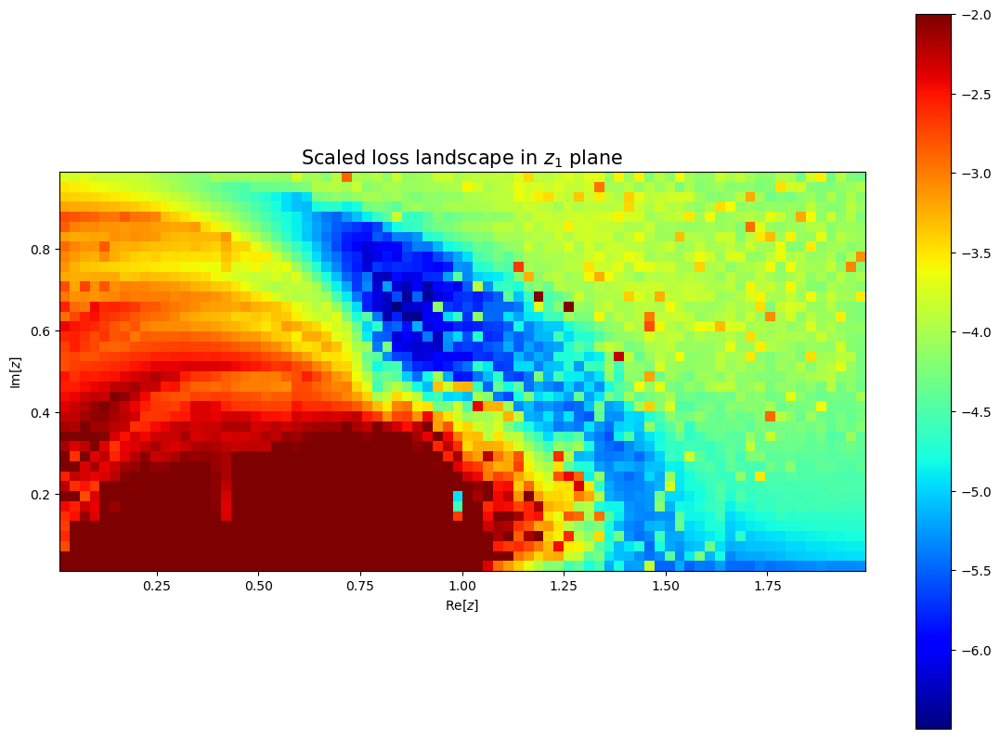

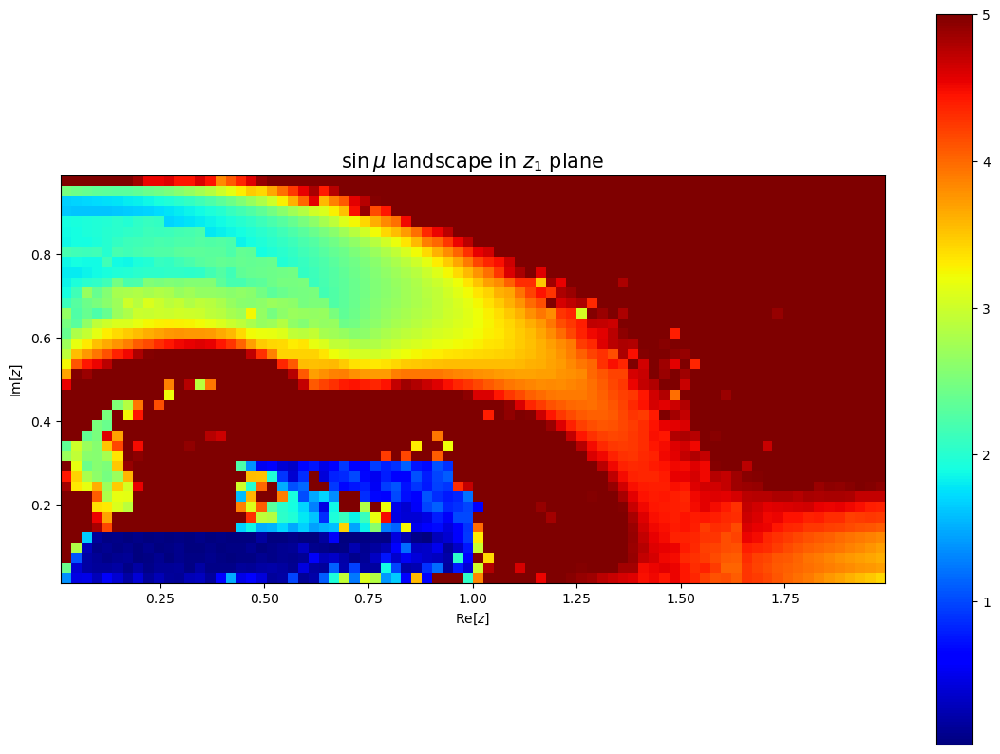

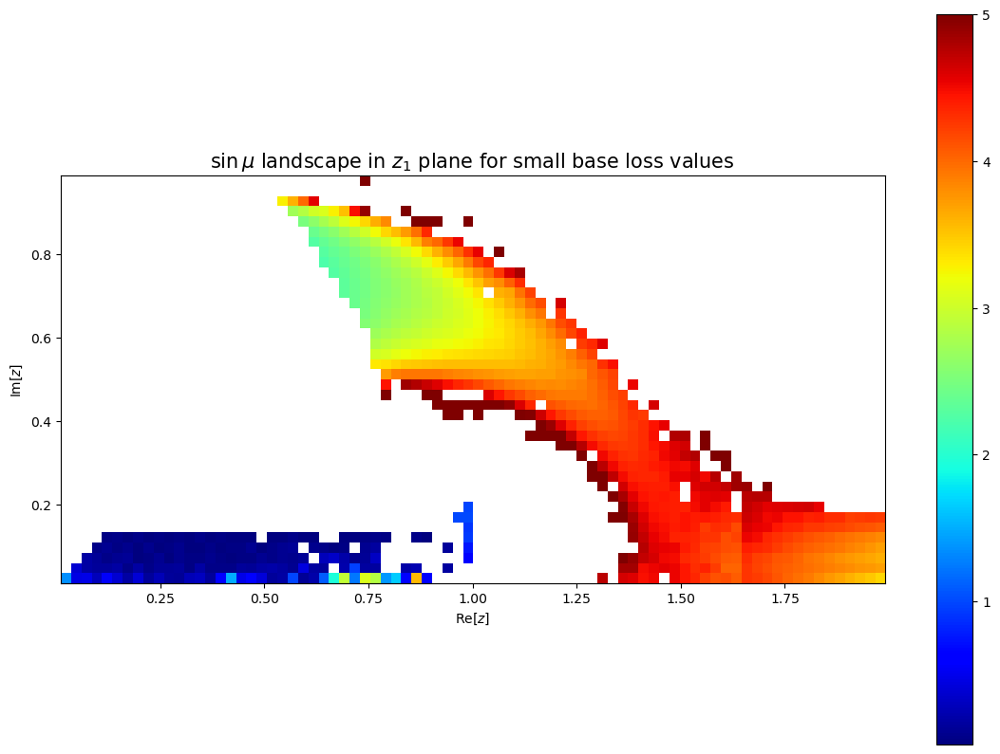

In [160]:
plot_contour_loss_curves_linear(new_log_z, run_scan_z, log_type='base10', logging=True)

In [161]:
# Make sure to kill the Neptune logger run
run_scan_z.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 144 operations to synchronize with Neptune. Do not kill this process.
All 144 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1979


In [410]:
new_repulsive_loss = np.empty([num_x, num_y])

for i, params_lin in tqdm(enumerate(param_grid)):

    x_index = i % num_x
    y_index = int((i - i % num_x)/num_x)
    
    netsolver_temp = create_solver_with_net(params_scan, torch.device('cpu'), deepcopy(scan_nets['Networks'][int(x_index)][int(y_index)]))
    netsolver_temp.zeros = [[scan_range_x[x_index], scan_range_y[y_index]]]
    netsolver_temp.amps_net.device = torch.device('cpu')
    loss_outs = netsolver_temp.dual_loss_ambiguity(torch.linspace(-1,1,100), multiple_out=1)
    new_repulsive_loss[x_index, y_index] = np.max(np.array([val.detach().numpy() for val in loss_outs]))

0it [00:00, ?it/s]

In [411]:
new_log_z['new_repulsive_loss'] = new_repulsive_loss

Dedicated pictures

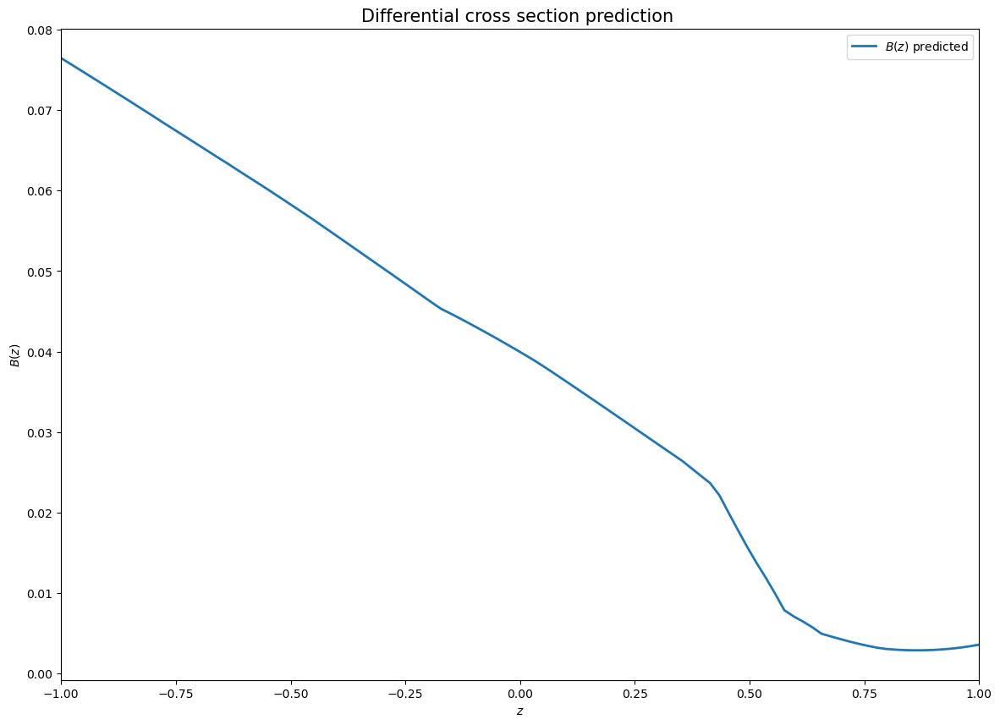

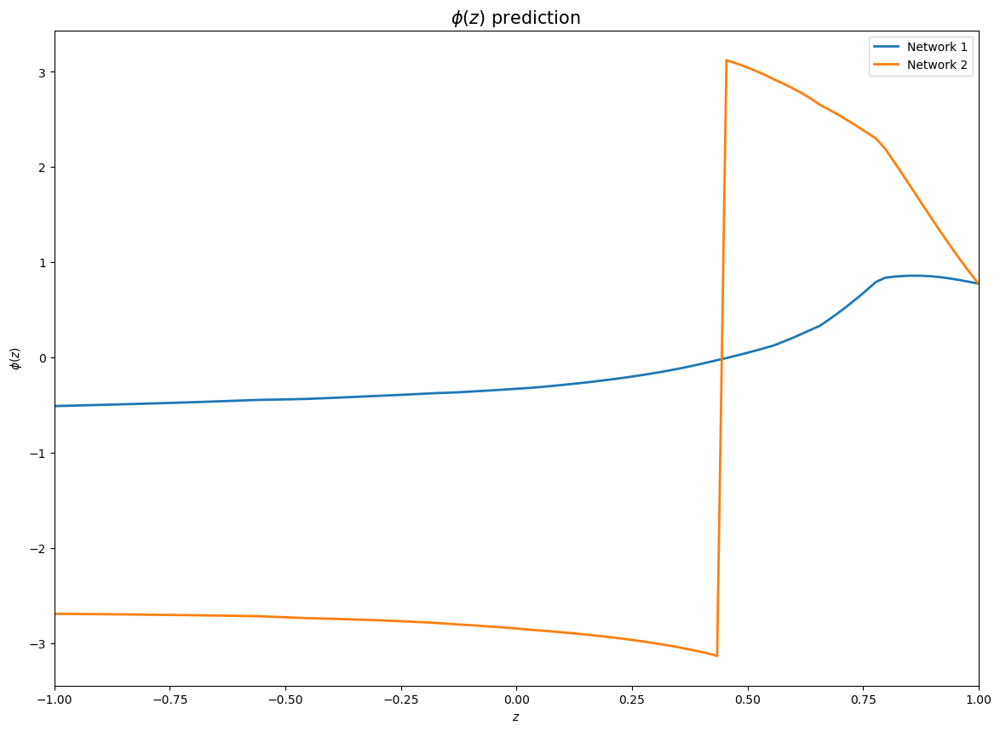

In [228]:
scan_nets['Networks'][int(80*4/10)][int(40*1/4)].device = torch.device('cpu')
plot_init_values(scan_nets['Networks'][int(80*4/10)][int(40*1/4)])

In [422]:
from copy import deepcopy

scale_loss = np.transpose(np.log10(new_log_z['scale_loss']))
mask_loss = np.transpose(np.log10(new_log_z['scale_loss'])) < -4.5
mask_repulsive = np.transpose(new_log_z['new_repulsive_loss']) < 0.99
sin_mu = np.transpose(new_log_z['sinmu'])
sin_mu_cut = deepcopy(sin_mu)
sin_mu_cut[~mask_loss] = np.nan
sin_mu_cut[~mask_repulsive] = np.nan

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_84000/3061417799.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_84000/3061417799.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


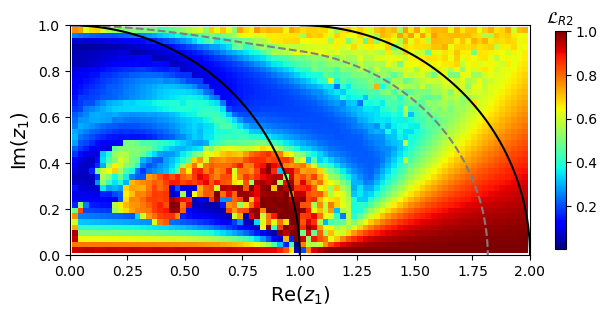

In [416]:
repulsive_loss = np.transpose(new_log_z['new_repulsive_loss'])
fig = plt.figure()
rc('text', usetex=False)
im = plt.imshow(repulsive_loss, extent=[min_x,max_x,min_y,max_y], cmap='jet', vmax=1.0, origin='lower')   

  
cbar = plt.colorbar(im,fraction=0.022)
cbar.ax.set_title('$\mathcal{L}_{R2}$')
plt.xlim([0,2])
plt.ylim([0,1])
plot_atkinson_bound()
plt.xlabel('Re$(z_1)$', fontsize=14)
plt.ylabel('Im$(z_1)$', fontsize=14) 
plt.show()


#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Atkinson_infinite/z1_new_repulsive_bounds.pdf',bbox_inches='tight')

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_84000/3061417799.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_84000/3061417799.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


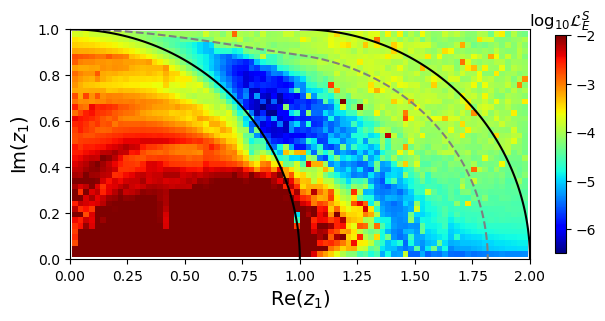

6.4 4.8


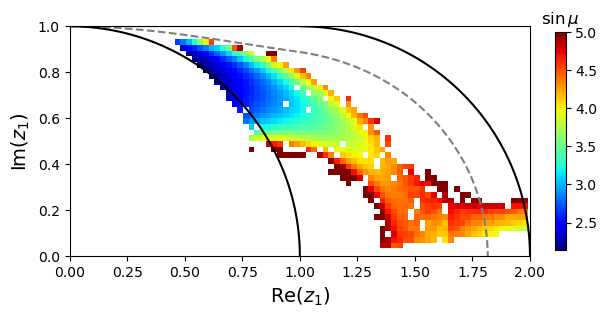

In [528]:
import matplotlib.font_manager
from matplotlib import rc

min_x = min(log_res_z['params'][:,0])
max_x = max(log_res_z['params'][:,0])
min_y = min(log_res_z['params'][:,1])
max_y = max(log_res_z['params'][:,1])

#rc('font', **{'family': 'serif', 'serif': ['Computer Modern']})
rc('text', usetex=False)

    
#fig2 = plt.figure(figsize=(14, 10))
fig = plt.figure()
im = plt.imshow(scale_loss, extent=[min_x,max_x,min_y,max_y], cmap='jet', vmax=-2.0, origin='lower') 


cbar = plt.colorbar(im,fraction=0.022)
cbar.ax.set_title('$\log_{10} \mathcal{L}_E^S$')
plot_atkinson_bound()
plt.xlim([0,2])
plt.ylim([0,1])
plt.xlabel('Re$(z_1)$', fontsize=14)
plt.ylabel('Im$(z_1)$', fontsize=14) 

plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Atkinson_infinite/z1_scaled_bounds.pdf',bbox_inches='tight')


fig = plt.figure()

im = plt.imshow(sin_mu_cut, extent=[min_x,max_x,min_y,max_y], cmap='jet', vmax=5.0, origin='lower')   

  
cbar = plt.colorbar(im,fraction=0.022)
cbar.ax.set_title('$\sin \mu$')
plt.xlim([0,2])
plt.ylim([0,1])
plot_atkinson_bound()
plt.xlabel('Re$(z_1)$', fontsize=14)
plt.ylabel('Im$(z_1)$', fontsize=14) 

plt.show()


#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Atkinson_infinite/z1_sinmu_cut3_bounds.pdf',bbox_inches='tight')

In [453]:
print(np.nanmin(sin_mu_cut))
print(np.where(sin_mu_cut==np.nanmin(sin_mu_cut)))

2.133458137512207
(array([33]), array([22]))


In [454]:
print(new_log_z['params'][33*80+22])
print(new_log_z['scale_loss'][22][33])
print(new_log_z['sinmu'][22][33])

[0.56139241 0.83923077]
2.2763975721318275e-05
2.133458137512207


In [456]:
import csv

# Load the correct CSV files with the regions
data_regions=[]

for i in range(6):
    file_region = open("/Users/aurelien/PycharmProjects/JupyterNb/atkinson_scans/region{}.csv".format(i+1), 'r')
    data_regions.append(list(csv.reader(file_region, delimiter=',', quoting = csv.QUOTE_NONNUMERIC)))

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_84000/3061417799.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_84000/3061417799.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


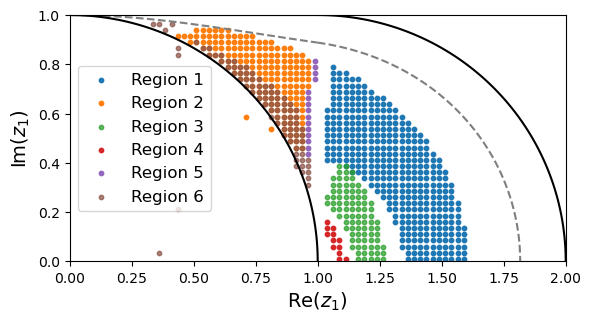

Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError
Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError
Communication with Neptune restored!
Communication with Neptune restored!
Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterTimeout
Communication with Neptune restored!


Exception in thread NeptuneWebhooks:
Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 108, in recv
    bytes_ = _recv()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/websocket/_socket.py", line 87, in _recv
    return sock.recv(bufsize)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/ssl.py", line 1227, in recv
    return self.read(buflen)
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/ssl.py", line 1102, in read
    return self._sslobj.read(len)
TimeoutError: [Errno 60] Operation timed out

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/threading.py", line 980, in _bootstrap_inner
    self.run()
  File "/Users/aurelien/miniforge3/envs/spinorhelicity/lib/python3.9/site-packages/neptune/ne

In [536]:
fig = plt.figure(figsize=(6.4,3.2))
for i in range(6):
    if i ==5 or i == 2:
        plt.scatter(np.array(data_regions[i])[:,0], np.array(data_regions[i])[:,1], s=10, alpha=0.75, edgecolors='face')
    else:
        plt.scatter(np.array(data_regions[i])[:,0], np.array(data_regions[i])[:,1], s=10, alpha=1.0, edgecolors='face')
plot_atkinson_bound()

plt.xlim([0,2])
plt.ylim([0,1])
plt.xlabel('Re$(z_1)$', fontsize=14)
plt.ylabel('Im$(z_1)$', fontsize=14) 
plt.legend(['Region 1','Region 2','Region 3','Region 4','Region 5','Region 6'], fontsize=12)
plt.show()


fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Atkinson_infinite/classical_bounds.pdf',bbox_inches='tight')

### Studying the gradients of $\sin \mu$

The question we can now ask is whether we have the ability to probe the $z_1$ plane and flow towards the area of lowest $\sin \mu$

We start by loading the trained models and statistice from the cluster and plot the resulting loss and $\sin \mu$ values. Here we will load everything on the cpu by default.

Can start to see how to load a model and plot the resulting amplitudes and differential cross section

In [48]:
device = torch.device('cpu')
model_test = torch.load("/Users/aurelien/Documents/Projects/S-matrix_bootstrap/models/model3/model_z1_scan_38_2.pth", map_location=torch.device('cpu'))
model_test.device = device

In [49]:
log_res_test['params'][2*40+38]

array([1.93923077, 0.11315789])

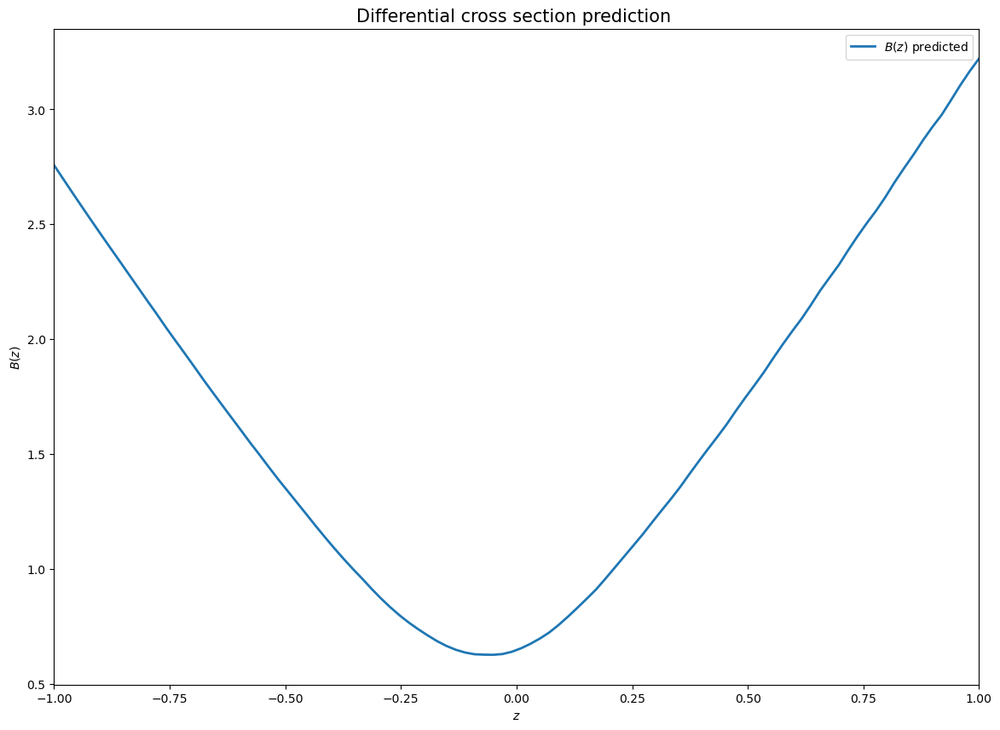

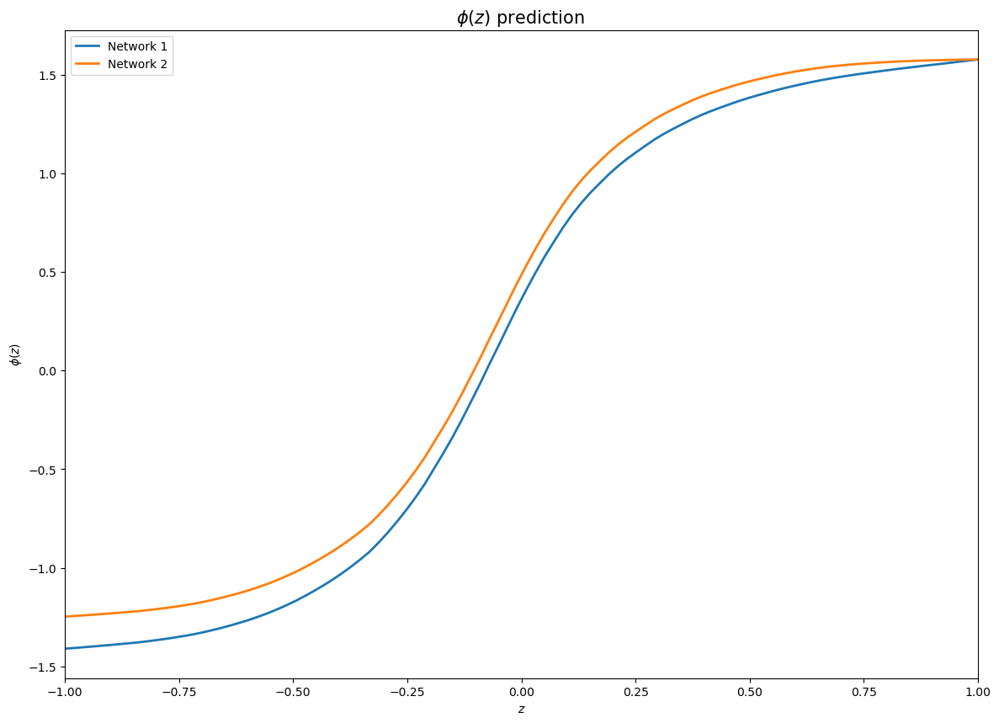

In [50]:
plot_init_values(model_test)

Recover the logs containing all of the evaluation metrics

In [51]:
# Number of sampling points in both directions
num_x = 40
num_y = 20

# Prepare the grid of points
scan_range_x = np.linspace(0.01, 1.99, num=num_x)
scan_range_y = np.linspace(0.01, 0.99, num=num_y)
param_grid = np.dstack(np.meshgrid(scan_range_x, scan_range_y)).reshape(-1, 2)
log_res_test = {'params':param_grid, 'sinmu':np.empty([num_x, num_y]), 'base_loss':np.empty([num_x, num_y]), 'scale_loss':np.empty([num_x, num_y]), 'repulsive_loss':np.empty([num_x, num_y])}

# Prepare the relevant parameters
params_scan = {'batch_size': 64,
         'epochs_num': 500,
         'repulsive_epochs': [0, 1000],
         'learning_rate': 0.003,
         'lr_scheduler': True, 
         'beta1' : 0.9,
         'beta2' : 0.999,
         'integral_points': 25,
         'method_int': 'trapz',
         'layer_list': [64, 64, 64, 64],
         'loss': 'MSE',
         'scaled_loss': True,
         'zeros': [[1.0, 0.5]],
         'zeros_learn': False, 
         'zeros_freeze': True, 
         'disconnected': False,
         'complex_pred': True,
         'p_value': 2,
         'lambda_repulsive': 0.0}

In [52]:
pbar = tqdm(total = log_res_test['sinmu'].size, unit='grid_point')

for i, params_lin in enumerate(param_grid):

    x_index = i % num_x
    y_index = int((i - i % num_x)/num_x)

    net_nn = torch.load("/Users/aurelien/Documents/Projects/S-matrix_bootstrap/models/model3/model_z1_scan_{}_{}.pth".format(x_index, y_index), map_location=torch.device('cpu'))
    net_nn.device = device


    # Start from the same pretrained network
    pre_trained_amps_z1=deepcopy(net_nn)
    params_scan['zeros'] = [[scan_range_x[x_index], scan_range_y[y_index]]]
    netsolver = create_solver_with_net(params_scan, device, pre_trained_amps_z1, seed_num=42)

    zpointseval, eval_loss_base, eval_loss_scaled, repulsive_loss = eval_run_scan(netsolver, params_scan, device)
    sinmu = max(sin_mu_integral(netsolver, zpointseval).cpu())

    log_res_test['sinmu'][x_index, y_index] = sinmu.cpu().numpy()
    log_res_test['base_loss'][x_index, y_index] = eval_loss_base.cpu().numpy()
    log_res_test['scale_loss'][x_index, y_index] = eval_loss_scaled.cpu().numpy()
    log_res_test['repulsive_loss'][x_index, y_index] = repulsive_loss.cpu().numpy()

    pbar.update(1)

  0%|          | 0/800 [00:00<?, ?grid_point/s]

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_84000/1529236210.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_84000/1529236210.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


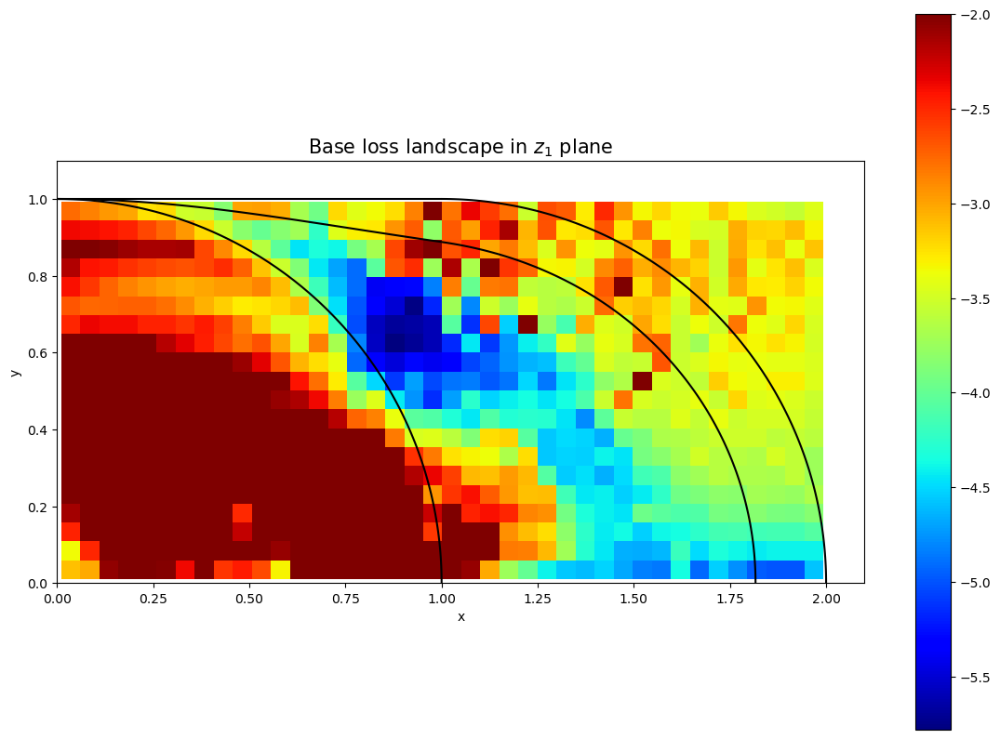

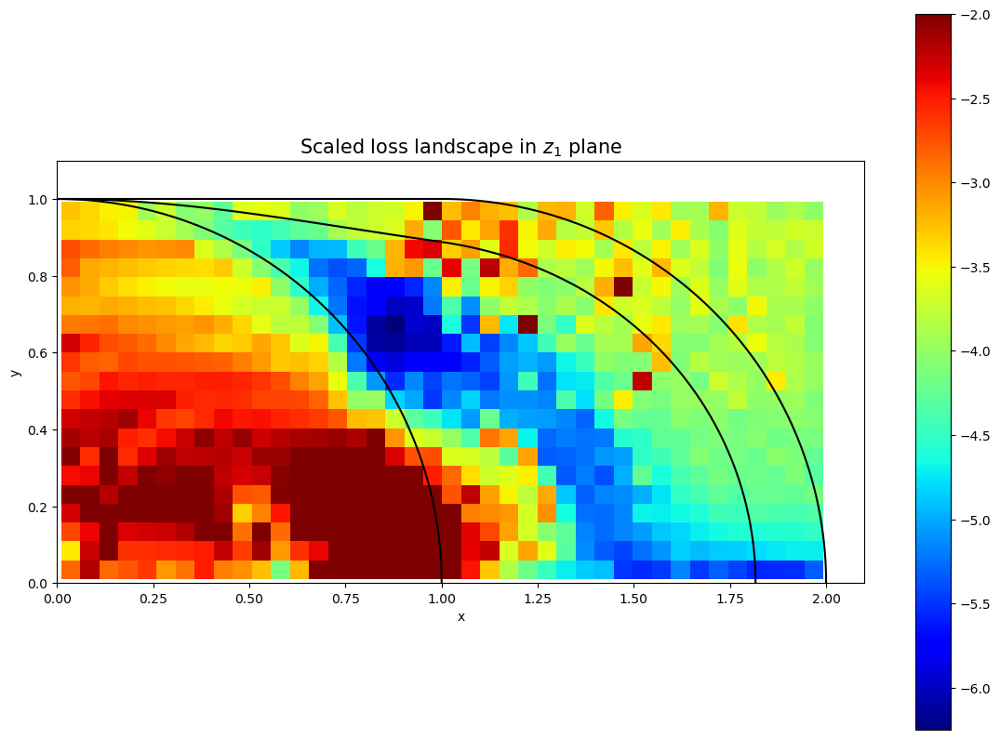

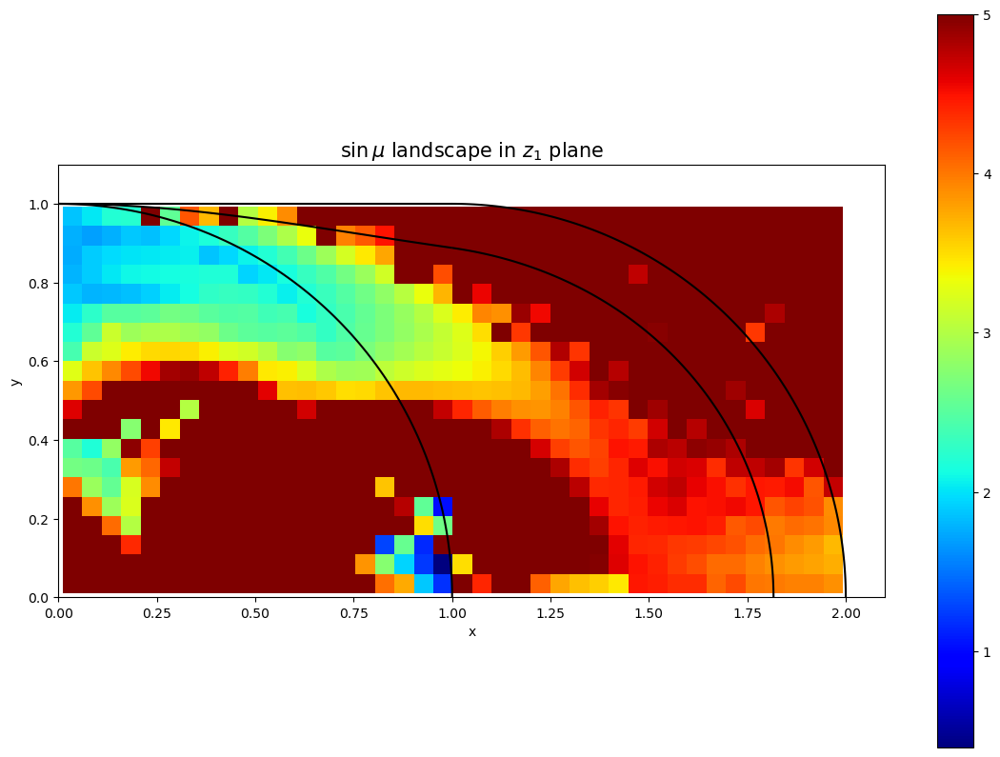

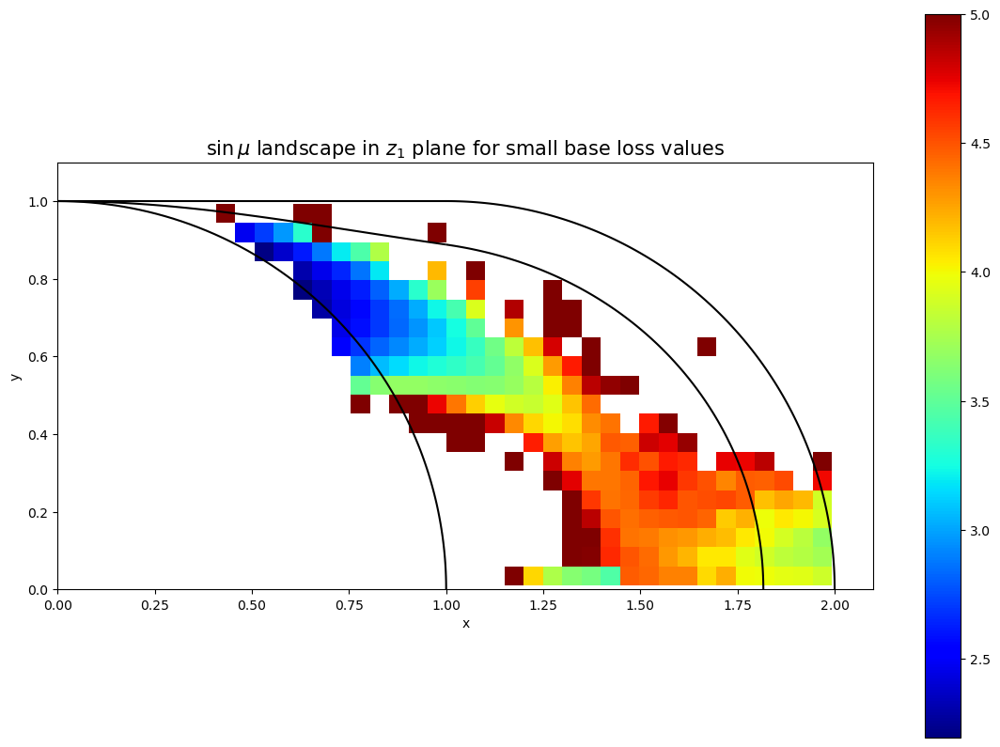

In [53]:
new_log_test = simple_update_log(log_res_test, base_threshold=0.00025)
plot_contour_loss_curves_linear(new_log_test, None, log_type='base10', logging=False, atkinson_bounds=True)

Now focus on a given $z_1$ point and recover the value of $z$ for which the kernel is maximum (defining $\sin \mu$)

In [39]:
log_res_test['sinmu'][15, 10]

3.5137746334075928

In [40]:
log_res_test['params'][10*40+15]

array([0.77153846, 0.52578947])

In [34]:
# Number of sampling points in both directions
num_x = 40
num_y = 20

# Prepare the grid of points
scan_range_x = np.linspace(0.01, 1.99, num=num_x)
scan_range_y = np.linspace(0.01, 0.99, num=num_y)
param_grid = np.dstack(np.meshgrid(scan_range_x, scan_range_y)).reshape(-1, 2)

In [35]:
index_x_in = 12
index_y_in = 15
device = torch.device('cpu')

net_nn = torch.load("/Users/aurelien/Documents/Projects/S-matrix_bootstrap/models/model3/model_z1_scan_{}_{}.pth".format(index_x_in, index_y_in), map_location=torch.device('cpu'))
net_nn.device = device
pre_trained_amps_z1=deepcopy(net_nn)
zeros_in = [scan_range_x[index_x_in], scan_range_y[index_y_in]]
params_scan['zeros'] = [zeros_in]
netsolver = create_solver_with_net(params_scan, device, pre_trained_amps_z1, seed_num=42)
zpointseval, loss_base_temp,_ , _ = eval_run_scan(netsolver, params_scan, device)
zerovect = netsolver.amps_net.set_zeros([zeros_in], keep_grad=True)
sinmuint = sin_mu_integral(netsolver, zpointseval).cpu()

NameError: name 'params_scan' is not defined

In [43]:
zmaxsinmu = zpointseval[torch.argmax(sinmuint).item()].item()

In [62]:
#15 10
print(zmaxsinmu)
print(zeros_in)

-0.45454543828964233
[0.7715384615384615, 0.5257894736842105]


In [44]:
#12 15
print(zmaxsinmu)
print(zeros_in)

-0.2929292917251587
[0.6192307692307693, 0.7836842105263158]


In [363]:
#16 10
print(zmaxsinmu)
print(zeros_in)

-0.41414138674736023
[0.8223076923076923, 0.5257894736842105]


In [366]:
#15 11
print(zmaxsinmu)
print(zeros_in)

-0.4343434274196625
[0.7715384615384615, 0.5773684210526315]


In [45]:
sinmuint = sin_mu_integral(netsolver, torch.tensor([zmaxsinmu], device=device), keep_grad=True)
print(sinmuint)

tensor([2.1939], grad_fn=<DivBackward0>)


In [46]:
vect_grad = torch.autograd.grad(sinmuint, zerovect, create_graph=True)[0]

In [47]:
dx = param_grid[1][0]-param_grid[0][0]
dy = param_grid[40][1]-param_grid[39][1]

In [48]:
vect_grad*torch.tensor([dx, dy], device=device)

tensor([[ 0.0608, -0.0029]], dtype=torch.float64, grad_fn=<MulBackward0>)

In [49]:
print(log_res_test['sinmu'][16, 10]- log_res_test['sinmu'][15, 10])
print(log_res_test['sinmu'][15, 11]- log_res_test['sinmu'][15, 10])
print(log_res_test['sinmu'][14, 10]- log_res_test['sinmu'][15, 10])
print(log_res_test['sinmu'][15, 9]- log_res_test['sinmu'][15, 10])

0.11834549903869629
-0.6082601547241211
-0.016571760177612305
1.5782358646392822


Doesn't seem like the evaluated gradient match well with the actual observed variations of $\sin \mu$. This is probably due to both the variations of the $z_{max}$ value and the corresponding $A(z,z_1)$ function.

Instead we can compute the real gradient by just looking at the computed values of $\sin \mu$

In [63]:
ux, uy = np.gradient(new_log_test['sinmucut'], dx, dy, edge_order=1)
normg = np.linalg.norm(np.array((ux, uy)), axis=0)

In [62]:
xt, yt = np.meshgrid(scan_range_x, scan_range_y)

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/1529236210.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/1529236210.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


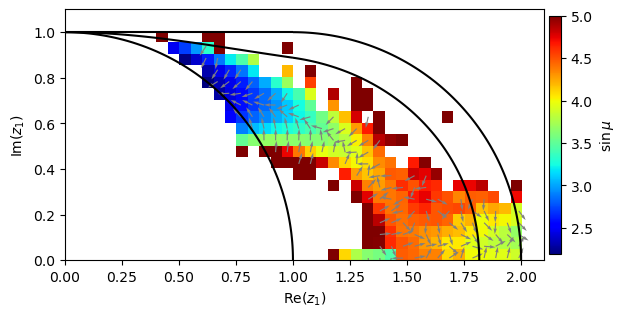

In [210]:
im = plt.imshow(np.transpose(new_log_test['sinmucut']), cmap='jet', vmax=5.0, origin='lower', extent=[0,2,0,1])
cbar =plt.colorbar(im,fraction=0.024, pad=0.01)
cbar.ax.set_ylabel('$\sin \mu$')
plt.quiver(np.transpose(xt), np.transpose(yt), -ux/normg, -uy/normg, units='xy', scale=20, color='gray')
plot_atkinson_bound()
plt.xlabel('Re$(z_1)$')
plt.ylabel('Im$(z_1)$')
plt.savefig("/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/infinite_p_waves_ambiguity/contour_sinmu_cut_nn_flow.png")
plt.savefig("/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/infinite_p_waves_ambiguity/contour_sinmu_cut_nn_flow.pdf")
plt.show()

In [67]:
ux2, uy2 = np.gradient(new_log_test['sinmu'], dx, dy, edge_order=1)
normg2 = np.linalg.norm(np.array((ux2, uy2)), axis=0)

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/1529236210.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/1529236210.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


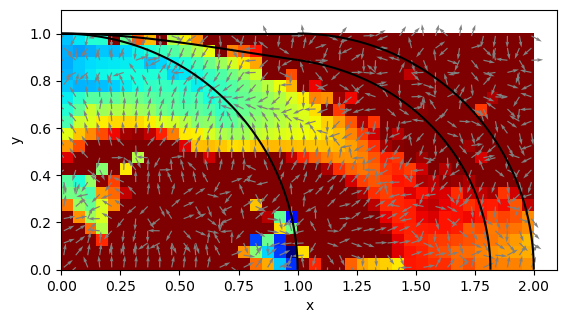

In [68]:
plt.imshow(np.transpose(new_log_test['sinmu']), cmap='jet', vmax=5.0, origin='lower', extent=[0,2,0,1])
plt.quiver(np.transpose(xt), np.transpose(yt), -ux2/normg2, -uy2/normg2, units='xy', scale=20, color='gray')
plot_atkinson_bound()
plt.show()

### Now do a gradient descent with respect to $\sin \mu$ in the $z_1$ place

Initial pre-training phase

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1651
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
ModuleAmplitudes(
  (base_f): ModuleNetAmplitude(
    (activation): ReLU()
    (positive_activ): Softplus(beta=1, threshold=20)
    (model): Sequential(
      (layer_1): Linear(in_features=1, out_features=64, bias=True)
      (activation_1): ReLU()
      (layer_2): Linear(in_features=64, out_features=64, bias=True)
      (activation_2): ReLU()
      (layer_3): Linear(in_features=64, out_features=64, bias=True)
      (activation_3): ReLU()
      (layer_4): Linear(in_features=64, out_features=64, bias=True)
      (activation_4): ReLU()
      (layer_5): Linear(in_features=64, out_features=2, bias=True)
    )
  )
)


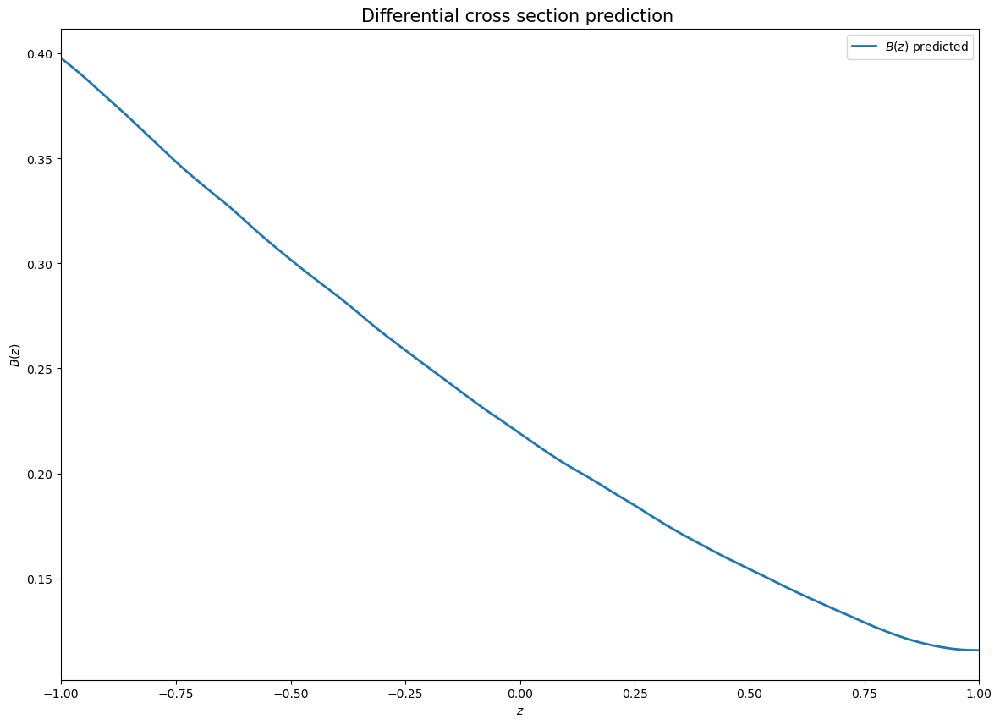

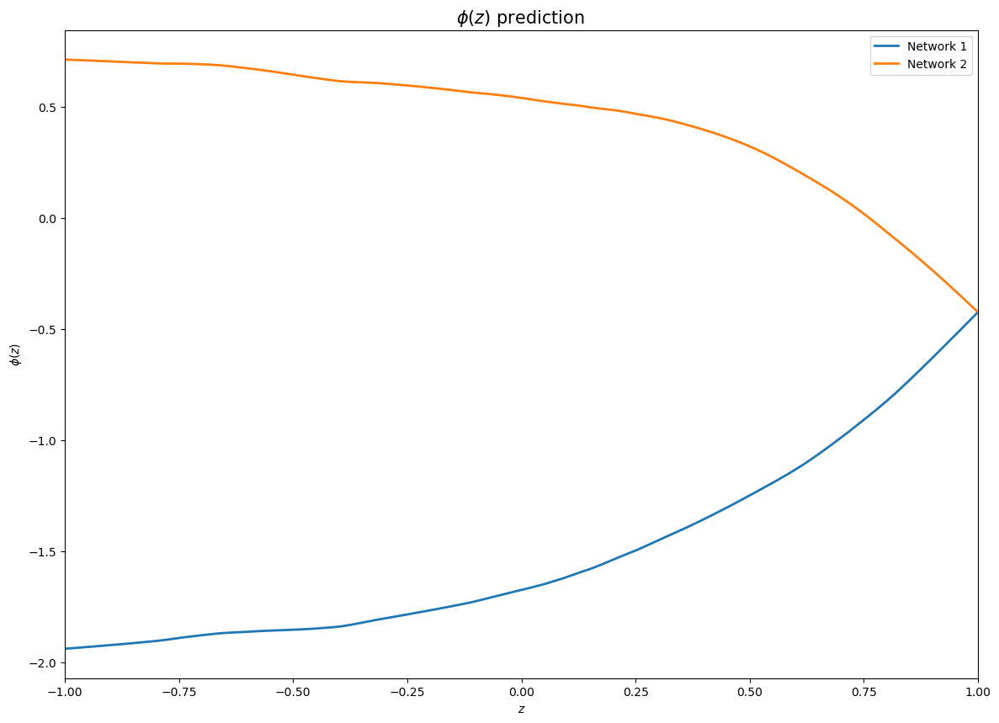

  0%|          | 0/1500 [00:00<?, ?epoch/s]

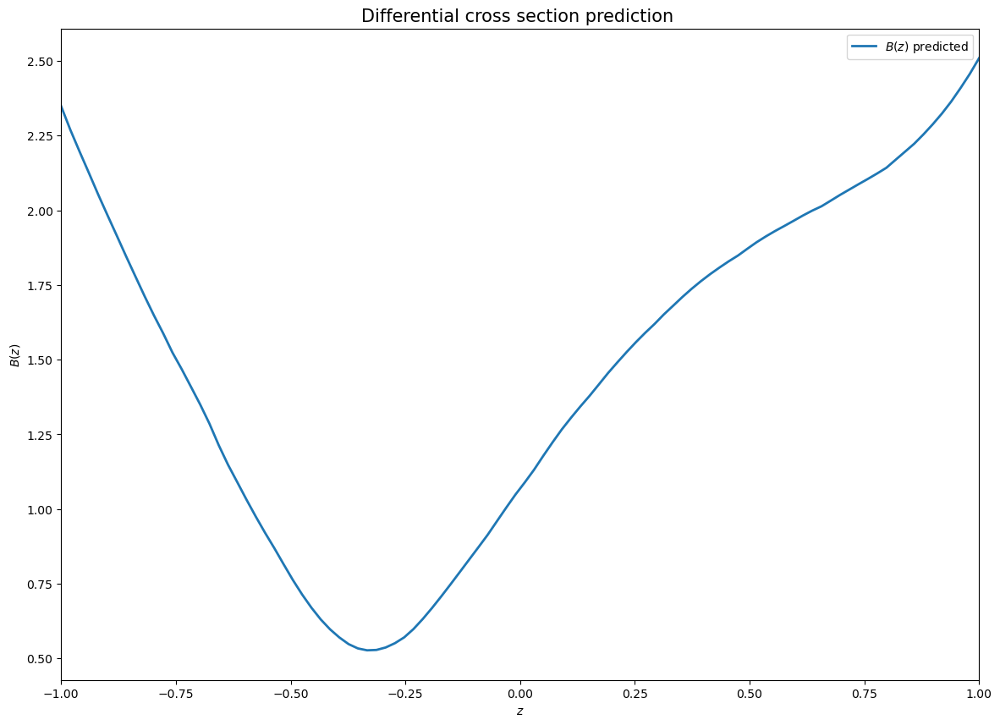

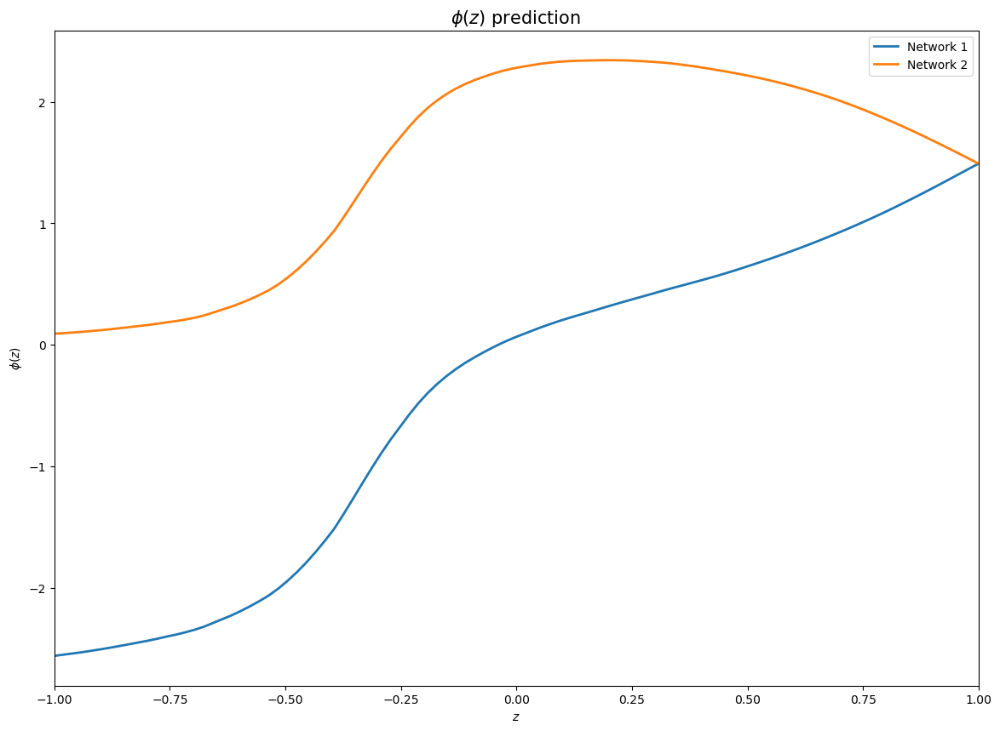

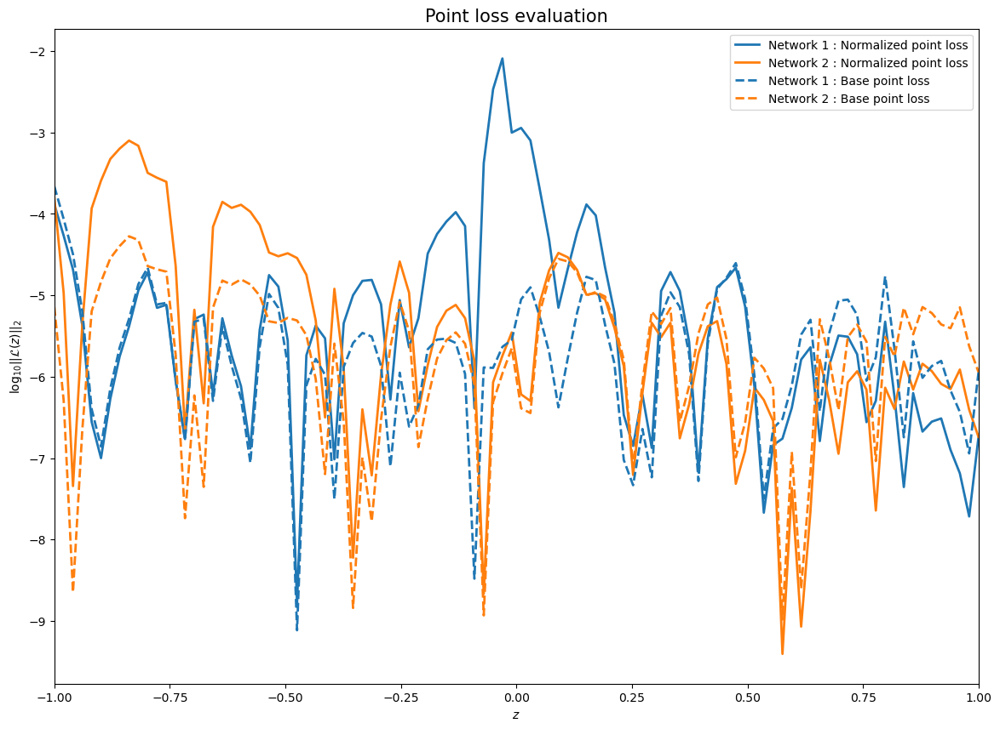

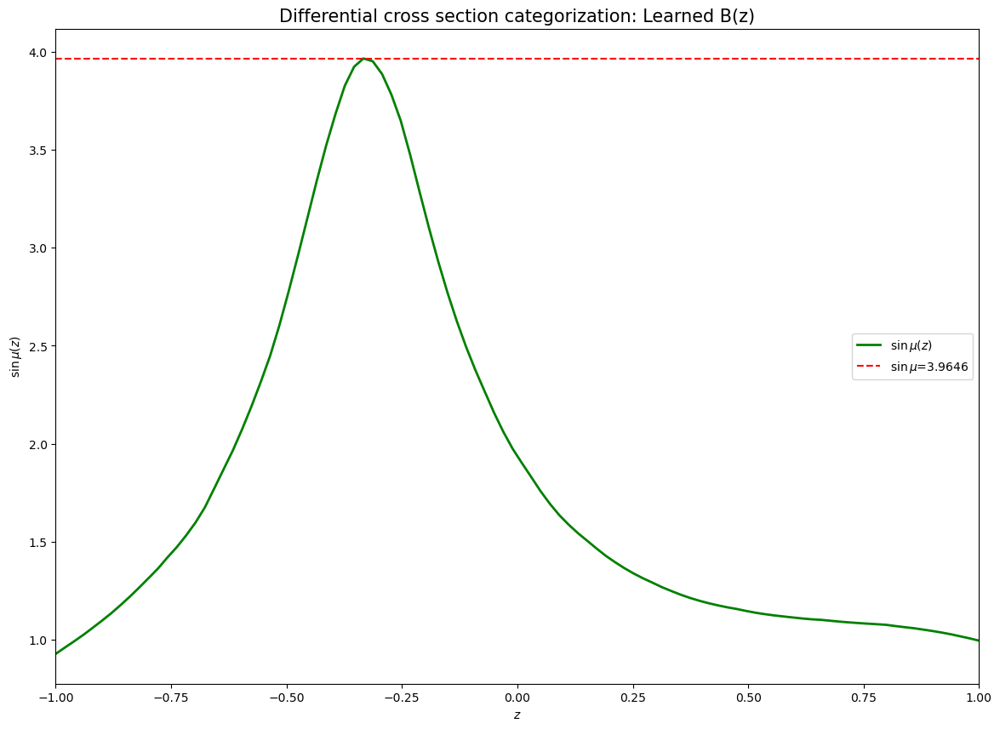

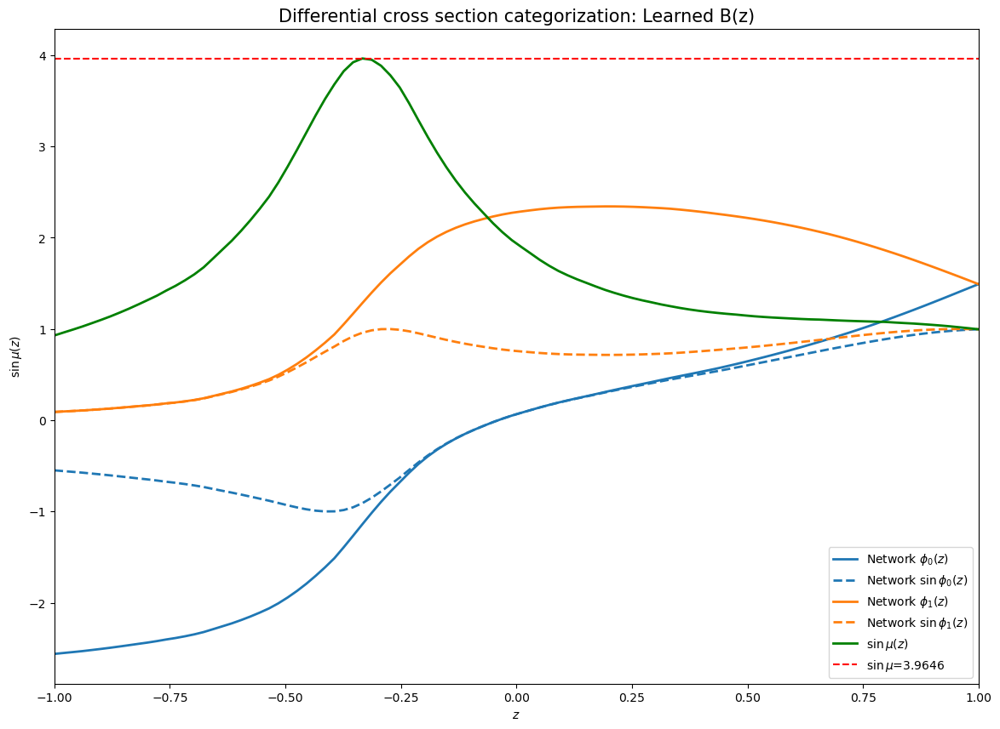

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 129 operations to synchronize with Neptune. Do not kill this process.
All 129 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1651


In [34]:
seed =42

# Start the Neptune logger run
run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_amb_test")

params = {'batch_size': 64,
         'epochs_num': 1500,
         'repulsive_epochs': [0, 1000],
         'learning_rate': 0.003,
         'lr_scheduler': True, 
         'beta1' : 0.9,
         'beta2' : 0.999,
         'integral_points': 25,
         'method_int': 'trapz',
         'layer_list': [64, 64, 64, 64],
         'loss': 'MSE',
         'scaled_loss': True,
         'zeros': [[1.2, 0.6]],
         'zeros_learn': False, 
         'zeros_freeze': True, 
         'disconnected': False,
         'complex_pred': True,
         'p_value': 2,
         'lambda_repulsive': 1.0}

tags = {'Ambiguity': 'Single z1', 'optimizer': 'Adam', 'Mode': 'Constant param' , 'Seed': str(seed)}
run["sys/tags"].add(list(tags.values()))

run['parameters'] = params


netsolver_init = train_run(params, device, run, seed_num=seed, optim_name='Adam')

zpointseval, modeval, phievals, eval_pt_loss_s, eval_pt_loss_no_s  = eval_run_amp(netsolver_init, params, device, run)

plot_bmod(zpointseval, modeval, run)
plot_phases(zpointseval, phievals, run)
plot_point_losses(zpointseval, eval_pt_loss_s, eval_pt_loss_no_s, run)

integralz = sin_mu_integral(netsolver_init, zpointseval)
plot_sin_mu(zpointseval, integralz, run)

plot_summaries(zpointseval, phievals, integralz, run)


# Make sure to kill the Neptune logger run
run.stop()

In [50]:
def calculate_grad(params, epsilon, zero_start, sinmustart, style, base_net, run_neptune, seed=42, dim=0):
        
    zero_1 = deepcopy(zero_start)
    zero_2 = deepcopy(zero_start)
    
    if style == 'central':
        zero_1[dim] = zero_1[dim] + epsilon
        zero_2[dim] = zero_2[dim] - epsilon
        factor = 2*epsilon
    
    if style == 'forward':
        zero_1[dim] = zero_1[dim] + epsilon
        zero_2 = 'Calculated'
        factor = epsilon
    
    if style == 'backward':
        zero_1 = 'Calculated'
        zero_2[dim] = zero_2[dim] - epsilon
        factor = epsilon
    
    sinmus = []
    
    for zero in [zero_1, zero_2]:
        
        if zero == 'Calculated':
            sinmus.append(sinmustart)
        else:
            pre_trained_amps_z1=deepcopy(base_net)
            pre_trained_amps_z1.zeros = [zero]

            netsolver = train_run(params, base_net.device, run_neptune, seed_num=seed, amps_net=pre_trained_amps_z1, plot_init=False)
            zpointseval = torch.linspace(-1,1,steps=100, device=base_net.device)
            sinmu = max(sin_mu_integral(netsolver, zpointseval).cpu())
            sinmus.append(sinmu)

    return (sinmus[0] - sinmus[1])/factor
    

In [162]:
# Prepare the seeds
seed = 42

device = torch.device('mps')
# Prepare the initial point
init_zero = [1.0, 0.5]

# Prepare the overall parameters
params_scan = {'batch_size': 64,
             'epochs_num': 500,
             'repulsive_epochs': [0, 1000],
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             'zeros': [init_zero],
             'zeros_learn': False, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive': 0.0}

# Prepare the loggers
run_scan_sinmu = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_Scan_sinmu")
log_sinmu_scan = {'points_visit':[init_zero], 'sinmu': [], 'gradients':[], 'networks':[], 'loss_base':[], 'loss_scale':[]}

# Do the initial point run
netsolver_in = train_run(params_scan, device, run_scan_sinmu, seed_num=seed, optim_name='Adam', plot_init=False, amps_net=deepcopy(netsolver_init.amps_net))
init_net = deepcopy(netsolver_in.amps_net)

# Get the initial stats
zpointseval, eval_loss_base, eval_loss_scaled, _ = eval_run_scan(netsolver_in, params_scan, device, run_scan_sinmu)
init_sinmu = max(sin_mu_integral(netsolver_in, zpointseval))
log_sinmu_scan['loss_base'].append(eval_loss_base)
log_sinmu_scan['loss_scale'].append(eval_loss_scaled)
log_sinmu_scan['sinmu'].append(init_sinmu)
log_sinmu_scan['networks'].append(init_net)

# Prepare the parameters for the finite difference
epsilon = 0.001
lr = 0.005
style = 'central'
max_pts = 50
small_grad = False


# To track the execution speed
pbar = tqdm(total=max_pts, unit='grid_point')

# Loop while we have a large gradient or we have not exceeded the budget
while not small_grad and len(log_sinmu_scan['points_visit']) < max_pts:
    
    print('Start at z1 = [{},{}] with sinmu = {}'.format(init_zero[0],init_zero[1], init_sinmu))
    
    # Calculate the gradient
    grad_x = calculate_grad(params_scan, epsilon, init_zero, init_sinmu, style, init_net, run_scan_sinmu, seed=seed, dim=0)
    grad_y = calculate_grad(params_scan, epsilon, init_zero, init_sinmu, style, init_net, run_scan_sinmu, seed=seed, dim=1)
    log_sinmu_scan['gradients'].append([grad_x, grad_y])
    
    print('Looked at z1 = [{},{}] and got a gradient [{},{}]'.format(init_zero[0],init_zero[1], grad_x, grad_y))
    
    small_grad = (grad_x**2 + grad_y**2) < 0.01
    
    # Update the value of the zero location (put some cutoff on the gradient)
    new_zero_x = init_zero[0] - lr*min(abs(grad_x), 25)*grad_x/abs(grad_x)
    new_zero_y = init_zero[1] - lr*min(abs(grad_y), 25)*grad_y/abs(grad_y)
    init_zero = [new_zero_x, new_zero_y]
    norm_zero = np.sqrt(new_zero_x**2 + new_zero_y**2)
    
    # Check that we stay out of unit circle, if not we project out by a bit more
    if norm_zero < 1:
          init_zero = [new_zero_x*(1.01)/norm_zero, new_zero_y*(1.01)/norm_zero]
    
    params_scan['zeros'] = [init_zero]
    
    # Update the new initial net and train it at that point
    init_net = deepcopy(init_net)
    init_net.zeros = [init_zero]
    netsolver = train_run(params_scan, device, run_scan_sinmu, seed_num=seed, optim_name='Adam', plot_init=False, amps_net=init_net)

    zpointseval, eval_loss_base, eval_loss_scaled, _ = eval_run_scan(netsolver, params_scan, device, run_scan_sinmu)
    init_sinmu = max(sin_mu_integral(netsolver, zpointseval).cpu())
    
    log_sinmu_scan['points_visit'].append(init_zero)
    log_sinmu_scan['loss_base'].append(eval_loss_base)
    log_sinmu_scan['loss_scale'].append(eval_loss_scaled)
    log_sinmu_scan['sinmu'].append(init_sinmu)
    log_sinmu_scan['networks'].append(deepcopy(init_net))
  
    pbar.update(1)

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1654
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/50 [00:00<?, ?grid_point/s]

Start at z1 = [1.0,0.5] with sinmu = 3.9882326126098633


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [1.0,0.5] and got a gradient [-6.240963459014893,-17.167924880981445]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [1.0312048196792603,0.5858396291732788] with sinmu = 3.330615758895874


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [1.0312048196792603,0.5858396291732788] and got a gradient [0.4196166694164276,-2.7735230922698975]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [1.0291067361831665,0.5997072458267212] with sinmu = 3.288590431213379


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [1.0291067361831665,0.5997072458267212] and got a gradient [0.3126859664916992,-0.2925395965576172]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [1.027543306350708,0.6011699438095093] with sinmu = 3.28374981880188


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [1.027543306350708,0.6011699438095093] and got a gradient [2.29489803314209,-3.2024381160736084]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [1.0160688161849976,0.6171821355819702] with sinmu = 3.222081184387207


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [1.0160688161849976,0.6171821355819702] and got a gradient [4262.63037109375,0.8116959929466248]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.8910688161849976,0.6131236553192139] with sinmu = 3.0046474933624268


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.8910688161849976,0.6131236553192139] and got a gradient [0.9351968169212341,-4.9217939376831055]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.8863928318023682,0.6377326250076294] with sinmu = 2.9262633323669434


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.8863928318023682,0.6377326250076294] and got a gradient [2.107858657836914,-0.12874603271484375]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.8758535385131836,0.6383763551712036] with sinmu = 2.9057564735412598


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.8758535385131836,0.6383763551712036] and got a gradient [2.0221471786499023,0.3001689910888672]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.8657428026199341,0.6368755102157593] with sinmu = 2.8862314224243164


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.8657428026199341,0.6368755102157593] and got a gradient [0.18811224400997162,-0.6581544280052185]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.8648022413253784,0.6401662826538086] with sinmu = 2.880675792694092


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.8648022413253784,0.6401662826538086] and got a gradient [4.217267036437988,-3.2111403942108154]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.8437159061431885,0.6562219858169556] with sinmu = 2.800427198410034


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.8437159061431885,0.6562219858169556] and got a gradient [3.744959592819214,-4.955053329467773]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.8249911069869995,0.6809972524642944] with sinmu = 2.715127944946289


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.8249911069869995,0.6809972524642944] and got a gradient [2.065896987915039,-1.2814997434616089]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.8146616220474243,0.6874047517776489] with sinmu = 2.680389881134033


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.8146616220474243,0.6874047517776489] and got a gradient [1.5231369733810425,-1.993656039237976]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.8070459365844727,0.6973730325698853] with sinmu = 2.6564393043518066


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.8070459365844727,0.6973730325698853] and got a gradient [2.5920865535736084,-0.8354186415672302]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.7940855026245117,0.7015501260757446] with sinmu = 2.6196987628936768


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.7940855026245117,0.7015501260757446] and got a gradient [1.7689465284347534,0.03051757626235485]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.7852407693862915,0.7013975381851196] with sinmu = 2.598632335662842


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.7852407693862915,0.7013975381851196] and got a gradient [2.2600889205932617,-1.8136500120162964]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.7739403247833252,0.7104657888412476] with sinmu = 2.56654953956604


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.7739403247833252,0.7104657888412476] and got a gradient [2.7680394649505615,-1.6806124448776245]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.7601001262664795,0.7188688516616821] with sinmu = 2.524656295776367


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.7601001262664795,0.7188688516616821] and got a gradient [0.9729861617088318,-0.46694275736808777]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.7552351951599121,0.7212035655975342] with sinmu = 2.5117552280426025


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.7552351951599121,0.7212035655975342] and got a gradient [2.4635791778564453,0.5679130554199219]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.7429172992706299,0.7183640003204346] with sinmu = 2.4791066646575928


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.7429172992706299,0.7183640003204346] and got a gradient [2.1924972534179688,1.4170407056808472]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.73195481300354,0.7112787961959839] with sinmu = 2.4559764862060547


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.73195481300354,0.7112787961959839] and got a gradient [2.100825309753418,-0.9067057967185974]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.721450686454773,0.7158123254776001] with sinmu = 2.4253807067871094


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.721450686454773,0.7158123254776001] and got a gradient [1.8032788038253784,1.1019706726074219]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.7124342918395996,0.710302472114563] with sinmu = 2.4007649421691895


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.7124342918395996,0.710302472114563] and got a gradient [2.0966529846191406,0.13446807861328125]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.7102822065353394,0.7180524468421936] with sinmu = 2.3925154209136963


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.7102822065353394,0.7180524468421936] and got a gradient [5.01406192779541,0.8190869688987732]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6993578672409058,0.7286964058876038] with sinmu = 2.36222505569458


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6993578672409058,0.7286964058876038] and got a gradient [3.2082793712615967,0.789761483669281]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6928638815879822,0.73487389087677] with sinmu = 2.343773365020752


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6928638815879822,0.73487389087677] and got a gradient [1.8060206174850464,0.6279944777488708]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6838337779045105,0.7317339181900024] with sinmu = 2.318136215209961


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6838337779045105,0.7317339181900024] and got a gradient [1.7312763929367065,2.367377281188965]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6909297704696655,0.7366927266120911] with sinmu = 2.3368968963623047


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6909297704696655,0.7366927266120911] and got a gradient [0.9963511824607849,1.146554946899414]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6859480142593384,0.730959951877594] with sinmu = 2.3174898624420166


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6859480142593384,0.730959951877594] and got a gradient [2.8836724758148193,1.1647939682006836]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6862612366676331,0.7410435676574707] with sinmu = 2.322664976119995


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6862612366676331,0.7410435676574707] and got a gradient [1.379489779472351,0.6973742842674255]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6793637871742249,0.7375566959381104] with sinmu = 2.302248239517212


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6793637871742249,0.7375566959381104] and got a gradient [1.1525154113769531,2.584099531173706]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6876527667045593,0.7397524118423462] with sinmu = 2.3257174491882324


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6876527667045593,0.7397524118423462] and got a gradient [1.945733904838562,0.2638101577758789]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6779240965843201,0.7384333610534668] with sinmu = 2.300615072250366


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6779240965843201,0.7384333610534668] and got a gradient [3.428220510482788,2.1123886108398438]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6788828372955322,0.7478088736534119] with sinmu = 2.3047447204589844


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6788828372955322,0.7478088736534119] and got a gradient [1.3966559171676636,1.2710093259811401]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6718995571136475,0.7414538264274597] with sinmu = 2.2816758155822754


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6718995571136475,0.7414538264274597] and got a gradient [4.0836334228515625,0.31507012248039246]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6674583554267883,0.7580233216285706] with sinmu = 2.2764220237731934


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6674583554267883,0.7580233216285706] and got a gradient [2.3707151412963867,2.010941505432129]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6657405495643616,0.7595323920249939] with sinmu = 2.273529052734375


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6657405495643616,0.7595323920249939] and got a gradient [0.47481057047843933,1.3810395002365112]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6633664965629578,0.7526271939277649] with sinmu = 2.261018753051758


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6633664965629578,0.7526271939277649] and got a gradient [1.549005389213562,0.8081197142601013]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.665439248085022,0.7597965002059937] with sinmu = 2.2711949348449707


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.665439248085022,0.7597965002059937] and got a gradient [1.157999038696289,0.3502368628978729]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6596492528915405,0.7580453157424927] with sinmu = 2.252039670944214


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6596492528915405,0.7580453157424927] and got a gradient [1.764774203300476,1.9543169736862183]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6628289818763733,0.7620746493339539] with sinmu = 2.2663536071777344


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6628289818763733,0.7620746493339539] and got a gradient [2.1740198135375977,1.7158983945846558]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6608600616455078,0.7637826204299927] with sinmu = 2.2638285160064697


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6608600616455078,0.7637826204299927] and got a gradient [2.198457717895508,1.261234164237976]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6576505303382874,0.7665479183197021] with sinmu = 2.2574126720428467


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6576505303382874,0.7665479183197021] and got a gradient [1.7809866666793823,-0.012993811629712582]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.648745596408844,0.7666128873825073] with sinmu = 2.232616901397705


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.648745596408844,0.7666128873825073] and got a gradient [1.5213488340377808,1.5162228345870972]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6517386436462402,0.7715806365013123] with sinmu = 2.244375705718994


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6517386436462402,0.7715806365013123] and got a gradient [2.9401776790618896,0.16617773473262787]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6434492468833923,0.7785069942474365] with sinmu = 2.228076696395874


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6434492468833923,0.7785069942474365] and got a gradient [1.5720127820968628,0.1418590545654297]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6355891823768616,0.7777976989746094] with sinmu = 2.2067503929138184


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6355891823768616,0.7777976989746094] and got a gradient [2.195000648498535,-0.0629425048828125]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.6322522759437561,0.7876275181770325] with sinmu = 2.206965446472168


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.6322522759437561,0.7876275181770325] and got a gradient [1.4613865613937378,0.6977319121360779]


  0%|          | 0/500 [00:00<?, ?epoch/s]

Start at z1 = [0.624945342540741,0.7841388583183289] with sinmu = 2.181455373764038


  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

  0%|          | 0/500 [00:00<?, ?epoch/s]

Looked at z1 = [0.624945342540741,0.7841388583183289] and got a gradient [3.3925769329071045,1.1775493621826172]


  0%|          | 0/500 [00:00<?, ?epoch/s]

In [163]:
# Make sure to kill the Neptune logger run
run_scan_sinmu.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 192 operations to synchronize with Neptune. Do not kill this process.
All 192 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1654


In [434]:
#run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Total",with_id="TOS-1658")
run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Total")

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1683
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


In [435]:
run['evaluation/sin_mu_values'].log(log_sinmu_scan['sinmu'])
run['evaluation/gradients_values'].log(log_sinmu_scan['gradients'])
run['evaluation/point_values'].log(log_sinmu_scan['points_visit'])
run['evaluation/loss_base_values'].log(log_sinmu_scan['loss_base'])
run['evaluation/loss_scale_values'].log(log_sinmu_scan['loss_scale'])

#### LOADING THE RESULTS

In [51]:
path_init = '/Users/aurelien/PycharmProjects/JupyterNb/results_gradient_sinmu/'
log_sinmuscan_tot = {'points_visit':[], 'sinmu': [], 'gradients':[], 'networks':[], 'loss_base':[], 'loss_scale':[]}
num_pts_load = 121

for key in log_sinmuscan_tot.keys():
    if key == 'networks':
        for i in range(num_pts_load):
            end_path = '_{}.pth'.format(i)
            path = path_init + str(key) + end_path
            net_load = torch.load(path)
            net_load.device = device
            log_sinmuscan_tot[key].append(net_load)
    else:
        end_path = '.npy'
        path = path_init + str(key) + end_path
        array_data = np.load(path) 
        log_sinmuscan_tot[key] = array_data

#### Plotting the flow

In [53]:
utemp = np.diff(np.array(log_sinmuscan_tot['points_visit'])[:,0])
vtemp = np.diff(np.array(log_sinmuscan_tot['points_visit'])[:,1])
pos_ar_x = np.array(log_sinmuscan_tot['points_visit'])[:,0][:-1] + utemp/2
pos_ar_y = np.array(log_sinmuscan_tot['points_visit'])[:,1][:-1] + vtemp/2
normtemp = np.sqrt(utemp**2+vtemp**2) 

In [55]:
min_arg = np.argmin(log_sinmuscan_tot['sinmu'])

In [179]:
log_sinmuscan_tot['points_visit'][min_arg-11]

array([0.41445714, 0.92104578])

In [186]:
log_sinmuscan_tot['points_visit'][min_arg-9]

array([0.39306739, 0.93037522])

In [60]:
print(f"{log_sinmuscan_tot['loss_base'][min_arg]:.2e}")

2.43e-04


In [169]:
print(f"{log_sinmuscan_tot['sinmu'][min_arg]:.5e}")

1.99164e+00


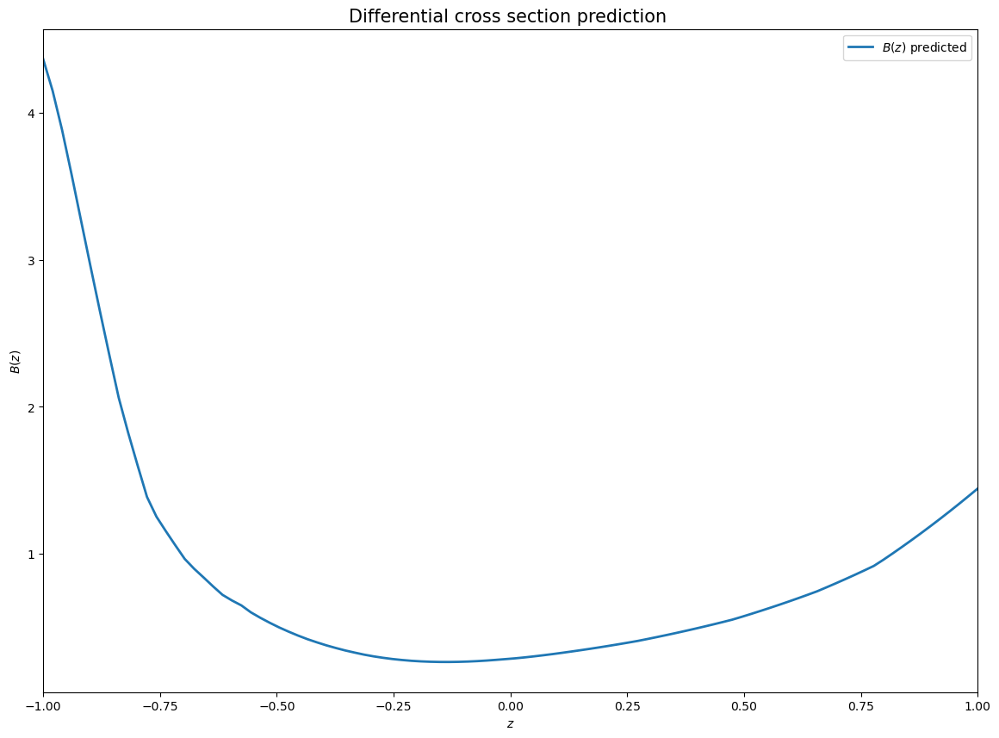

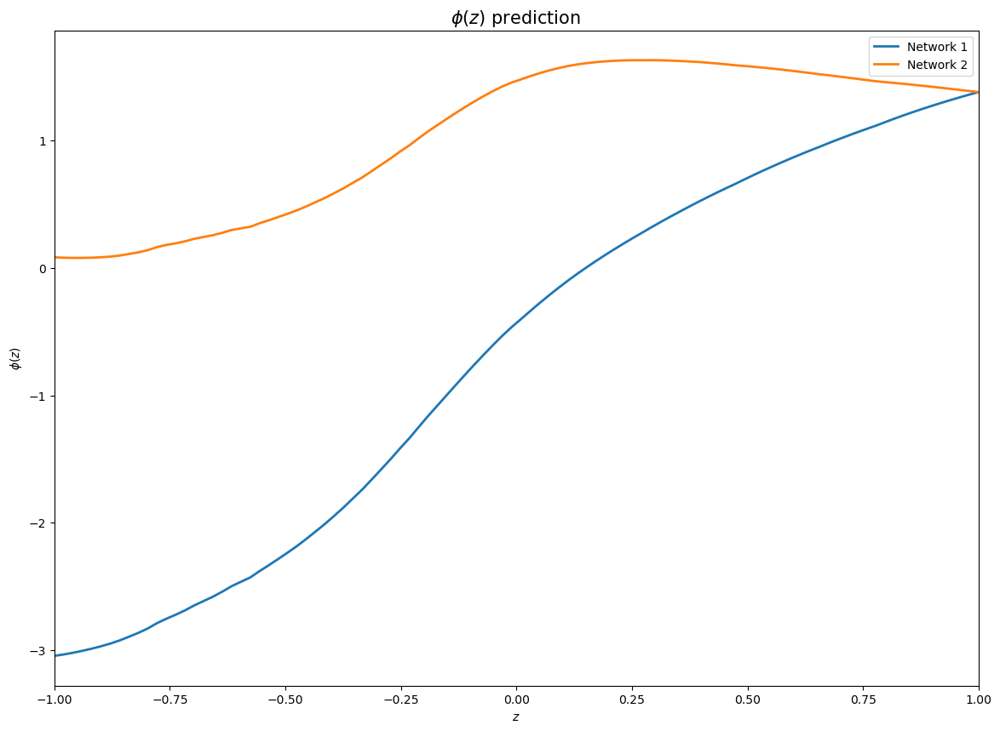

In [170]:
plot_init_values(log_sinmuscan_tot['networks'][min_arg])

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/402100053.py:5: RuntimeWarning: invalid value encountered in divide
  plt.quiver(pos_ar_x, pos_ar_y, utemp/normtemp, vtemp/normtemp, angles="xy", zorder=5, pivot="mid", scale=100)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/1529236210.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/1529236210.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


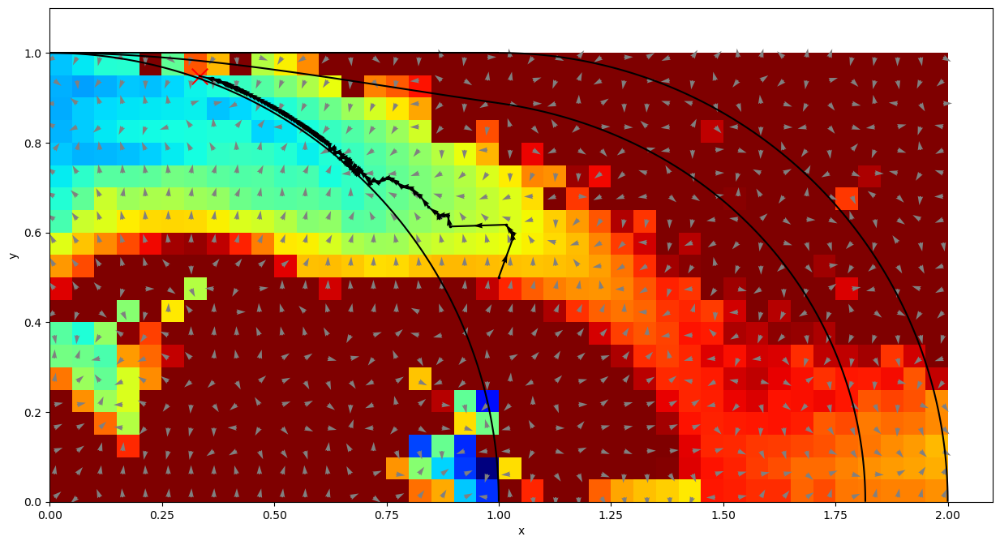

In [149]:
fig = plt.figure(figsize=(15, 10))
plt.scatter(np.array(log_sinmuscan_tot['points_visit'])[:,0], np.array(log_sinmuscan_tot['points_visit'])[:,1], marker='x', color='k', s=3)
plt.scatter(np.array(log_sinmuscan_tot['points_visit'])[min_arg,0], np.array(log_sinmuscan_tot['points_visit'])[min_arg,1], marker='x', color='r', s=200)
plt.plot(np.array(log_sinmuscan_tot['points_visit'])[:,0], np.array(log_sinmuscan_tot['points_visit'])[:,1],color='k')
plt.quiver(pos_ar_x, pos_ar_y, utemp/normtemp, vtemp/normtemp, angles="xy", zorder=5, pivot="mid", scale=100)
plt.imshow(np.transpose(new_log_test['sinmu']), cmap='jet', vmax=5.0, origin='lower', extent=[0,2,0,1])
plt.quiver(np.transpose(xt), np.transpose(yt), -ux2/normg2, -uy2/normg2, units='xy', scale=50, color='gray')
plot_atkinson_bound()
#run['evaluation/gradient_flow'].upload(File.as_image(fig))
plt.show()

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/2409759127.py:5: RuntimeWarning: invalid value encountered in divide
  plt.quiver(pos_ar_x, pos_ar_y, utemp/normtemp, vtemp/normtemp, angles="xy", zorder=5, pivot="mid", scale=100)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/1529236210.py:14: RuntimeWarning: divide by zero encountered in divide
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)
/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/1529236210.py:14: RuntimeWarning: invalid value encountered in multiply
  return (3*y/2)*(abs(1-x-y*1j)/abs(x+y*1j))*(abs(x+y*1j)-1/3)-abs(1-x-y*1j)


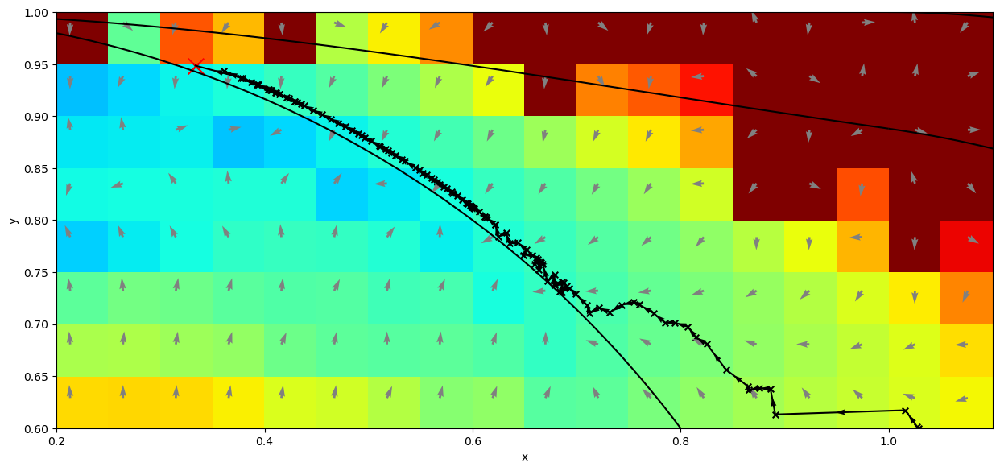

In [70]:
fig = plt.figure(figsize=(15, 10))
plt.scatter(np.array(log_sinmuscan_tot['points_visit'])[:,0], np.array(log_sinmuscan_tot['points_visit'])[:,1], marker='x', color='k', s=30)
plt.scatter(np.array(log_sinmuscan_tot['points_visit'])[min_arg,0], np.array(log_sinmuscan_tot['points_visit'])[min_arg,1], marker='x', color='r', s=200)
plt.plot(np.array(log_sinmuscan_tot['points_visit'])[:,0], np.array(log_sinmuscan_tot['points_visit'])[:,1],color='k')
plt.quiver(pos_ar_x, pos_ar_y, utemp/normtemp, vtemp/normtemp, angles="xy", zorder=5, pivot="mid", scale=100)
plt.imshow(np.transpose(new_log_test['sinmu']), cmap='jet', vmax=5.0, origin='lower', extent=[0,2,0,1])
plt.quiver(np.transpose(xt), np.transpose(yt), -ux2/normg2, -uy2/normg2, units='xy', scale=80, color='gray')
plot_atkinson_bound()
plt.xlim([0.2, 1.1])
plt.ylim([0.6, 1.0])
#run['evaluation/gradient_flow_zoom'].upload(File.as_image(fig))
plt.show()

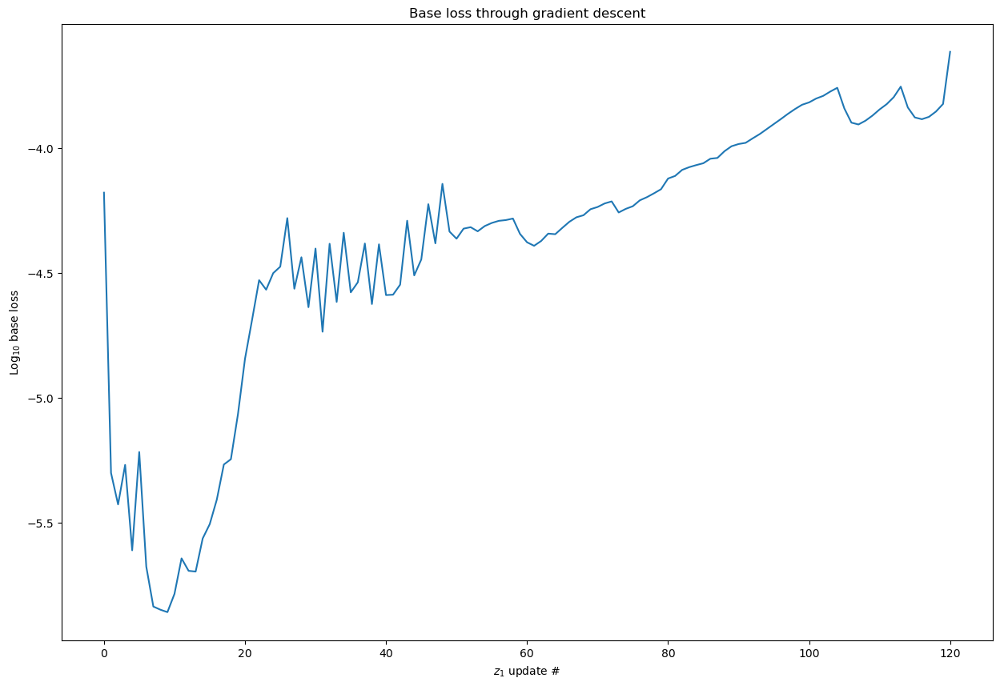

In [73]:
fig = plt.figure(figsize=(15, 10))
plt.plot([np.log10(loss) for loss in log_sinmuscan_tot['loss_base']])
plt.title('Base loss through gradient descent')
plt.xlabel('$z_1$ update #')
plt.ylabel('Log$_{10}$ base loss')
#run['evaluation/base_loss'].upload(File.as_image(fig))
plt.show()

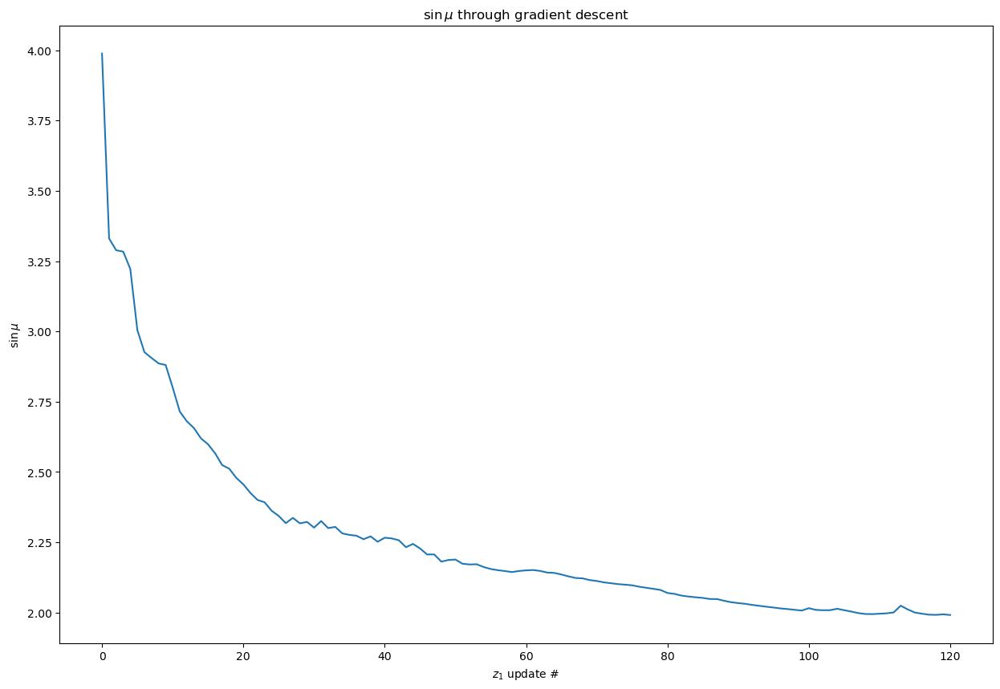

In [74]:
fig = plt.figure(figsize=(15, 10))
plt.plot(log_sinmuscan_tot['sinmu'])
plt.title('$\sin \mu$ through gradient descent')
plt.xlabel('$z_1$ update #')
plt.ylabel('$\sin \mu$')
#run['evaluation/sin_mu'].upload(File.as_image(fig))
plt.show()

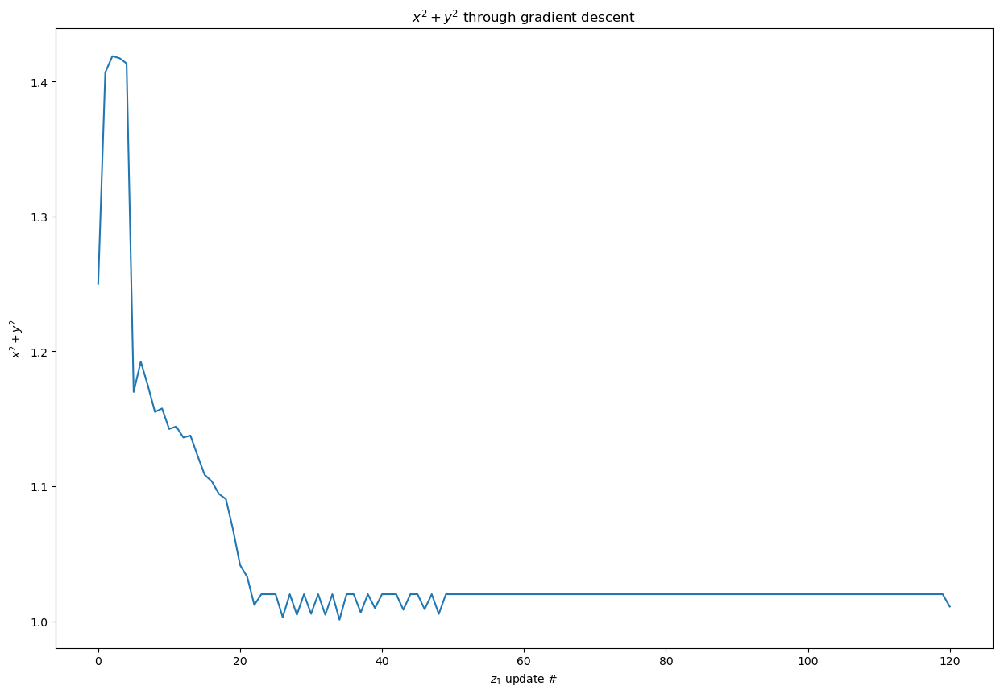

In [75]:
fig = plt.figure(figsize=(15, 10))
plt.plot([xp**2 + yp**2 for xp, yp in log_sinmuscan_tot['points_visit']])
plt.title('$x^2 + y^2$ through gradient descent')
plt.xlabel('$z_1$ update #')
plt.ylabel('$x^2 + y^2$')
#run['evaluation/unit_circle'].upload(File.as_image(fig))
plt.show()

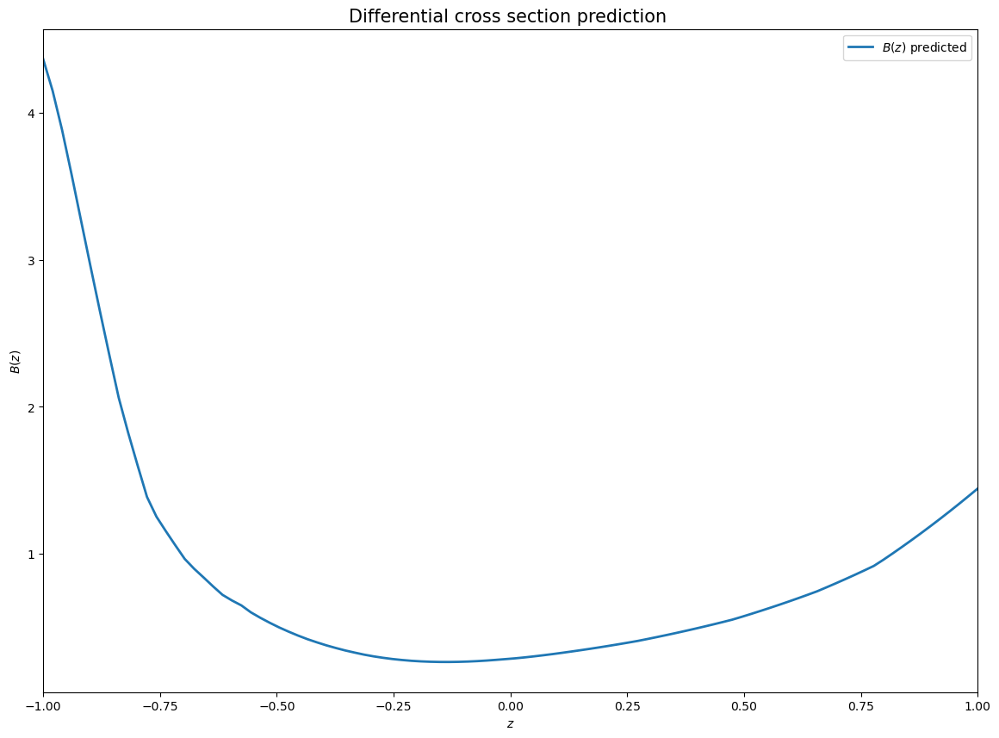

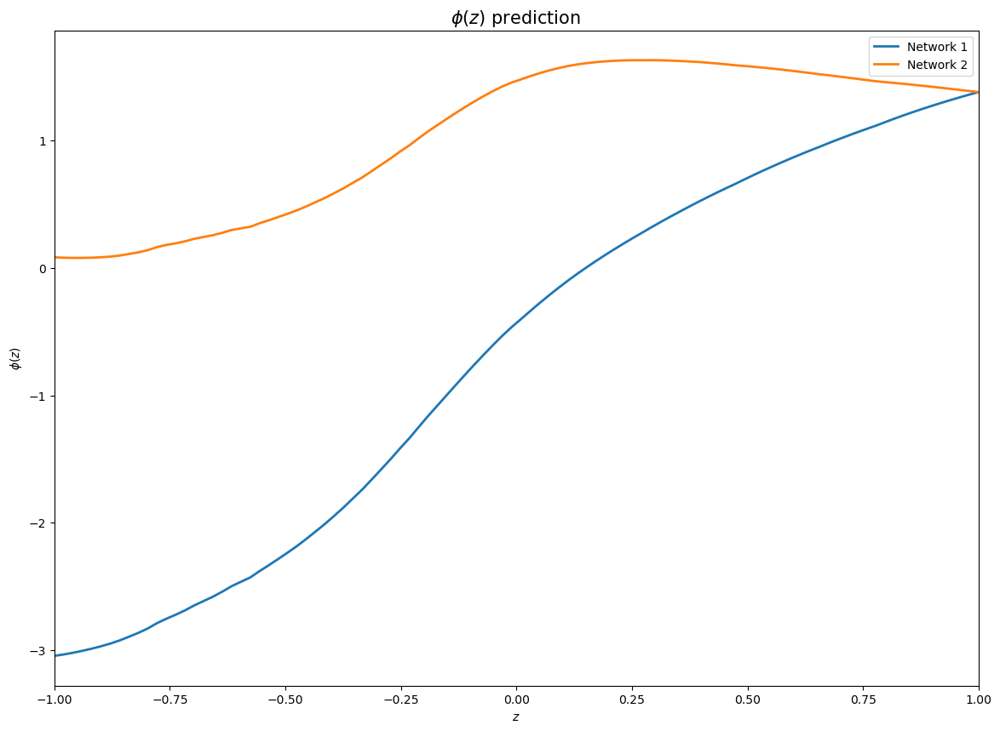

In [76]:
plot_init_values(log_sinmuscan_tot['networks'][min_arg])

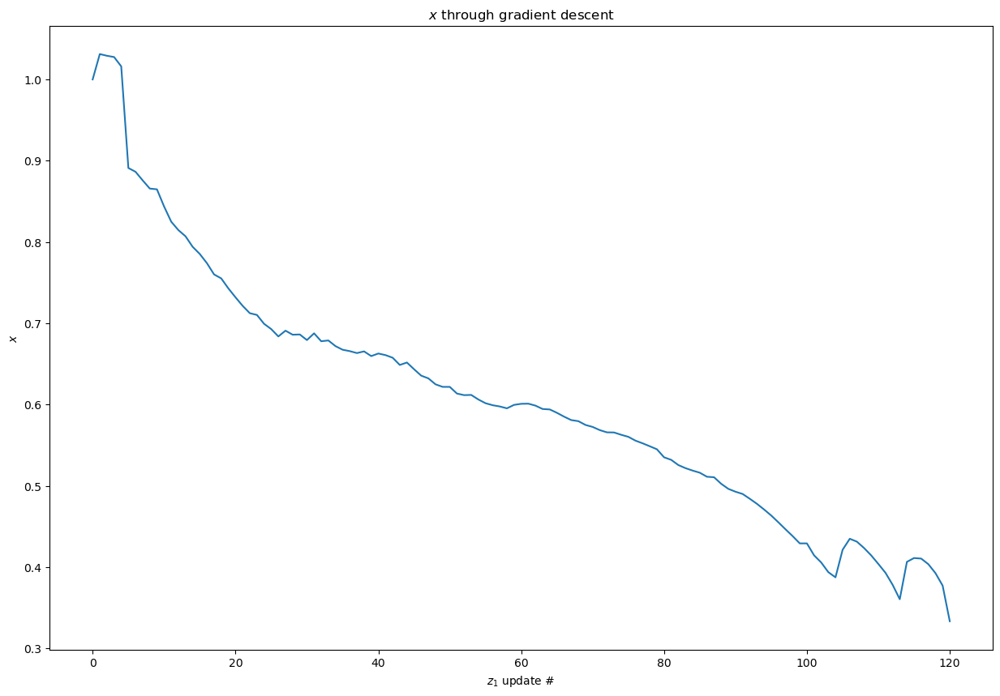

In [77]:
fig = plt.figure(figsize=(15, 10))
plt.plot([xp for xp, yp in log_sinmuscan_tot['points_visit']])
plt.title('$x$ through gradient descent')
plt.xlabel('$z_1$ update #')
plt.ylabel('$x$')
plt.show()

Combine everything

In [220]:
log_sinmuscan_tot = {'points_visit':[], 'sinmu': [], 'gradients':[], 'networks':[], 'loss_base':[], 'loss_scale':[]}
#log_sinmuscan_tot.update(deepcopy(log_sinmu_scan))
#log_sinmuscan_tot.update(deepcopy(log_sinmu_scan2))
#log_sinmuscan_tot.update(deepcopy(log_sinmu_scan3))

In [221]:
for key in log_sinmuscan_tot.keys():
    log_sinmuscan_tot[key].extend(deepcopy(log_sinmu_scan[key]))
    log_sinmuscan_tot[key].extend(deepcopy(log_sinmu_scan2[key]))
    log_sinmuscan_tot[key].extend(deepcopy(log_sinmu_scan3[key]))

In [373]:
path_init = '/Users/aurelien/PycharmProjects/JupyterNb/results_gradient_sinmu/'

for key in log_sinmuscan_tot.keys():
    if key == 'networks':
        print(key)
        for i, net in enumerate(log_sinmuscan_tot['networks']):
            end_path = '_{}.pth'.format(i)
            path = path_init + str(key) + end_path
            torch.save(net.cpu(), path)
    else:
        print(key)
        end_path = '.npy'
        path = path_init + str(key) + end_path
        #array_new = np.array([val.cpu() for val in log_sinmuscan_tot[key]])
        np.save(path, log_sinmuscan_tot[key]) 

points_visit
sinmu
gradients
networks
loss_base
loss_scale


#### Study the individual phase shifts

In [78]:
l1_tot = []
l2_tot = []

for net in log_sinmuscan_tot['networks']:
    nettemp = deepcopy(net)
    nettemp.device = device
    nettemp.to(device)
    l1t, l2t = legendre_fit_amplitudes(nettemp)
    l1_tot.append(l1t)
    l2_tot.append(l2t)

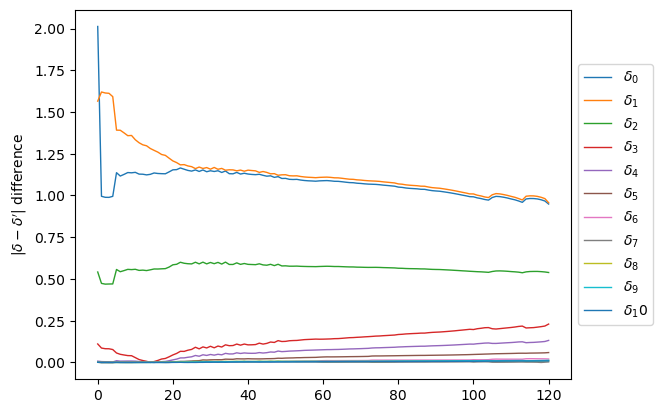

In [116]:
diff_deltas = [np.abs(np.array(l1_el) - np.array(l2_tot[i]) )for i, l1_el in enumerate(l1_tot)]
diff_array = np.array(diff_deltas).T
legend_el = []
for i in range(diff_array.shape[0]):
    plt.plot(diff_array[i],'-', linewidth = 1)     
    legend_el.append('$\delta_{}$'.format(i))

plt.ylabel('$|\delta - \delta\'|$ difference')
plt.legend(legend_el, loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [164]:
delta0_1 = [l1t[0] for l1t in l1_tot]
delta0_2 = [l2t[0] for l2t in l2_tot]
delta1_1 = [l1t[1] for l1t in l1_tot]
delta1_2 = [l2t[1] for l2t in l2_tot]
points_range = [i for i in range(len(l1_tot))]

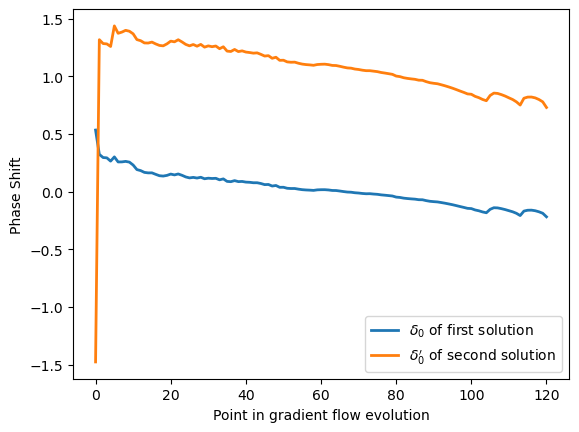

In [165]:
plt.plot(points_range,delta0_1, '-', linewidth = 2)       
plt.plot(points_range,delta0_2, '-', linewidth = 2)
plt.legend(['$\delta_0$ of first solution','$\delta_0\'$ of second solution'])
plt.ylabel('Phase Shift')
plt.xlabel('Point in gradient flow evolution')
plt.show()

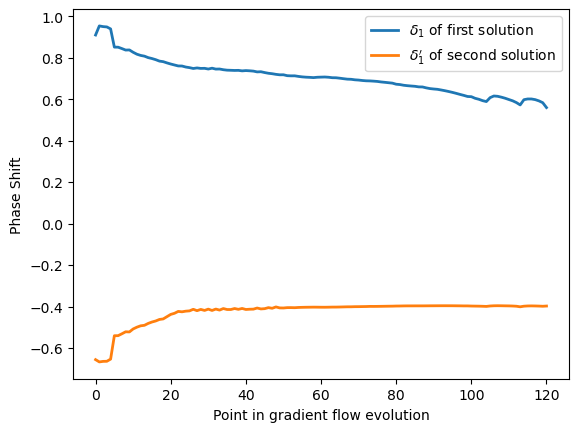

In [166]:
plt.plot(points_range,delta1_1, '-', linewidth = 2)       
plt.plot(points_range,delta1_2, '-', linewidth = 2)      
plt.legend(['$\delta_1$ of first solution','$\delta_1\'$ of second solution'])
plt.ylabel('Phase Shift')
plt.xlabel('Point in gradient flow evolution')
plt.show()

In [117]:
l1_tot2 = []
l2_tot2 = []

pbar = tqdm(total = log_res_test['sinmu'].size, unit='grid_point')

for i, params_lin in enumerate(param_grid):

    x_index = i % num_x
    y_index = int((i - i % num_x)/num_x)

    net_nn = torch.load("/Users/aurelien/Documents/Projects/S-matrix_bootstrap/models/model3/model_z1_scan_{}_{}.pth".format(x_index, y_index), map_location=torch.device('cpu'))
    net_nn.device = device
    net_nn.to(device)
    
    pre_trained_amps_z1=deepcopy(net_nn)
    params_scan['zeros'] = [[scan_range_x[x_index], scan_range_y[y_index]]]
    netsolver = create_solver_with_net(params_scan, device, pre_trained_amps_z1, seed_num=42)

    _, eval_loss_base, _, _ = eval_run_scan(netsolver, params_scan, device)
    
    if eval_loss_base<10**(-4):

        l1t, l2t = legendre_fit_amplitudes(net_nn)
        l1_tot2.append(l1t)
        l2_tot2.append(l2t)
    
    pbar.update(1)

  0%|          | 0/800 [00:00<?, ?grid_point/s]

/var/folders/72/3_7s1hmx5b51pxyxq3_zkbxw0000gn/T/ipykernel_31725/2338459653.py:43: RuntimeWarning: invalid value encountered in arcsin
  coeffs2 = [np.sign(np.real(fit_val))*np.sign(np.cos(np.arcsin(np.abs(fit_val / (2*i+1)))))*np.arcsin(np.abs(fit_val / (2*i+1)))  for i, fit_val in enumerate(fit2)]


In [118]:
delta0_1b = [l1t[0] for l1t in l1_tot2]
delta0_2b = [l2t[0] for l2t in l2_tot2]
delta1_1b = [l1t[1]*360/(2*math.pi) for l1t in l1_tot2]
delta1_2b = [l2t[1]*360/(2*math.pi) for l2t in l2_tot2]
points_rangeb = [i for i in range(len(l1_tot2))]

In [119]:
delta0_1c, delta0_2c = zip(*sorted(zip(delta0_1b, delta0_2b)))
delta1_1c, delta1_2c = zip(*sorted(zip(delta1_1b, delta1_2b)))

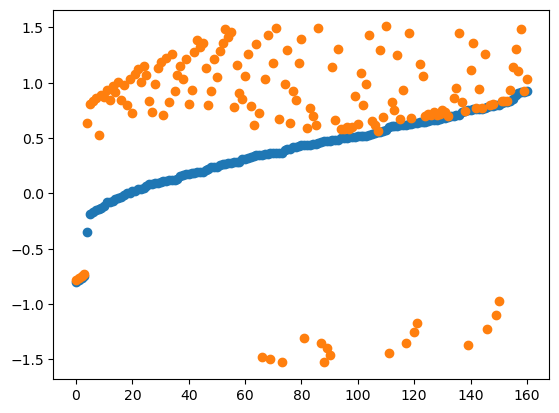

In [122]:
plt.scatter(points_rangeb,delta0_1c)       
plt.scatter(points_rangeb,delta0_2c)      
plt.show()

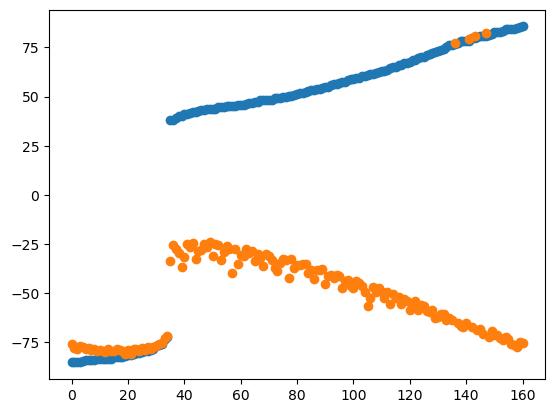

In [121]:
plt.scatter(points_rangeb,delta1_1c)       
plt.scatter(points_rangeb,delta1_2c)      
plt.show()

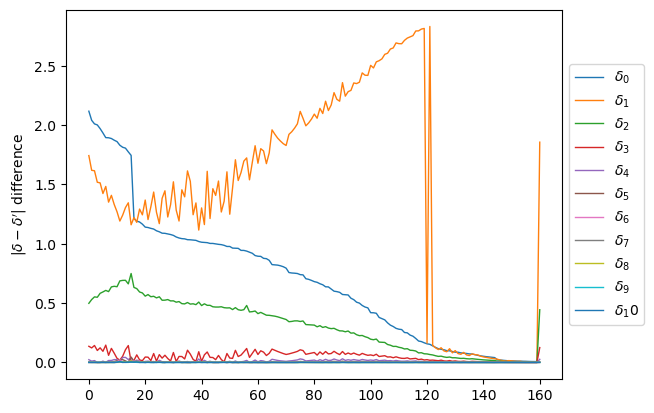

In [133]:
diff_deltas2 = [np.abs(np.array(l1_el) - np.array(l2_tot2[i]) )for i, l1_el in enumerate(l1_tot2)]
diff_array2 = np.array(diff_deltas2).T
diff_array2 = diff_array2[:, np.argsort(-diff_array2, axis=1)[0]]
legend_el = []
for i in range(diff_array2.shape[0]):
    plt.plot(diff_array2[i],'-', linewidth = 1)     
    legend_el.append('$\delta_{}$'.format(i))

plt.ylabel('$|\delta - \delta\'|$ difference')
plt.legend(legend_el, loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

## Resolve now when taking out mulitple zeros

https://app.neptune.ai/zulap/2to2scattering/e/TOS-2027
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.
ModuleAmplitudes(
  (base_f): ModuleNetAmplitude(
    (activation): ReLU()
    (positive_activ): Softplus(beta=1, threshold=20)
    (model): Sequential(
      (layer_1): Linear(in_features=1, out_features=64, bias=True)
      (activation_1): ReLU()
      (layer_2): Linear(in_features=64, out_features=64, bias=True)
      (activation_2): ReLU()
      (layer_3): Linear(in_features=64, out_features=64, bias=True)
      (activation_3): ReLU()
      (layer_4): Linear(in_features=64, out_features=64, bias=True)
      (activation_4): ReLU()
      (layer_5): Linear(in_features=64, out_features=2, bias=True)
    )
  )
)


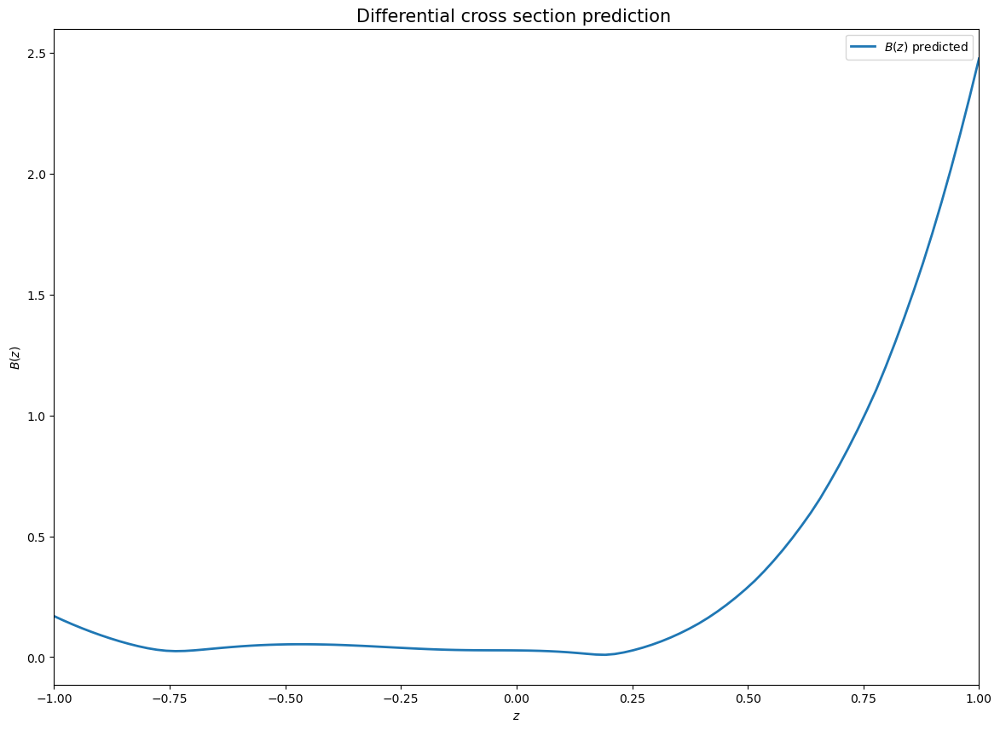

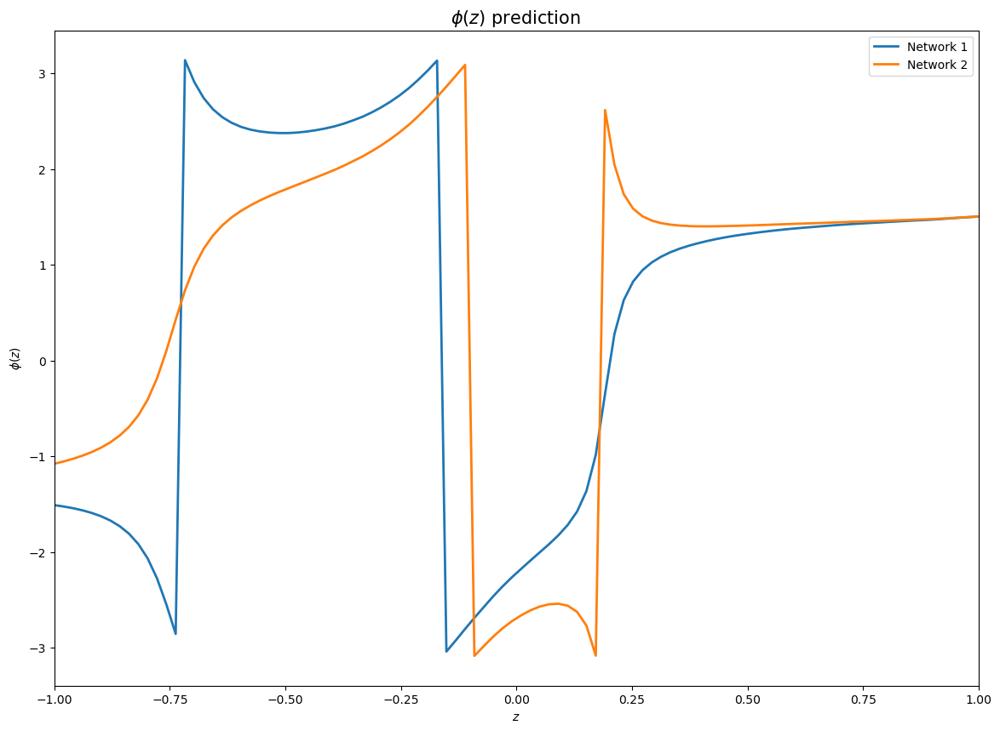

  0%|          | 0/5000 [00:00<?, ?epoch/s]

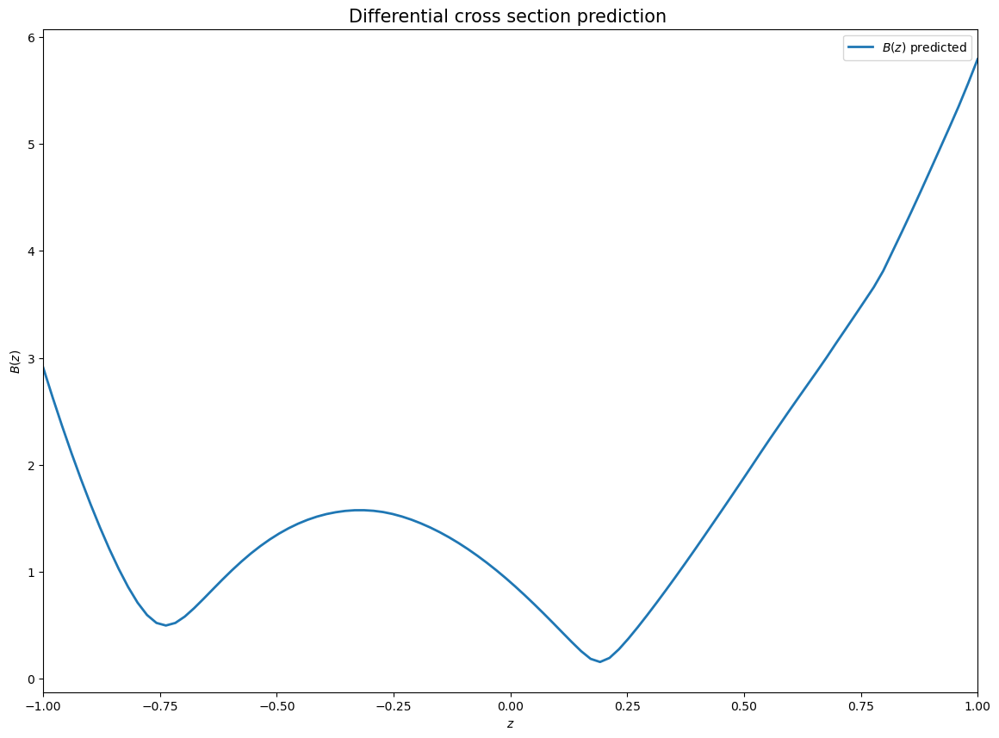

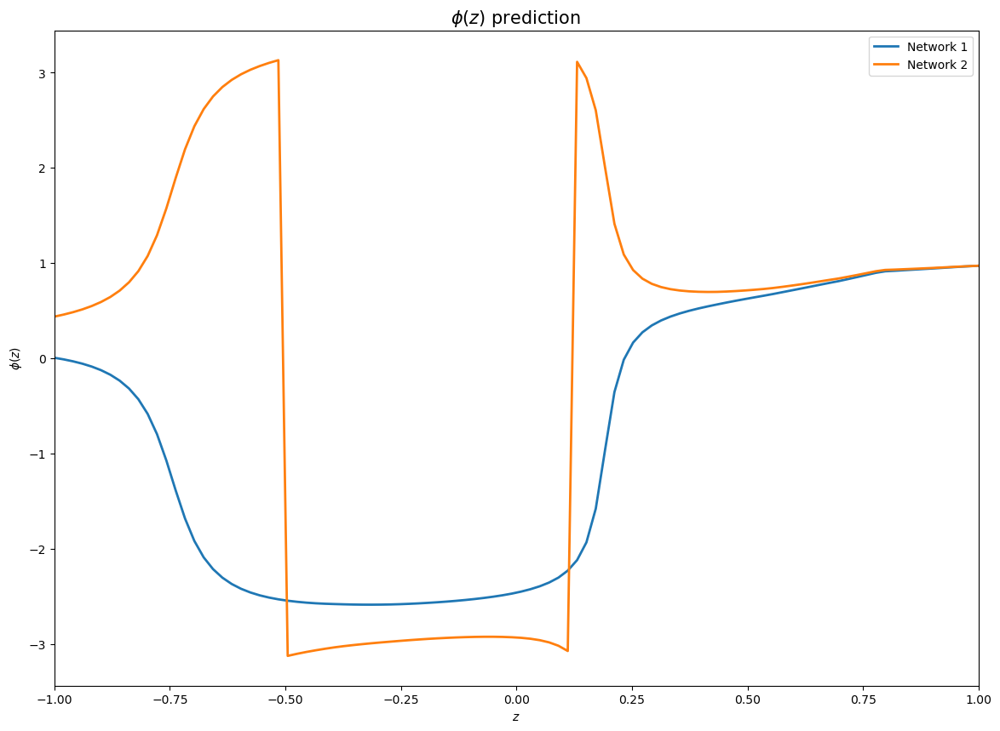

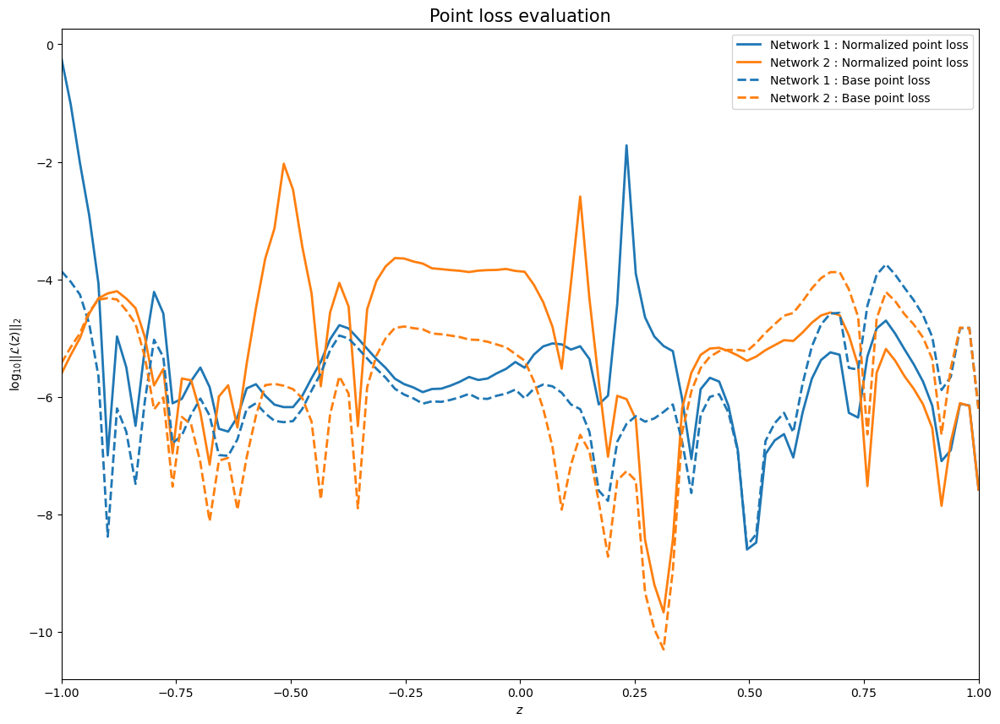

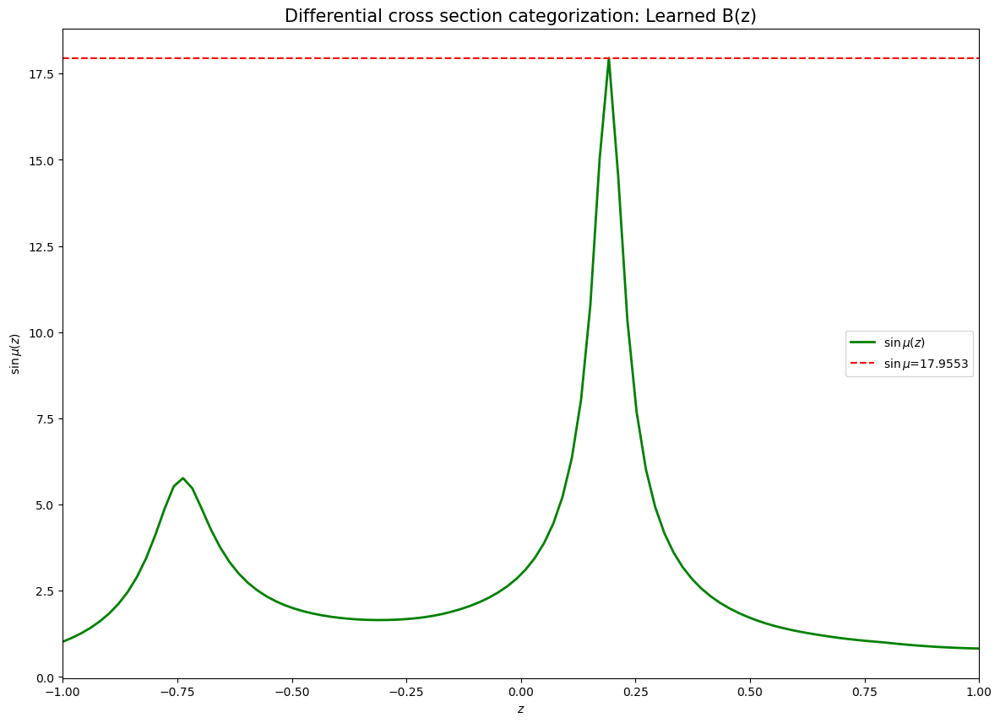

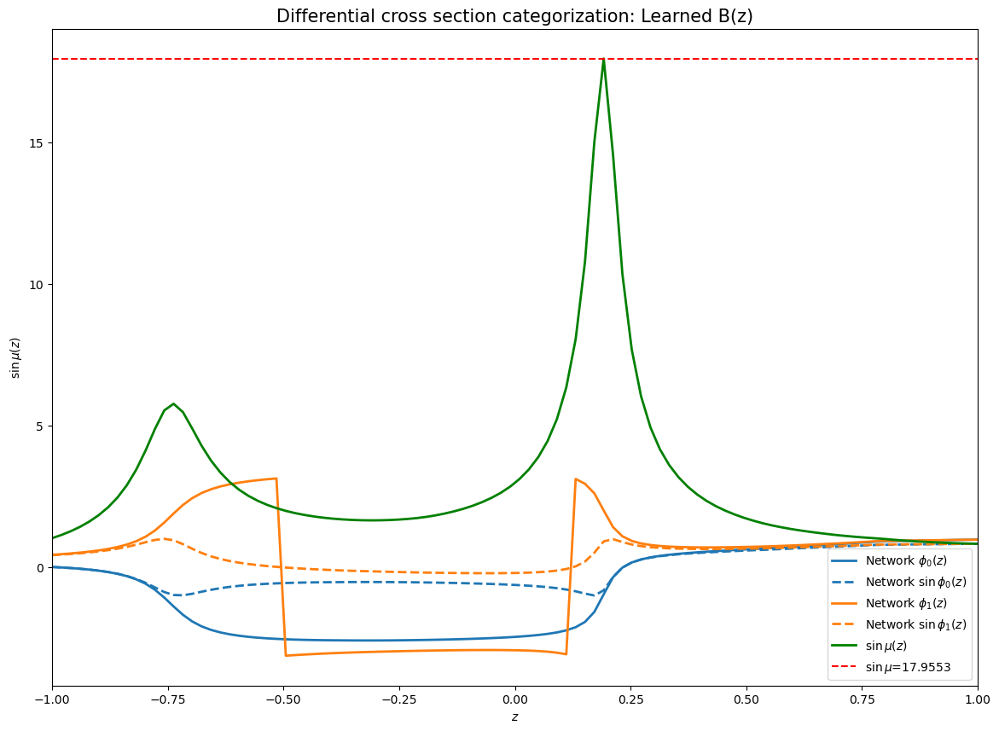

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 140 operations to synchronize with Neptune. Do not kill this process.
All 140 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-2027


In [71]:
from copy import deepcopy

seeds = [42]

for seed in seeds:
    
    # Start the Neptune logger run
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_amb_test")

    params = {'batch_size': 64,
             'epochs_num': 5000,
             'repulsive_epochs': [0, 1000],
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             #'zeros': [[1.4, 0.2], [1.26473684, 1.33]],
             'zeros': [[0.191248, 0.0291457], [-0.743792, -0.0628425]],
             'zeros_learn': False, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive': 2.0}

    tags = {'Ambiguity': 'Double z1', 'optimizer': 'Adam', 'Mode': 'Constant param' , 'Seed': str(seed)}
    run["sys/tags"].add(list(tags.values()))

    run['parameters'] = params

    network_input = deepcopy(netsolver_fixed.amps_net)
    network_input.zeros = params['zeros']
    
    netsolver_test = train_run(params, device, run, seed_num=seed, optim_name='Adam', amps_net=network_input)

    zpointseval, modeval, phievals, eval_pt_loss_s, eval_pt_loss_no_s  = eval_run_amp(netsolver_test, params, device, run)

    plot_bmod(zpointseval, modeval, run)
    plot_phases(zpointseval, phievals, run)
    plot_point_losses(zpointseval, eval_pt_loss_s, eval_pt_loss_no_s, run)

    integralz = sin_mu_integral(netsolver_test, zpointseval)
    plot_sin_mu(zpointseval, integralz, run)

    plot_summaries(zpointseval, phievals, integralz, run)


    # Make sure to kill the Neptune logger run
    run.stop()

Nice pictures

In [72]:
def reduce_domain(x):
    newx = np.array([angle-2*math.pi if angle > math.pi else angle for angle in x])
    return newx

def amplitudel3polynomial(a, z1, z2, z3, z):
    return a*(z-z1)*(z-z2)*(z-z3)/((1-z1)*(1-z2)*(1-z3))

In [73]:
soll31=amplitudel3polynomial(2.80071+1j*4.66678, 1.31603+1j*0.954597, 0.191248+1j*0.0291457, -0.743792-1j*0.0628425, zpointseval.cpu())
soll32=amplitudel3polynomial(2.80071+1j*4.66678, 1.31603+1j*0.954597, 0.191248-1j*0.0291457, -0.743792+1j*0.0628425, zpointseval.cpu())

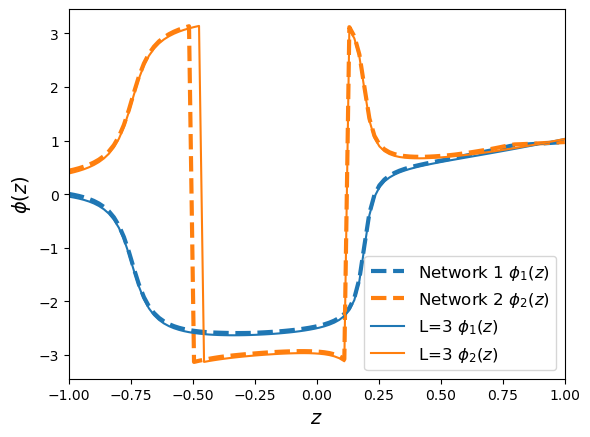

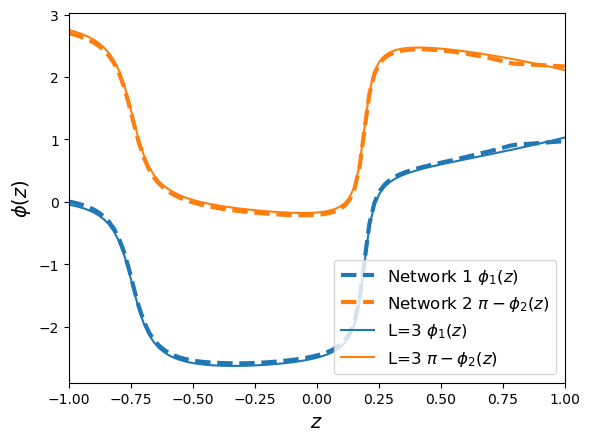

In [74]:
fig = plt.figure()

plt.plot(zpointseval.cpu(),phievals[0], '--', linewidth = 3)
plt.plot(zpointseval.cpu(), phievals[1], '--', linewidth = 3)
plt.plot(zpointseval.cpu(),np.angle(soll31), '-', linewidth = 1.5, color='tab:blue')
plt.plot(zpointseval.cpu(),np.angle(soll32), '-', linewidth = 1.5, color='tab:orange')      
plt.xlabel('$z$', fontsize=14)
plt.ylabel('$\phi(z)$', fontsize=14)    

plt.legend(['Network {} $\phi_{}(z)$'.format(i+1, i+1) for i in range(2)] + ['L=3 $\phi_1(z)$','L=3 $\phi_2(z)$'], fontsize=12)
plt.xlim([-1,1])
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Multiple_zeros/phases1.pdf',bbox_inches='tight')

fig = plt.figure()

plt.plot(zpointseval.cpu(),phievals[0], '--', linewidth = 3)
plt.plot(zpointseval.cpu(),reduce_domain(math.pi-phievals[1]), '--', linewidth = 3)
plt.plot(zpointseval.cpu(),np.angle(soll31), '-', linewidth = 1.5, color='tab:blue')      
plt.plot(zpointseval.cpu(),reduce_domain(math.pi-np.angle(soll32)), '-', linewidth = 1.5, color='tab:orange')      
plt.xlabel('$z$', fontsize=14)
plt.ylabel('$\phi(z)$', fontsize=14)    

plt.legend(['Network 1 $\phi_1(z)$', 'Network 2 $\pi - \phi_2(z)$'] + ['L=3 $\phi_1(z)$','L=3 $\pi -\phi_2(z)$'], fontsize=12)
plt.xlim([-1,1])
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Multiple_zeros/phases2.pdf',bbox_inches='tight')

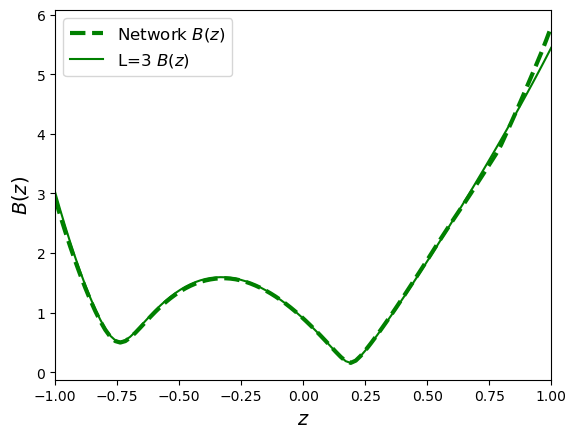

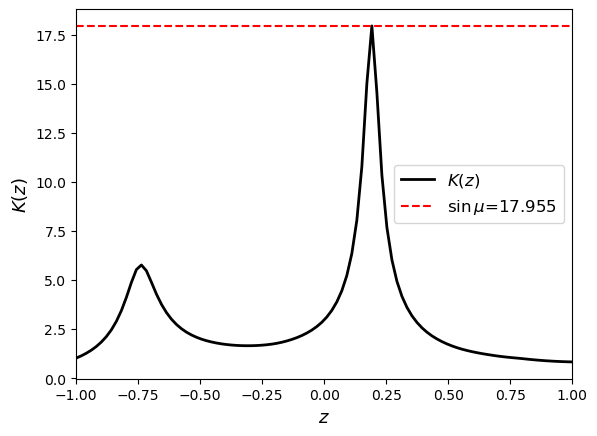

In [75]:
#fig = plt.figure(figsize=(14, 10))
fig = plt.figure()
    
plt.plot(zpointseval.cpu(),modeval, '--', linewidth = 3, c='g')       
plt.plot(zpointseval.cpu(),np.abs(soll31), '-', linewidth = 1.5, c='g')   
plt.xlabel('$z$', fontsize=14)
plt.ylabel('$B(z)$', fontsize=14)    

plt.legend(['Network $B(z)$'] + ['L=3 $B(z)$'], fontsize=12)
plt.xlim([-1,1])
plt.show()
#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Multiple_zeros/mods.pdf',bbox_inches='tight')


sinmu_l3 = max(integralz.cpu())

fig = plt.figure()
plt.plot(zpointseval.cpu(),integralz.cpu(), 'k-', linewidth = 2)   
plt.plot(zpointseval.cpu(),sinmu_l3.repeat(integralz.size(dim=0)), 'r--' )   
plt.xlabel('$z$', fontsize=13)
plt.ylabel('$K(z)$', fontsize=13)    
plt.xlim([-1,1])
plt.legend(['$K(z)$','$\sin \mu$={}'.format(str(np.round(sinmu_l3.numpy(),3)))], fontsize=12)
plt.show()

#fig.savefig('/Users/aurelien/Documents/Projects/S-matrix_bootstrap/pictures/paper/Multiple_zeros/kernel.pdf',bbox_inches='tight')

Other point

In [ ]:
seeds = [42]

for seed in seeds:
    
    # Start the Neptune logger run
    run = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_amb_test")

    params = {'batch_size': 64,
             'epochs_num': 5000,
             'repulsive_epochs': [0, 1000],
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             'zeros': [[1.4, 0.2], [1.26473684, 1.33]],
             'zeros_learn': False, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive': 1.0}

    tags = {'Ambiguity': 'Double z1', 'optimizer': 'Adam', 'Mode': 'Constant param' , 'Seed': str(seed)}
    run["sys/tags"].add(list(tags.values()))

    run['parameters'] = params

    network_input = deepcopy(netsolver_init.amps_net)
    network_input.zeros = params['zeros']
    
    netsolver_test = train_run(params, device, run, seed_num=seed, optim_name='Adam', amps_net=network_input)

    zpointseval, modeval, phievals, eval_pt_loss_s, eval_pt_loss_no_s  = eval_run_amp(netsolver_test, params, device, run)

    plot_bmod(zpointseval, modeval, run)
    plot_phases(zpointseval, phievals, run)
    plot_point_losses(zpointseval, eval_pt_loss_s, eval_pt_loss_no_s, run)

    integralz = sin_mu_integral(netsolver_test, zpointseval)
    plot_sin_mu(zpointseval, integralz, run)

    plot_summaries(zpointseval, phievals, integralz, run)


    # Make sure to kill the Neptune logger run
    run.stop()

In [22]:
al1, al2 = legendre_fit_amplitudes(netsolver_test.amps_net, sample_points=100, get_deltas=False, deg=20)

In [23]:
np.abs(al1)**2 - np.imag(al1)

array([-4.94606859e-03, -2.04746885e-03, -9.25378720e-03, -1.34241191e-04,
       -2.38924966e-04, -6.84114597e-05, -3.45641554e-04, -1.74170048e-05,
       -1.55643972e-04, -3.13537339e-05, -1.38981905e-04, -1.14027833e-04,
       -5.22344407e-05,  4.17405876e-05, -1.34856168e-05, -7.27852530e-05,
       -7.98882616e-05, -8.09414767e-05, -5.74768996e-05, -1.59294344e-05,
        1.47540144e-05])

In [24]:
np.abs(al2)**2 - np.imag(al2)

array([-6.32009527e-03,  1.55558820e-04, -8.96755998e-03, -9.61243992e-04,
       -8.60559239e-04,  3.41419175e-04, -4.03685272e-04,  3.02269678e-05,
       -1.63551040e-04,  1.37830865e-05, -1.14893483e-04, -1.47050448e-04,
       -9.31489278e-05,  4.79541360e-05,  1.20633666e-05, -7.22034989e-05,
       -7.15601768e-05, -1.01986327e-04, -6.22730414e-05,  3.22128364e-06,
        9.27225036e-06])

### Do a scan now on the $z_2$ points

In [62]:
# Number of sampling points in both directions
num_x = 20
num_y = 10

# Prepare the grid of points
scan_range_x = np.linspace(0.01, 2.99, num=num_x)
scan_range_y = np.linspace(0.01, 1.99, num=num_y)
param_grid = np.dstack(np.meshgrid(scan_range_x, scan_range_y)).reshape(-1, 2)

# Prepare the seeds
seeds = [42]


run_scan_z2 = neptune.init_run(project=NEPTUNE_PROJECT, api_token=NEPTUNE_API_TOKEN, name="Run_Scan_z1")

log_res_z2 = {'params':param_grid, 'sinmu':np.empty([num_x, num_y, len(seeds)]), 'base_loss':np.empty([num_x, num_y, len(seeds)]), 'scale_loss':np.empty([num_x, num_y, len(seeds)]), 'repulsive_loss':np.empty([num_x, num_y, len(seeds)])}

for i, params_lin in enumerate(tqdm(param_grid, unit='grid_point')):
        
    x_index = i % num_x
    y_index = int((i - i % num_x)/num_x)
    
    params_scan2 = {'batch_size': 64,
             'epochs_num': 1500,
             'repulsive_epochs': [0, 1000],
             'learning_rate': 0.003,
             'lr_scheduler': True, 
             'beta1' : 0.9,
             'beta2' : 0.999,
             'integral_points': 25,
             'method_int': 'trapz',
             'layer_list': [64, 64, 64, 64],
             'loss': 'MSE',
             'scaled_loss': True,
             'zeros': [[1.4, 0.2], [scan_range_x[x_index], scan_range_y[y_index]]],
             'zeros_learn': False, 
             'zeros_freeze': True, 
             'disconnected': False,
             'complex_pred': True,
             'p_value': 2,
             'lambda_repulsive': 0.0}
    
    # Start from the same pretrained network
    pre_trained_amps_z1=deepcopy(netsolver_init.amps_net)
    pre_trained_amps_z1.zeros = [[1.4, 0.2], [scan_range_x[x_index], scan_range_y[y_index]]]
    
    tags = {'Ambiguity': 'Double z1', 'optimizer': 'Adam', 'Mode': 'Constant param'}
    run_scan_z2["sys/tags"].add(list(tags.values()))

    run_scan_z2['parameters'] = params_scan2
    
    sinmu_pt = []
    base_loss_pt = []
    scale_loss_pt = []
    repulsive_loss_pt = []
    
    for seed in tqdm(seeds, unit='seed',leave = False):
            
        netsolver = train_run(params_scan2, device, run_scan_z2, seed_num=seed, optim_name='Adam', plot_init=False, amps_net=pre_trained_amps_z1)

        zpointseval, eval_loss_base, eval_loss_scaled, repulsive_loss = eval_run_scan(netsolver, params_scan2, device, run_scan_z2)
        sinmu = max(sin_mu_integral(netsolver, zpointseval).cpu())
        
        sinmu_pt.append(sinmu.cpu().numpy())
        base_loss_pt.append(eval_loss_base.cpu().numpy())
        scale_loss_pt.append(eval_loss_scaled.cpu().numpy())
        repulsive_loss_pt.append(repulsive_loss.cpu().numpy())
        
    log_res_z2['sinmu'][x_index, y_index, :] = np.array(sinmu_pt)
    log_res_z2['base_loss'][x_index, y_index, :] = np.array(base_loss_pt)
    log_res_z2['scale_loss'][x_index, y_index, :] = np.array(scale_loss_pt)
    log_res_z2['repulsive_loss'][x_index, y_index, :] = np.array(repulsive_loss_pt)

https://app.neptune.ai/zulap/2to2scattering/e/TOS-1798
Remember to stop your run once you’ve finished logging your metadata (https://docs.neptune.ai/api/run#stop). It will be stopped automatically only when the notebook kernel/interactive console is terminated.


  0%|          | 0/200 [00:00<?, ?grid_point/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

  0%|          | 0/1 [00:00<?, ?seed/s]

  0%|          | 0/1500 [00:00<?, ?epoch/s]

In [63]:
run_scan_z2.stop()

Shutting down background jobs, please wait a moment...
Done!
Waiting for the remaining 248 operations to synchronize with Neptune. Do not kill this process.
All 248 operations synced, thanks for waiting!
Explore the metadata in the Neptune app:
https://app.neptune.ai/zulap/2to2scattering/e/TOS-1798


In [64]:
new_log_res_z2 = update_log_results(log_res_z2, base_threshold=0.0001, repulsive_threshold=10.0)

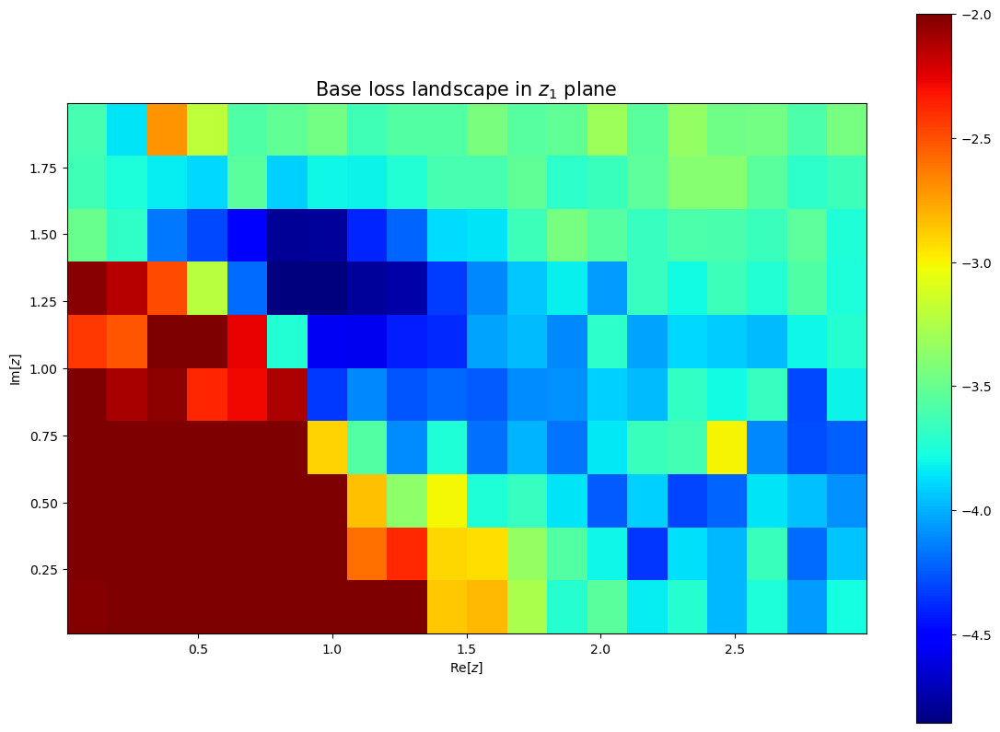

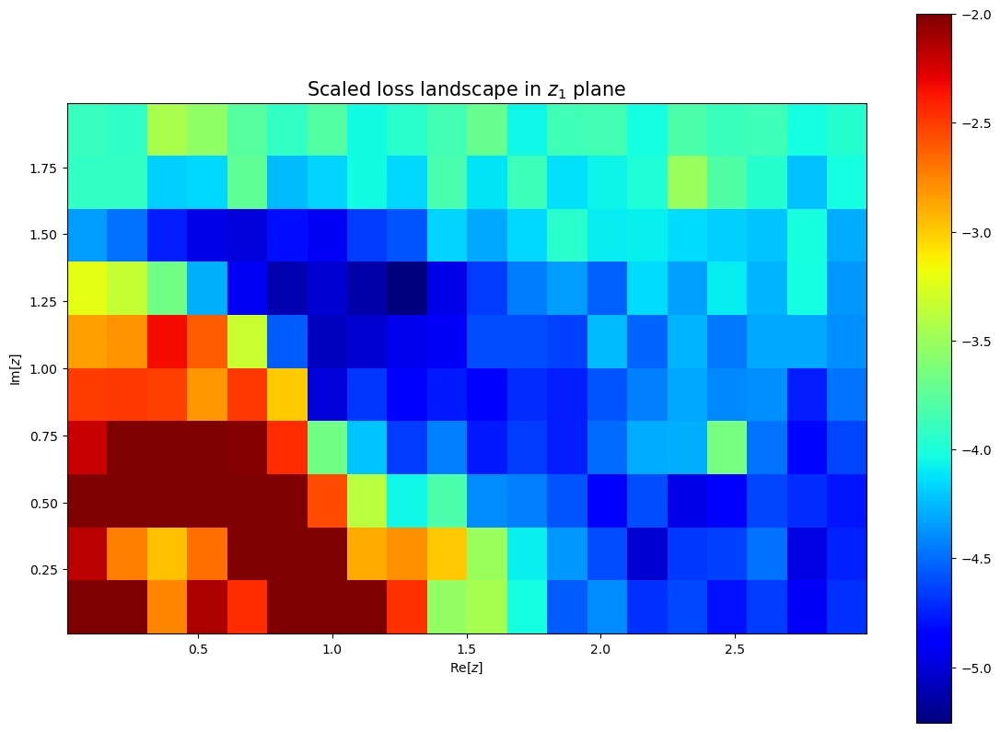

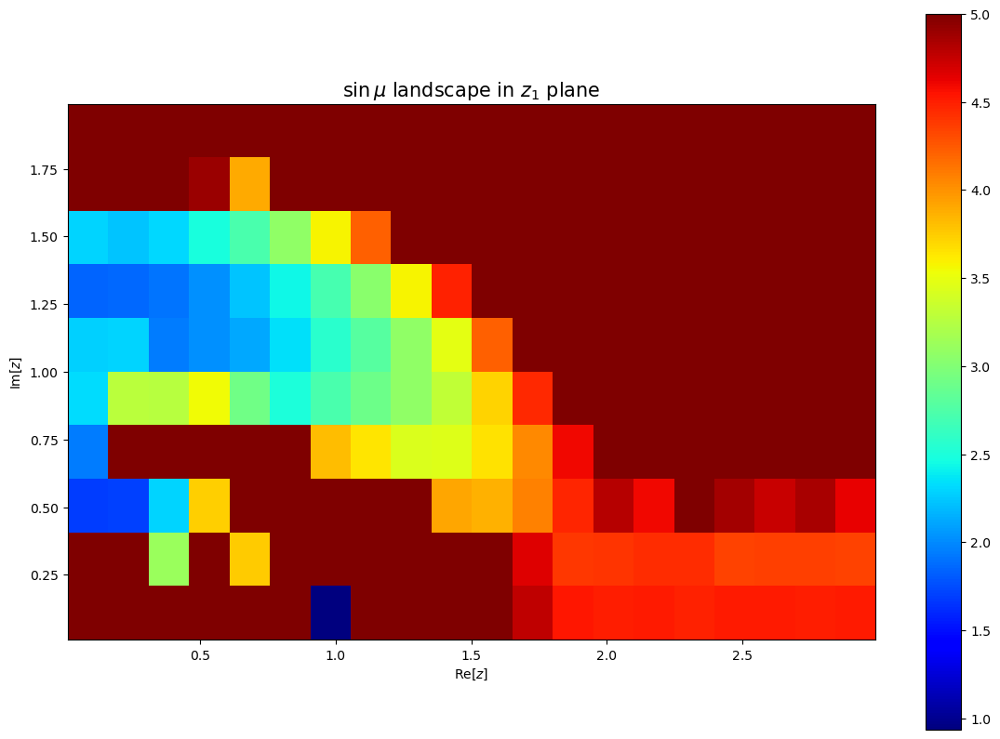

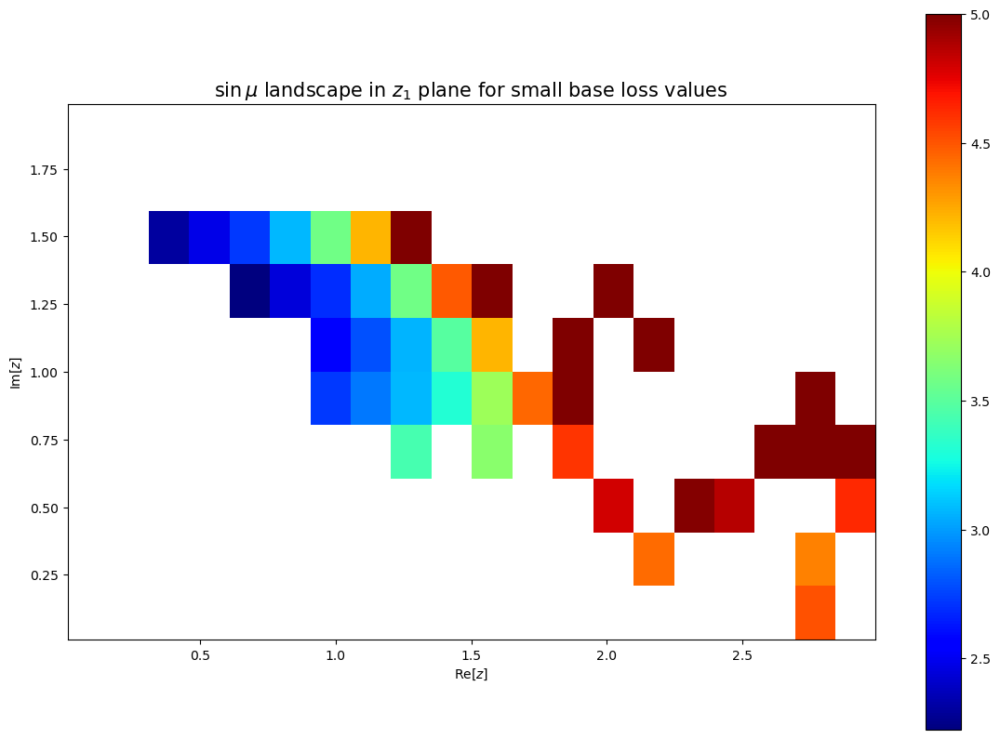

In [65]:
plot_contour_loss_curves_linear(new_log_res_z2, run_scan_z2, log_type='base10', logging=False)